In [1]:
# from google.colab import drive
# drive.mount('/content/drive')

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import statsmodels.api as sm
from pylab import rcParams
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

In [3]:
# DIRECTORY = '/content/drive/My Drive/Informatics/Sphere@mail.ru/1_Data_Analysis/kaggle/'
DIRECTORY = '/kaggle/input/sputnik-sphere-2020-a/'

## Funcs

In [4]:
def get_error(df):
    return np.linalg.norm(df.loc[:,['x', 'y', 'z']].values - df.loc[:,['x_sim', 'y_sim', 'z_sim']].values, axis=1)

In [5]:
def smape(y_true, y_pred): 
    return np.mean(2 * np.abs(y_true - y_pred) / (np.abs(y_true) + np.abs(y_pred))) * 100

In [6]:
from sklearn.metrics import mean_squared_error

def rmse(y_actual, y_predicted):
    rmse = np.sqrt(mean_squared_error(y_actual, y_predicted))
    return rmse

In [7]:
import time

def make_precision(df):
    name = str(time.time()) + "_predict.csv"
    with open(name, "w") as f:
        f.write(df.to_csv(columns=("id", "error"), index=False))
    print(name)

In [8]:
def validate(val, preds):
    preds.loc[:,'error'] = get_error(preds)
    score = smape(val['error'], preds['error'])
    return score

In [9]:
def plot_df(df, window=24, coord='error', other=None):
    fig, axes = plt.subplots(1, 1, sharey=False, sharex=False)
    fig.set_figwidth(14)
    fig.set_figheight(12)

    axes.plot(df.epoch, df[coord], label='Original')
    axes.plot(df.epoch, df[coord].rolling(window=window).mean(), label='Window')
    if other is not None:
        for i, y in enumerate(other):
            axes.plot(y.epoch, y[coord], label=f'Y{i}')
            axes.plot(y.epoch, y[coord].rolling(window=window).mean(), label=f'Y{i} Window')
    axes.legend(loc='best')

    plt.tight_layout()
    plt.show()

    print()
    print()

    # # STL-декомпозиция ряда
    # rcParams['figure.figsize'] = 12, 8
    # result = sm.tsa.seasonal_decompose(df[coord], model='additive',freq=window)
    # result.plot()
    # plt.title('STL-декомпозиция ряда')
    # plt.show()

In [10]:
# Слишком мало данных для TSS

# from sklearn.model_selection import TimeSeriesSplit 

# def tss_validate(model_name, data, **model_params):
#     errors = []
#     tscv = TimeSeriesSplit(n_splits=2)

#     xyz = 'x' in data.columns
    
#     for train_idx, test_idx in tscv.split(data):
#         if len(train_idx) < 24:
#             continue
#         model = model_name(**model_params)
        
#         wasNone = False

#         if xyz:
#             if model_params['modelType'] == 'prophet_linreg':
#                 df_preds = [
#                             data.iloc[test_idx].copy(),
#                             data.iloc[test_idx].copy()
#                 ]
#             else:
#                 df_preds = data.iloc[test_idx].copy()
#             for coord in ['x', 'y', 'z']:
#                 model.fit(data.iloc[train_idx][coord], data.iloc[train_idx]['epoch'])
#                 preds = model.predict(data.iloc[test_idx]['epoch'])
#                 if preds is None:
#                     wasNone = True
#                     break
#                 if model_params['modelType'] == 'prophet_linreg':
#                     df_preds[0][coord] = preds[0]
#                     df_preds[1][coord] = preds[1]
#                 else:
#                     df_preds[coord] = preds

#             if wasNone:
#                 score = np.inf
#             else:
#                 if model_params['modelType'] == 'prophet_linreg':
#                     score = (validate(data.iloc[test_idx], df_preds[0]), validate(data.iloc[test_idx], df_preds[1]))
#                 else:
#                     score = validate(data.iloc[test_idx], df_preds)
#         else:
#             model.fit(data.iloc[train_idx]['error'], data.iloc[train_idx]['epoch'])
#             preds = model.predict(data.iloc[test_idx]['epoch'])
#             if preds is None:
#                 score = np.inf
#             else:
#                 if model_params['modelType'] == 'prophet_linreg':
#                     score = (smape(data.iloc[test_idx]['error'], preds[0]), smape(data.iloc[test_idx]['error'], preds[1]))
#                 else:
#                     score = smape(data.iloc[test_idx]['error'], preds)

#         errors.append(score)
    
#     return np.mean(errors, axis=0)

In [11]:
def validate_1_3(model_name, data, **model_params):
    xyz = 'x' in data.columns

    train_size = data.shape[0] * 2 // 3
    train = data.iloc[:train_size]
    test = data.iloc[train_size:]
    # print(train.shape)}
    # print(test.shape)

    model = model_name(**model_params)
        
    wasNone = False

    if xyz:
        pass
    else:
        model.fit(train['error'], train['epoch'])
        preds = model.predict(test['epoch'])
        if preds is None:
            score = np.inf
        else:
            if model_params['modelType'] == 'prophet_linreg':
                score = (smape(test['error'], preds[0]), smape(test['error'], preds[1]))
            else:
                score = smape(test['error'], preds)
    
    return score

In [12]:
from itertools import product
def search_parameters(model_name, data, parameters):
    best_score = np.inf
    best_parameters = None
    keys = parameters.keys()
    for cur_param in product(*parameters.values()):
        params_to_set = dict()
        for i, key in enumerate(keys):
            params_to_set[key] = cur_param[i]
        score = validate_1_3(model_name, data, **params_to_set)
        if params_to_set['modelType'] == 'prophet_linreg':
            if score[0] < best_score:
                best_score = score[0]
                best_parameters = params_to_set
                best_parameters['modelType'] = 'prophet'
            if score[1] < best_score:
                best_score = score[1]
                best_parameters = params_to_set
                best_parameters['modelType'] = 'linreg'
        elif score < best_score:
            best_score = score
            best_parameters = params_to_set
    
    return best_score, best_parameters

In [13]:
def make_models_search(df_train, df_test, all_parameters, xyz=False, printData=False, plotPredict=True, plotData=False, idx=None, printBest=True):
    ans_df = pd.DataFrame(columns=['id', 'sat_id', 'epoch', 'x', 'y', 'z', 'x_sim', 'y_sim', 'z_sim', 'error'])
    scores = []

    if idx is None:
        idx = df_train.sat_id.unique()
    
    models = {}

    for sat_id in tqdm(idx):
        df_train_sat_id = df_train[df_train.sat_id == sat_id]
        df_train_sat_id = df_train_sat_id.iloc[-get_k(df_train_sat_id):]
        df_test_sat_id = df_test[df_test.sat_id == sat_id]

        if not xyz:
            df_train_sat_id = df_train_sat_id[['id', 'sat_id', 'epoch', 'error']]
            df_test_sat_id = df_test_sat_id[['id', 'sat_id', 'epoch', 'error']]
        
        best_score = np.inf
        best_parameters = {'modelType': 'baseline'} #13.01.2014 ID252

        for parameters in all_parameters:
            score, s_parameters = search_parameters(MyModel, df_train_sat_id, parameters)
            if score < best_score:
                best_score = score
                best_parameters = s_parameters

            if plotData and not xyz:
                print(s_parameters)
                model = MyModel(**s_parameters)
                model.fit(df_train_sat_id.error, df_train_sat_id.epoch)
                plt.plot(df_train_sat_id.index, df_train_sat_id.error, label='train')
                plt.plot(df_test_sat_id.index, model.predict(df_test_sat_id.epoch), label='test')
                plt.legend()
                plt.title(parameters['modelType'])
                plt.show()

            if printData:
                print(best_score, best_parameters)
        
        if printBest:
            print('ID:', sat_id)
            print('BEST:', best_score)
            print(best_parameters)
            print()

        scores.append(best_score)
        
        models[sat_id] = best_parameters     
        best_model = MyModel(**best_parameters)
        if not xyz:
            best_model.fit(df_train_sat_id.error, df_train_sat_id.epoch)
            preds = best_model.predict(df_test_sat_id.epoch)

            if plotPredict:
                plt.plot(df_train_sat_id.index, df_train_sat_id.error, label='train')
                plt.plot(df_test_sat_id.index, preds, label='test')
                plt.legend()
                plt.show()

            df_preds = pd.DataFrame({
                'id': df_test_sat_id['id'],
                'sat_id': df_test_sat_id.sat_id,
                'epoch': df_test_sat_id.epoch,
                'error': preds
            })

            ans_df = pd.concat([ans_df, df_preds])
        else:
            preds = []
            for coord in ['x', 'y', 'z']:
                best_model.fit(df_train_sat_id[coord], df_train_sat_id.epoch)
                preds.append(best_model.predict(df_test_sat_id.epoch))
            
            df_preds = pd.DataFrame({
                'id': df_test_sat_id['id'],
                'sat_id': df_test_sat_id.sat_id,
                'epoch': df_test_sat_id.epoch,
                'x': preds[0],
                'y': preds[1],
                'z': preds[2],
                'x_sim': df_test_sat_id.x_sim,
                'y_sim': df_test_sat_id.y_sim,
                'z_sim': df_test_sat_id.z_sim
            })

            ans_df = pd.concat([ans_df, df_preds])

    if xyz:
        ans_df['error'] = get_error(ans_df)

    print("MEAN SCORE:", np.mean(scores))
    return ans_df, models

In [14]:
def make_lag_periods(df, coord='error', lag_period=24):
    df = df.copy()
    features = []
    min_lag = df[df['type'] == 'test'].shape[0] // 24 + 1
    max_per = max(min_lag, min_lag + 5)#, df.shape[0] * 3 // 96 - 1))
    for period_mult in range(min_lag, max_per + 1):
        df["lag_period_{}".format(period_mult)] = df[coord].shift(period_mult * lag_period).values

        if df[df['type'] == 'test'].drop(coord, axis=1).dropna().shape[0] != df[df['type'] == 'test'].shape[0] or \
           df[df['type'] == 'train'].dropna().shape[0] < 24:
           df = df.drop("lag_period_{}".format(period_mult), axis=1)
        else:
            features.append("lag_period_{}".format(period_mult))

    if features != []:
        df['lagf_mean'] = df[features].mean(axis = 1)
        features.extend(['lagf_mean'])

    return df, features

In [15]:
def plotCoefficients(model,train_features):
    """
        Plots sorted coefficient values of the model
    """
    
    coefs = pd.DataFrame(model.coef_, train_features)
    coefs.columns = ["coef"]
    coefs["abs"] = coefs.coef.apply(np.abs)
    coefs = coefs.sort_values(by="abs", ascending=False).drop(["abs"], axis=1)
    
    plt.figure(figsize=(15, 7))
    coefs.coef.plot(kind='bar')
    plt.grid(True, axis='y')
    plt.hlines(y=0, xmin=0, xmax=len(coefs), linestyles='dashed')
    plt.show()

In [16]:
def predict_plot(sat_id, df_train, df_test, old_preds=None, **model_params):
    model = MyModel(**model_params)

    train = df_train[df_train.sat_id == sat_id]
    test = df_test[df_test.sat_id == sat_id]

    model.fit(train.error, train.epoch)
    preds = model.predict(test.epoch)

    plt.plot(train.epoch, train.error)
    plt.plot(test.epoch, preds, label='NEW PREDICT')
    if old_preds is not None:
        plt.plot(test.epoch, old_preds[old_preds.sat_id == sat_id].error, label='OLD PREDICT')
    plt.legend()
    plt.show()

    return preds

## Data load

In [17]:
df = pd.read_csv(DIRECTORY + 'train.csv')

In [18]:
df.epoch = pd.to_datetime(df.epoch)

In [19]:
df_train = df[df.type == 'train']
df_test = df[df.type == 'test']

In [20]:
df_train.loc[:,'error'] = get_error(df_train)
df_test.loc[:,'error'] = np.nan

## Data Analysis

In [21]:
# for sat_id in range(600):
#     print(sat_id)
#     plot_df(df_train[df_train.sat_id == sat_id], other=[ans_df[ans_df.sat_id == sat_id]])

In [22]:
# sat_id = 252
# coord = 'y'

In [23]:
# df_for_test = pd.DataFrame()
# df_for_test['epoch'] = df_test[df_test.sat_id == sat_id].epoch
# df_for_test[coord] = MyModel('exp3', trend=None, seasonal='add').fit(df_train[df_train.sat_id == sat_id][coord], df_train[df_train.sat_id == sat_id].epoch).predict(df_test[df_test.sat_id == sat_id].epoch)

In [24]:
# plot_df(df_train[df_train.sat_id == sat_id], coord=coord, other=[df_for_test])

In [25]:
# plot_df(df_train[df_train.sat_id == sat_id], y=ans_df[ans_df.sat_id == sat_id])

In [26]:
# plot_df(df_train[df_train.sat_id == 3], coord='x_sim')

## Predict

### Model

In [27]:
from copy import deepcopy
from tqdm.notebook import tqdm
from datetime import datetime, timedelta

In [28]:
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt
from sklearn.linear_model import LinearRegression, Lasso
from fbprophet import Prophet
from fbprophet.plot import plot_plotly

class MyModel:
    
    def __init__(self, modelType='baseline', seasonal_periods=24, last_mean=5, smoothing_level=0.7,
                 smoothing_slope=0.5, trend=None, seasonal='add', param_sarima=None):
        self.modelType = modelType

        # last_mean
        self.last_mean = last_mean
        if self.modelType == 'last':
            self.last_mean = 1
            self.modelType = 'last_mean'
        
        # exp
        self.smoothing_level = smoothing_level

        # exp2
        self.smoothing_slope = smoothing_slope

        # exp3
        self.trend = trend
        self.seasonal = seasonal
        self.seasonal_periods = seasonal_periods

        # sarima
        if param_sarima is None:
            self.param_sarima = [1, 0, 0, 0, 0, 0]
        else:
            self.param_sarima = param_sarima
        
    def __fit_baseline(self, train, epoch):
        self.__mean = train.mean()
        return self
    
    def __fit_last(self, train, epoch):
        self.__train = train
        return self
    
    def __fit_exp(self, train, epoch):
        self.__model_exp = SimpleExpSmoothing(np.asarray(train)).fit(smoothing_level=self.smoothing_level, optimized=False)
        return self
    
    def __fit_exp2(self, train, epoch):
        self.__model_exp = Holt(np.asarray(train)).fit(smoothing_level=self.smoothing_level, smoothing_slope=self.smoothing_slope)
        return self
    
    def __fit_exp3(self, train, epoch):
        self.__model_exp = ExponentialSmoothing(np.asarray(train), seasonal_periods=self.seasonal_periods, trend=self.trend, seasonal=self.seasonal).fit()
        return self
    
    def __fit_linreg(self, train, epoch):
        self.__model_linreg = LinearRegression()
        self.__fit_prophet(train, epoch)

        self.__prophet_return = True
        self.__test_size = epoch.shape[0]

        df = self.__predict_prophet(epoch).drop('ds', axis=1)
        self.__model_linreg.fit(df, train)
        return self

    def __fit_prophet(self, train, epoch):
        self.__model_prophet = Prophet(yearly_seasonality=False, weekly_seasonality=False)
        train_dataset= pd.DataFrame()
        train_dataset['ds'] = epoch
        train_dataset['y'] = train
        self.__model_prophet.fit(train_dataset)
        return self
    
    def __fit_prophet_linreg(self, train, epoch):
        self.__fit_linreg(train, epoch)
        return self

    def __fit_sarima(self, train, epoch):
        self.__model_sarima = sm.tsa.statespace.SARIMAX(train, order=(self.param_sarima[0], self.param_sarima[1], self.param_sarima[2]), 
                                                        seasonal_order=(self.param_sarima[3], self.param_sarima[4], self.param_sarima[5], self.seasonal_periods)).fit(disp=-1)
        return self

    def fit(self, train, epoch, all_data=None):
        try:
            self.__mean = 0
            return self.__FIT_MODELS[self.modelType](self, train, epoch)
        except Exception as e:
#             print()
#             print('#####################################')
#             print(e)
#             print('#####################################')
#             print()
            return self
    
    def __predict_baseline(self, epoch):
        self.__preds = [self.__mean] * self.__test_size
        return self.__preds
    
    def __predict_last(self, epoch):
        if self.last_mean * self.__test_size > self.__train.shape[0]:
            # print('Train size is too small')
            return None
        tr_sample = self.__train.iloc[-self.last_mean * self.__test_size:]
        preds_arr = np.array(tr_sample).reshape(self.last_mean, -1)

        self.__preds = preds_arr.mean(axis = 0)
        return self.__preds

    def __predict_exp(self, epoch):
        self.__preds = self.__model_exp.forecast(self.__test_size)
        return self.__preds

    def __predict_linreg(self, epoch):
        self.__prophet_return = True
        df = self.__predict_prophet(epoch).drop('ds', axis=1)
        return self.__model_linreg.predict(df)

    def __predict_prophet(self, epoch):
        future = pd.DataFrame()
        future['ds'] = epoch
        forecast = self.__model_prophet.predict(future)
        self.__preds = forecast['yhat'].iloc[-self.__test_size:].values
        return forecast if self.__prophet_return else self.__preds

    def __predict_prophet_linreg(self, epoch):
        self.__preds_linreg = self.__predict_linreg(epoch)
        return self.__preds, self.__preds_linreg

    def __predict_sarima(self, epoch):
        return self.__model_sarima.predict(start=epoch.index[0], end=epoch.index[-1])
    
    def predict(self, epoch, prophet_return=False):
        self.__test_size = epoch.shape[0]
        self.__prophet_return = prophet_return
        try:
            self.__preds = self.__PREDICT_MODELS[self.modelType](self, epoch)
            if not prophet_return and np.isnan(np.sum(self.__preds)):
                self.__preds = self.__predict_baseline(epoch)
            return self.__preds
        except Exception as e:
#             print()
#             print('#####################################')
#             print(e)
#             print('#####################################')
#             print()
            return self.__predict_baseline(epoch)
    
    def __repr__(self):
        return f'MyModel(modelType={self.modelType}, seasonal_periods={self.seasonal_periods}, last_mean={self.last_mean}, smoothing_level={self.smoothing_level}, smoothing_slope={self.smoothing_slope})'

    __FIT_MODELS = {
        'baseline': __fit_baseline,
        'last': __fit_last,
        'last_mean': __fit_last,
        'exp': __fit_exp,
        'exp2': __fit_exp2,
        'exp3': __fit_exp3,
        'linreg': __fit_linreg,
        'prophet': __fit_prophet,
        'prophet_linreg': __fit_prophet_linreg,
        'sarima': __fit_sarima,
    }
    
    __PREDICT_MODELS = {
        'baseline': __predict_baseline,
        'last': __predict_last,
        'last_mean': __predict_last,
        'exp': __predict_exp,
        'exp2': __predict_exp,
        'exp3': __predict_exp,
        'linreg': __predict_linreg,
        'prophet': __predict_prophet,
        'prophet_linreg': __predict_prophet_linreg,
        'sarima': __predict_sarima,
    }

### Predict

##### LINREG

In [29]:
# ans_df = pd.DataFrame(columns=['id', 'sat_id', 'epoch', 'x', 'y', 'z', 'x_sim', 'y_sim', 'z_sim', 'error'])

In [30]:
# for sat_id in tqdm(df_train.sat_id.unique()):
#     df_sat_id = df[df.sat_id == sat_id].reset_index()
#     df_train_sat_id = df_train[df_train.sat_id == sat_id].reset_index()
#     df_test_sat_id = df_test[df_test.sat_id == sat_id].reset_index()

    
#     preds = []

#     for coord in ['x', 'y', 'z']:
#         model_prophet = MyModel('prophet')
#         model_prophet.fit(df_train_sat_id[coord], df_train_sat_id.epoch)

#         df_prophet = model_prophet.predict(df_sat_id.epoch, prophet_return=True).drop('ds', axis=1)

#         df_prophet[coord] = df_sat_id[coord]
#         df_prophet['type'] = df_sat_id['type']

#         model_exp3 = MyModel('exp3', trend='add', seasonal='add')
#         model_exp3.fit(df_train_sat_id[coord], df_train_sat_id.epoch)

#         df_prophet['exp3'] = model_exp3.predict(df_sat_id.epoch)
    
#         df_to_linreg, features = make_lag_periods(df_prophet, coord=coord)

#         model = LinearRegression()
#         train_df = df_to_linreg[df_to_linreg['type'] == 'train'].dropna().drop('type', axis=1)
#         test_df = df_to_linreg[df_to_linreg['type'] == 'test'].drop([coord, 'type'], axis=1)

#         model.fit(train_df.drop(coord, axis=1), train_df[coord])

#         preds.append(model.predict(test_df))

#         #plotCoefficients(model, test_df.columns)

        
#     df_preds = pd.DataFrame({
#         'id': df_test_sat_id['id'],
#         'sat_id': df_test_sat_id.sat_id,
#         'epoch': df_test_sat_id.epoch,
#         'x': preds[0],
#         'y': preds[1],
#         'z': preds[2],
#         'x_sim': df_test_sat_id.x_sim,
#         'y_sim': df_test_sat_id.y_sim,
#         'z_sim': df_test_sat_id.z_sim
#     })

#     ans_df = pd.concat([ans_df, df_preds])

# ans_df['error'] = get_error(ans_df)

In [31]:
# for sat_id in tqdm(df_train.sat_id.unique()):
#     df_sat_id = df[df.sat_id == sat_id].reset_index()
#     df_train_sat_id = df_train[(df_train.sat_id == sat_id) & (df_train.epoch > datetime(2014, 1, 13))].iloc[-72:].reset_index()
#     df_test_sat_id = df_test[df_test.sat_id == sat_id].reset_index()
#     df_sat_id['error'] = df_train_sat_id['error']

#     df_to_predict = pd.DataFrame()
#     df_to_predict['error'] = df_sat_id['error']
#     df_to_predict['type'] = df_sat_id['type']
    
#     model_exp3 = MyModel(**models[sat_id])
#     model_exp3.fit(df_train_sat_id['error'], df_train_sat_id.epoch)
#     df_to_predict[f'exp3_{i}'] = model_exp3.predict(df_sat_id.epoch)
 
#     #df_to_linreg, features = make_lag_periods(df_to_predict)
#     df_to_linreg = df_to_predict

#     model = Lasso()
#     train_df = df_to_linreg[df_to_linreg['type'] == 'train'].dropna().drop('type', axis=1)
#     test_df = df_to_linreg[df_to_linreg['type'] == 'test'].drop(['error', 'type'], axis=1)

#     model.fit(train_df.drop('error', axis=1), train_df['error'])

#     print('ID:', sat_id)
#     print('SCORE:', smape(train_df['error'], model.predict(train_df.drop('error', axis=1))))
#     print()

#     preds = model.predict(test_df)

    
#     plotCoefficients(model, test_df.columns)
#     plt.plot(df_train_sat_id['index'], df_train_sat_id.error, label='train')
#     plt.plot(df_test_sat_id['index'], preds, label='test')
#     plt.legend()
#     plt.show()

#     df_preds = pd.DataFrame({
#         'id': df_test_sat_id['id'],
#         'sat_id': df_test_sat_id.sat_id,
#         'epoch': df_test_sat_id.epoch,
#         'error': preds
#     })

#     ans_df = pd.concat([ans_df, df_preds])

In [32]:
# make_precision(ans_df)

##### ALL

In [33]:
def get_k(df_abc, window=24, plot=False):  
    k = 2
    d_prev = df_abc.error.rolling(window=window).mean().values[-1] - df_abc.error.rolling(window=window).mean().values[-2]
    d = df_abc.error.rolling(window=window).mean().values[-2] - df_abc.error.rolling(window=window).mean().values[-3]
    while np.abs(d - d_prev) < 50:
        d_prev = d
        k += 1
        d = df_abc.error.rolling(window=window).mean().values[-k] - df_abc.error.rolling(window=window).mean().values[-k - 1]
    if k < 24:
        k = 90
    
    if plot:
        print(sat_id, k, d, d_prev)
        plt.plot(df_abc.epoch, df_abc.error)

        plt.plot(df_abc.epoch, df_abc.error.rolling(window=window).mean().values)
        #plt.plot(df_abc.error.rolling(window=window).max().values)
        #plt.plot(df_abc.error.rolling(window=window).max().values)
        plt.plot(df_abc.epoch[-k:], df_abc.error.rolling(window=window).mean().values[-k:])

        plt.show()
    
    return k

In [34]:
ps = range(0, 2)
qs = range(0, 2)
Ps = range(0, 2)
Qs = range(0, 2)
ds = range(0, 2)
Ds = range(0, 2)

parameters_sarima = list(product(ps, ds, qs, Ps, Ds, Qs))
print(len(parameters_sarima))

64


In [35]:
all_parameters = [
            # {
            #    'modelType': ['baseline'],
            # },
#             {
#                'modelType': ['last_mean'],
#                'last_mean': np.linspace(1, 10, 10, dtype=int),
#             },
            # {
            #     'modelType': ['exp'],
            #     'smoothing_level': np.linspace(0.01, 1, 100),
            # },
            # {
            #     'modelType': ['exp2'],
            #     'smoothing_level': np.linspace(0.1, 1, 10),
            #     'smoothing_slope': np.linspace(0.1, 1, 10),
            # },
            {
                'modelType': ['exp3'],
                'seasonal_periods': [24],#[5, 7, 10, 15, 23, 24, 25, 31, 50],
                'trend': [None, 'add', 'mul'],
                'seasonal': ['add', 'mul'],
            },
            # {
            #   'modelType': ['linreg']
            # },
            # {
            #    'modelType': ['prophet']
            # },
            # {
            #    'modelType': ['prophet_linreg'],
            # },
#             {
#                 'modelType': ['sarima'],
#                 'param_sarima': parameters_sarima,
#             },
        ]

ID: 0
BEST: 0.0371056627784594
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



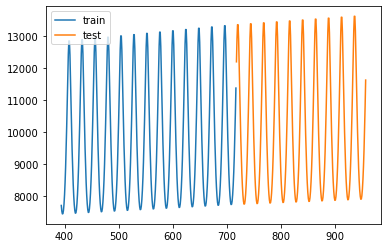

ID: 1
BEST: 3.859723639736904
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'add'}



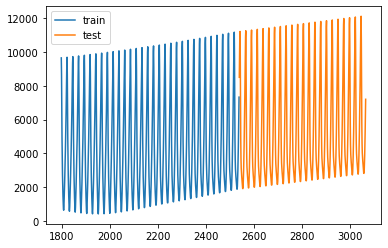

ID: 2
BEST: 0.296788612224445
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



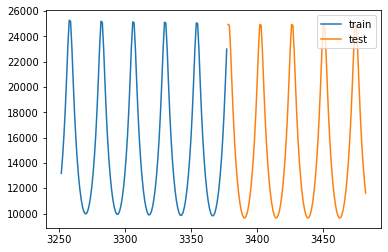

ID: 3
BEST: 1.712357641861749
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



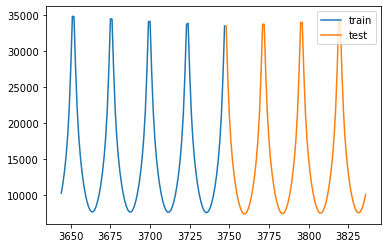

ID: 4
BEST: 0.08131184141689028
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



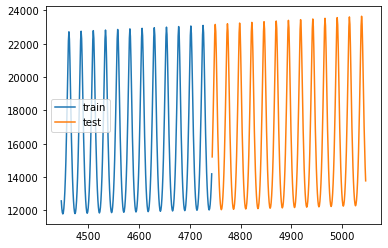

ID: 5
BEST: 0.07409847376882926
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



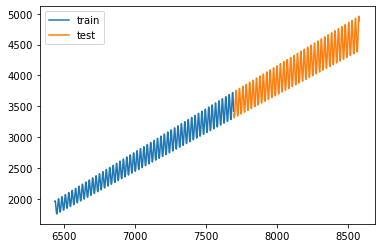

ID: 6
BEST: 12.570186868184157
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



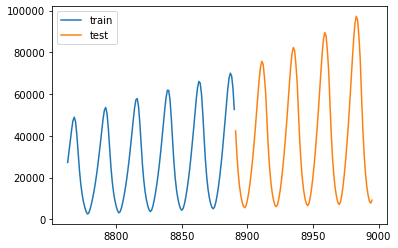

ID: 7
BEST: 18.007763259397937
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



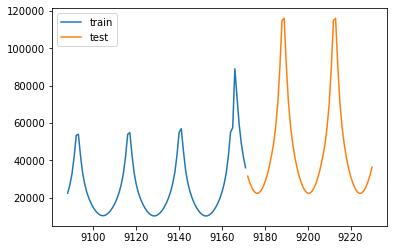

ID: 8
BEST: 5.0523818772300855
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



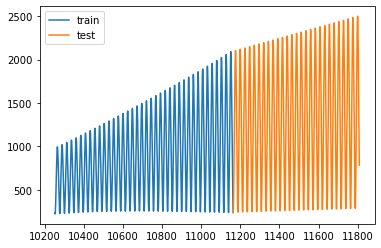

ID: 9
BEST: 7.0398251015876125
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



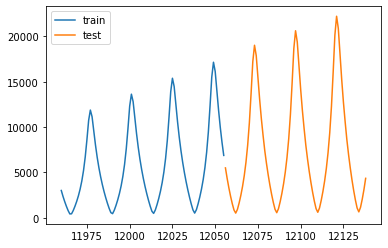

ID: 10
BEST: 0.1360930564090423
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



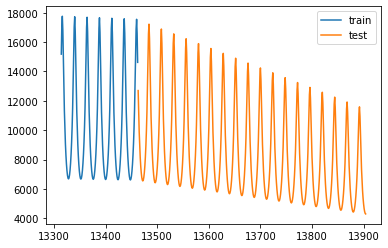

ID: 11
BEST: 4.274290217422813
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



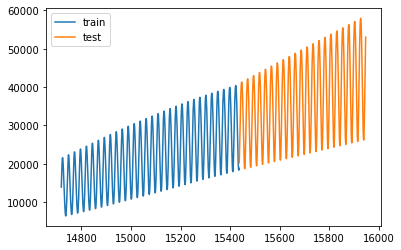

ID: 12
BEST: 200.0
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



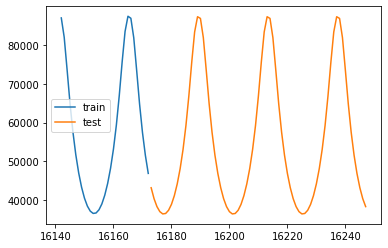

ID: 13
BEST: 0.13615940478541416
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



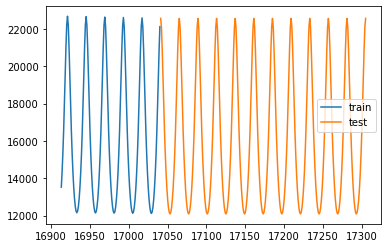

ID: 14
BEST: 8.608199076149361
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



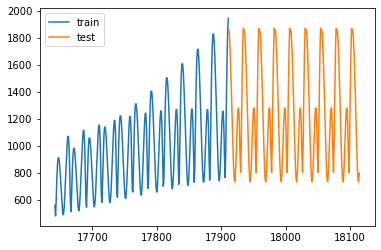

ID: 15
BEST: 57.922504015470025
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



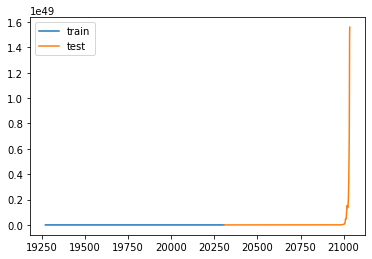

ID: 16
BEST: 8.973011410490841
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



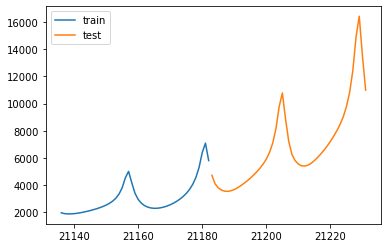

ID: 17
BEST: 0.37474486825164616
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



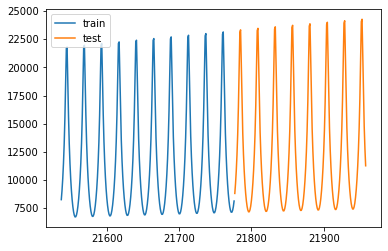

ID: 18
BEST: 0.02807600293340901
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



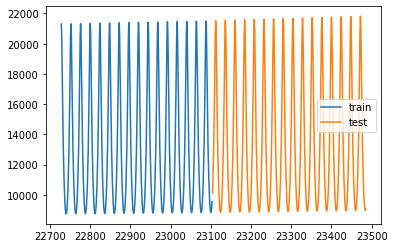

ID: 19
BEST: 9.542429449997138
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



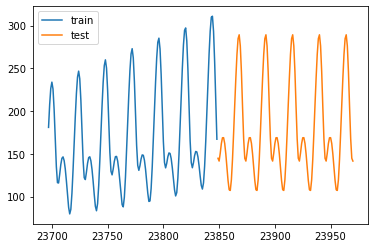

ID: 20
BEST: 14.628210535151576
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



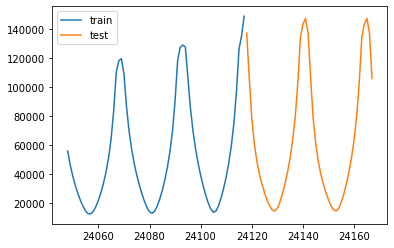

ID: 21
BEST: 28.59497437787329
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



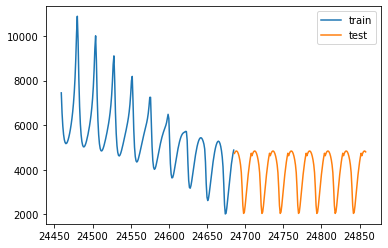

ID: 22
BEST: 10.252821617673828
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



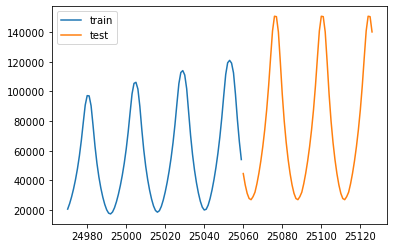

ID: 23
BEST: 0.3750631046928488
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



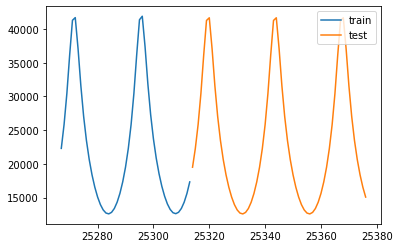

ID: 24
BEST: 8.105746007293293
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



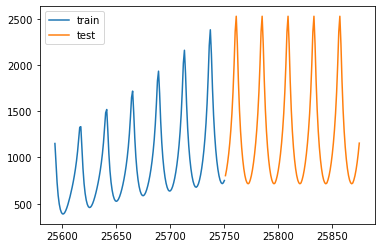

ID: 25
BEST: 0.10070340669260011
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



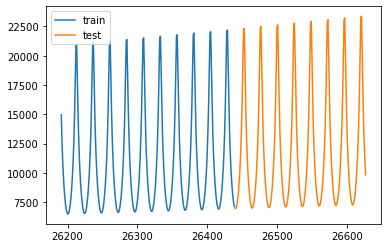

ID: 26
BEST: 8.293018132166106
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'add'}



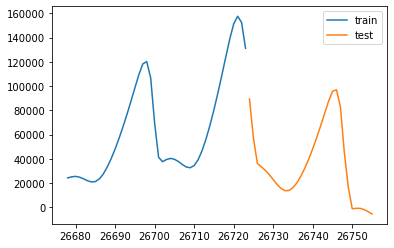

ID: 27
BEST: 0.13685866239271297
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



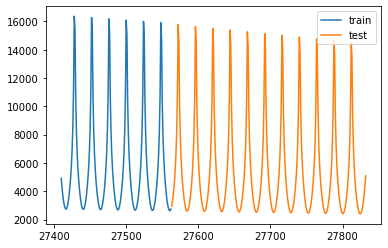

ID: 28
BEST: 8.174297703817492
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



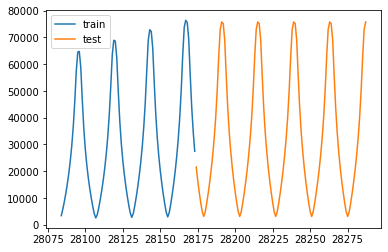

ID: 29
BEST: 15.218436894903661
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



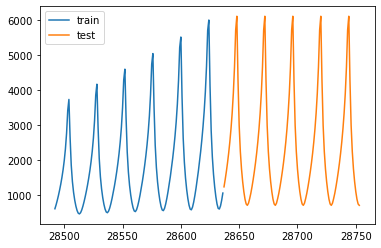

ID: 30
BEST: 0.7232303519776754
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



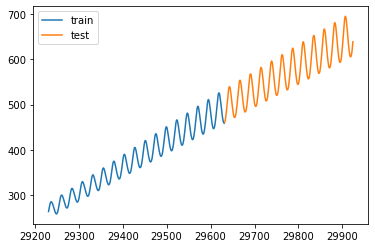

ID: 31
BEST: 3.783038573867128
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



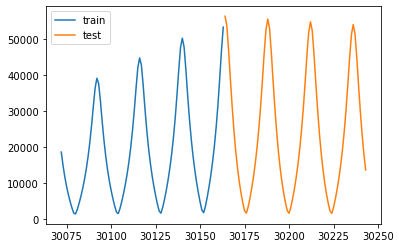

ID: 32
BEST: 4.331977308932999
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



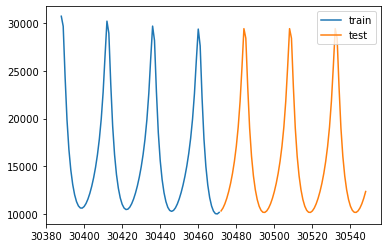

ID: 33
BEST: 200.0
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



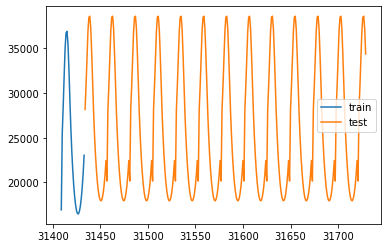

ID: 34
BEST: 0.9360549866208373
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



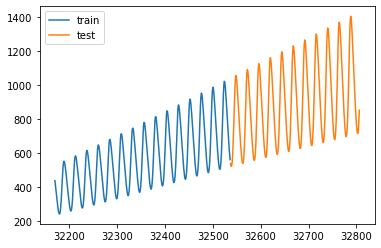

ID: 35
BEST: 31.837411339790776
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



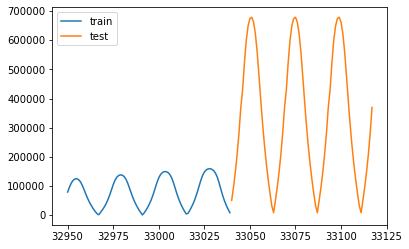

ID: 36
BEST: 0.44529449958507156
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'add'}



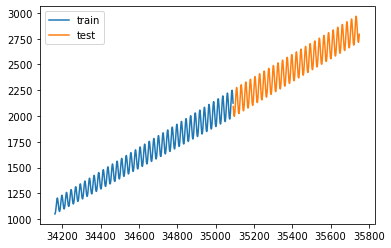

ID: 37
BEST: 9.376769495367725
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



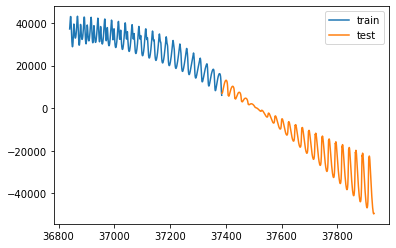

ID: 38
BEST: 0.6292145006262763
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



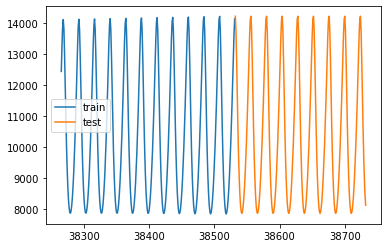

ID: 39
BEST: 18.67972732251625
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'add'}



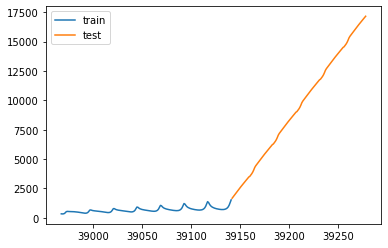

ID: 40
BEST: 1.8068813054885364
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



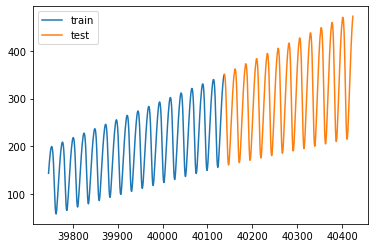

ID: 41
BEST: 0.17776524954668307
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



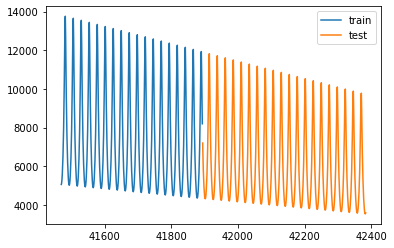

ID: 42
BEST: 0.8320593770356068
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



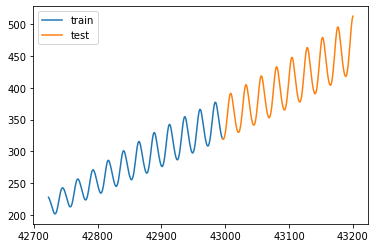

ID: 43
BEST: 14.478183328906088
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



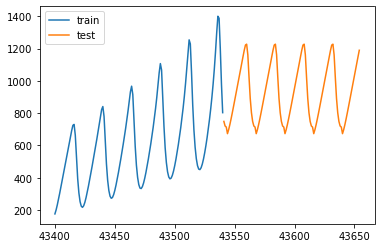

ID: 44
BEST: 0.40336745489757714
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



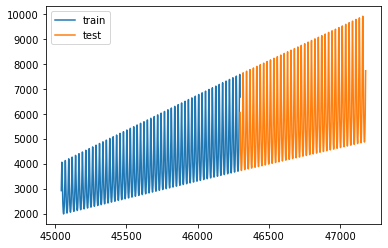

ID: 45
BEST: 0.45458049349253365
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



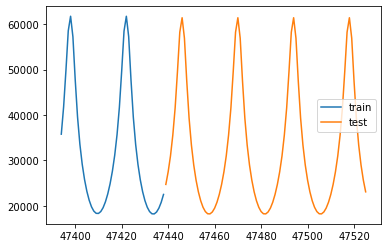

ID: 46
BEST: 5.546803207832893
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



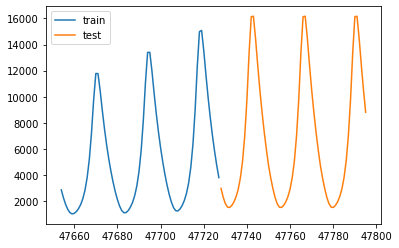

ID: 47
BEST: 1.3708286331776653
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



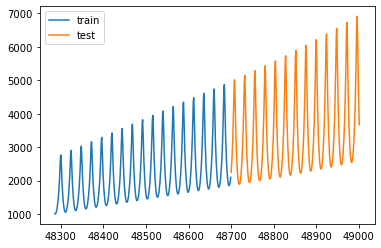

ID: 48
BEST: 0.17035099592679753
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



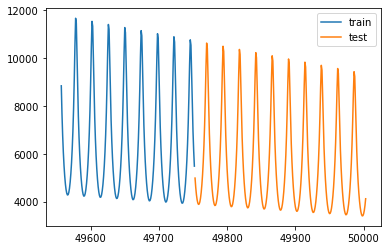

ID: 49
BEST: 0.8772985506278178
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



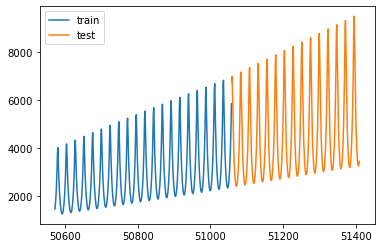

ID: 50
BEST: 0.47796088736725123
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



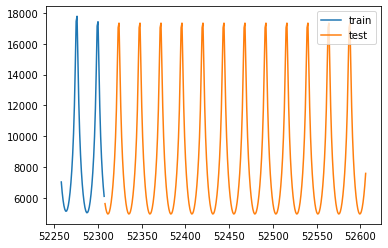

ID: 51
BEST: 1.7374315427834581
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



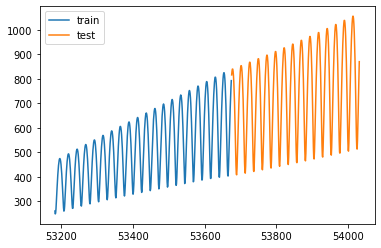

ID: 52
BEST: 15.810841889240946
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



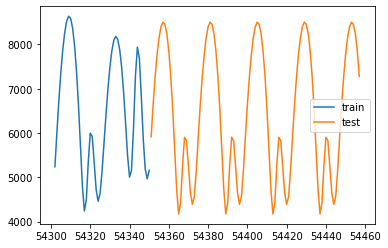

ID: 53
BEST: 0.23227803464220426
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



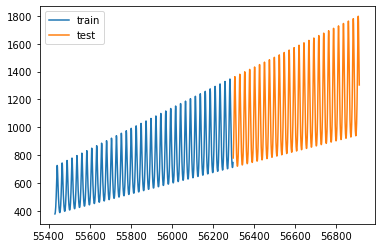

ID: 54
BEST: 5.430074782821725
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



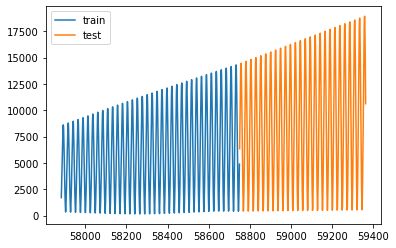

ID: 55
BEST: 10.848459160188394
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



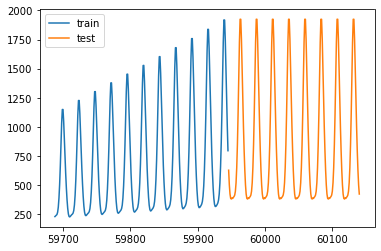

ID: 56
BEST: 25.87664845560266
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



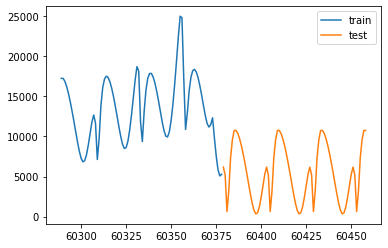

ID: 57
BEST: 1.4868146688331882
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



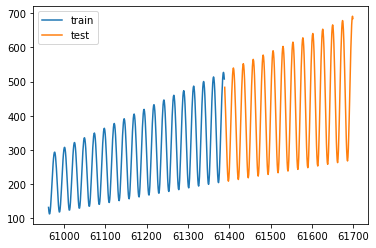

ID: 58
BEST: 4.52597504280285
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'add'}



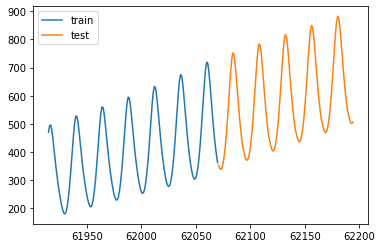

ID: 59
BEST: 0.11601826386098525
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'add'}



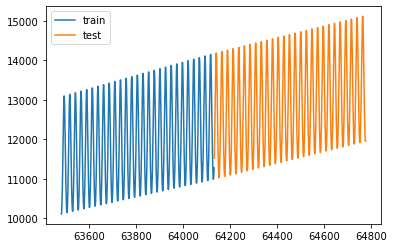

ID: 60
BEST: 0.2786958894204657
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



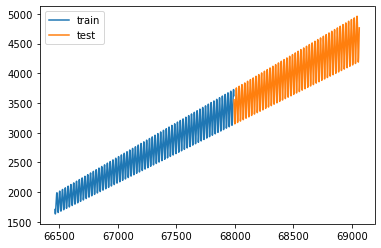

ID: 61
BEST: 16.17751970115655
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



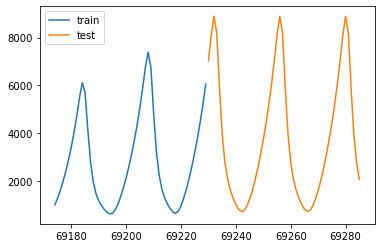

ID: 62
BEST: 6.346368572573214
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



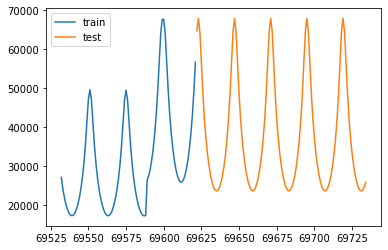

ID: 63
BEST: 1.1409936431854644
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



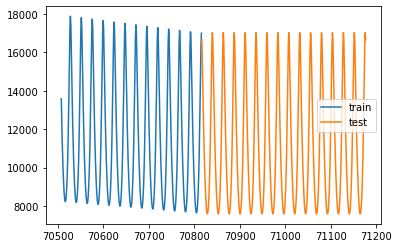

ID: 64
BEST: 9.537437992455592
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



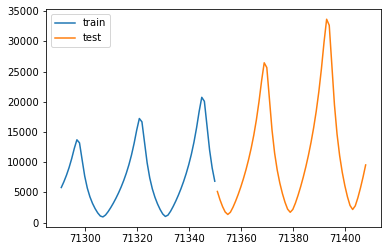

ID: 65
BEST: 0.02626971221855633
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



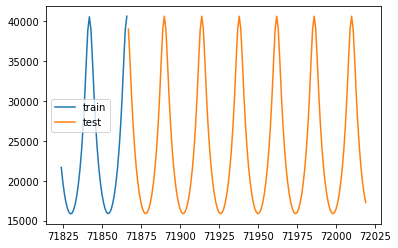

ID: 66
BEST: 11.340059161217868
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



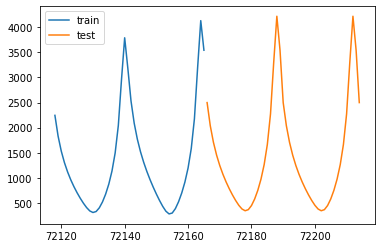

ID: 67
BEST: 9.29710594058979
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



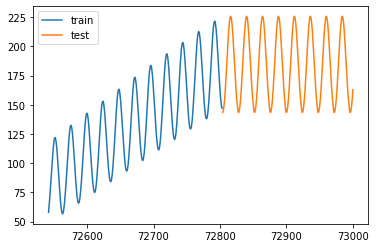

ID: 68
BEST: 0.2025206796647757
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



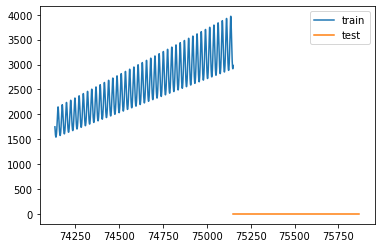

ID: 69
BEST: 4.474114039582099
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



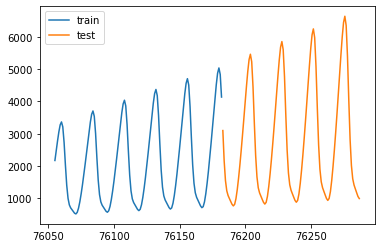

ID: 70
BEST: 8.845742509661436
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'add'}



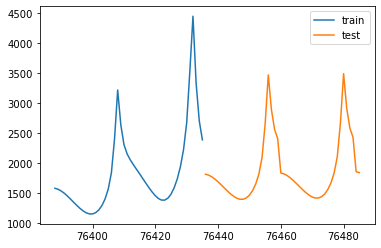

ID: 71
BEST: 1.878616194089076
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



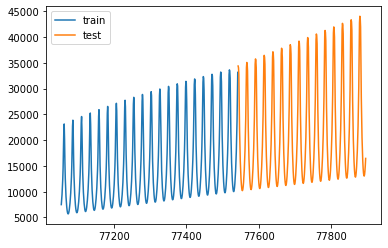

ID: 72
BEST: 19.78374629177547
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'add'}



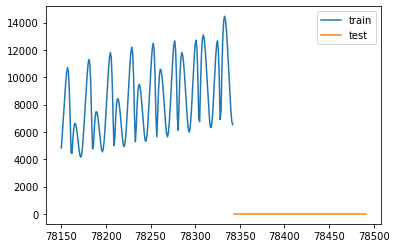

ID: 73
BEST: 8.318746484389
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



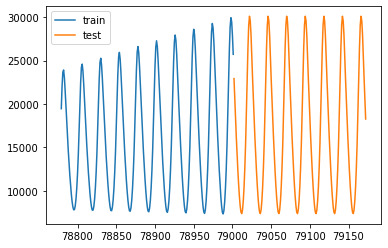

ID: 74
BEST: 2.880545665983549
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



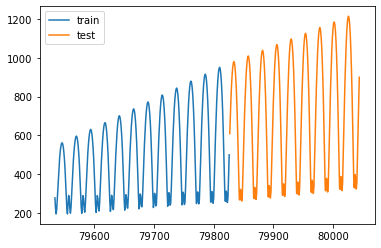

ID: 75
BEST: 1.408583227522358
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



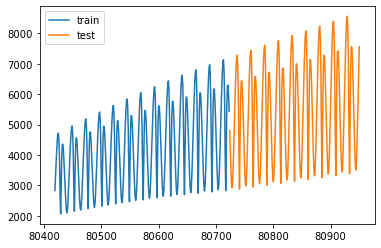

ID: 76
BEST: 3.511197415154937
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



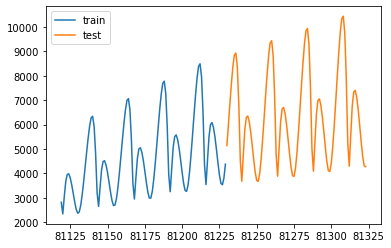

ID: 77
BEST: 9.766335187527183
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



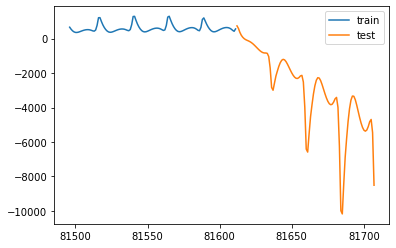

ID: 78
BEST: 5.920596918589373
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



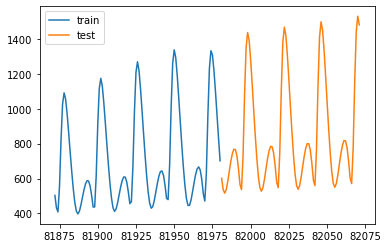

ID: 79
BEST: 0.7868347648516226
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



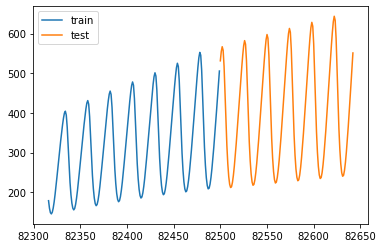

ID: 80
BEST: 1.4938888760963325
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



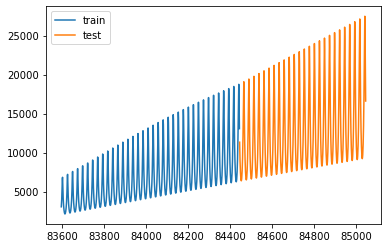

ID: 81
BEST: 0.8124518286165444
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



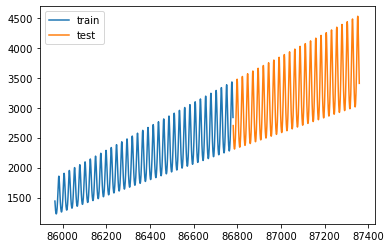

ID: 82
BEST: 9.079666314433666
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



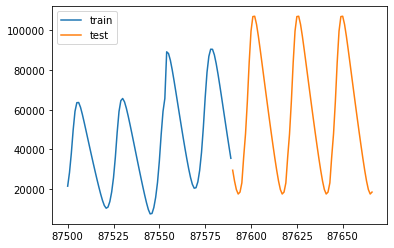

ID: 83
BEST: 10.994318697039123
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



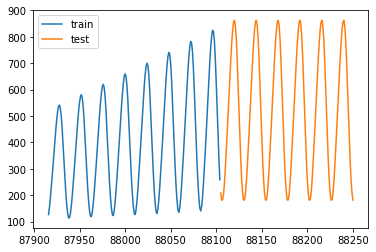

ID: 84
BEST: 2.3160239450112465
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



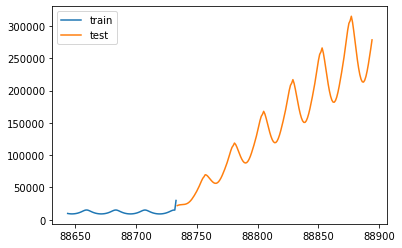

ID: 85
BEST: 0.1832992543227145
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



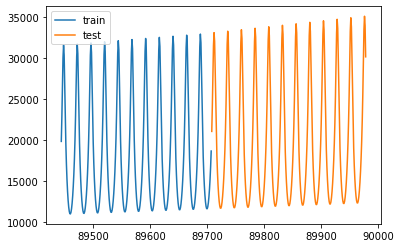

ID: 86
BEST: 0.08948014758026143
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



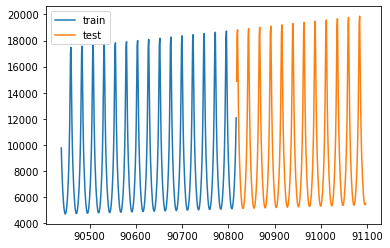

ID: 87
BEST: 4.608797579459601
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



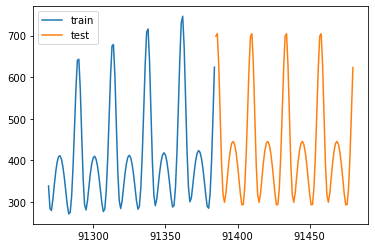

ID: 88
BEST: 0.46936355338322594
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



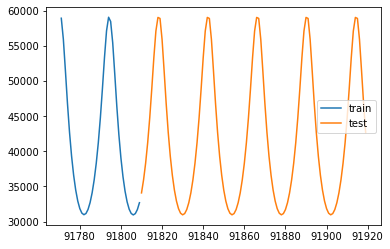

ID: 89
BEST: 21.664046397757396
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



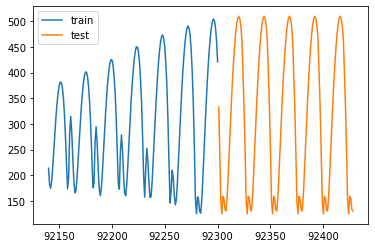

ID: 90
BEST: 4.033629304941444
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



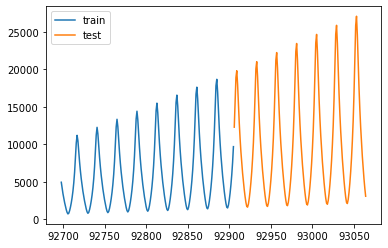

ID: 91
BEST: 2.526615091554627
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'add'}



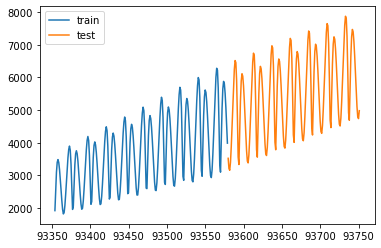

ID: 92
BEST: 44.90891674336629
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'add'}



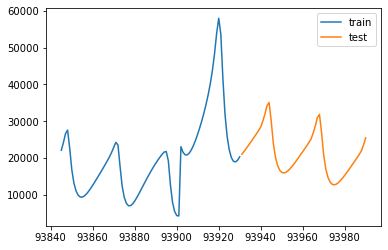

ID: 93
BEST: 0.8408182198309713
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



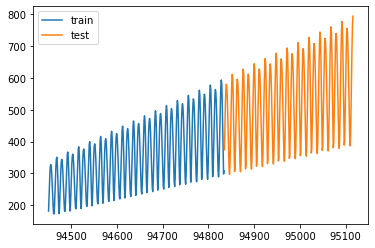

ID: 94
BEST: 0.02743409002457792
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



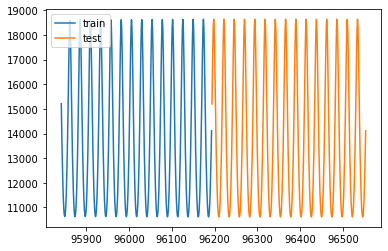

ID: 95
BEST: 12.28903423185696
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



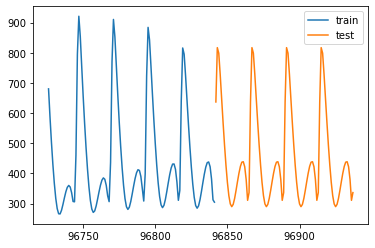

ID: 96
BEST: 5.012321194131252
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'add'}



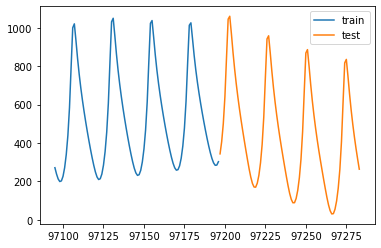

ID: 97
BEST: 10.999191240206843
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



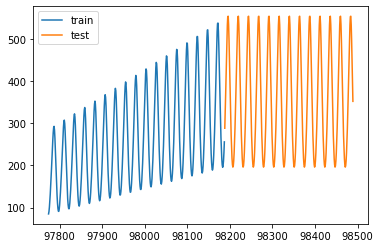

ID: 98
BEST: 0.011204123183292019
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



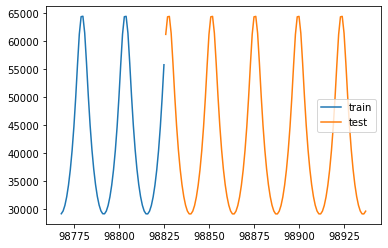

ID: 99
BEST: 24.83531427009009
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



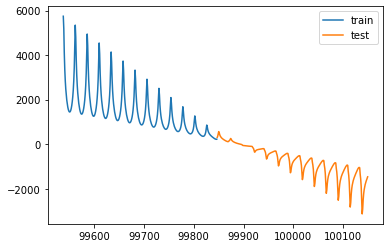

ID: 100
BEST: 1.6789701477313248
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



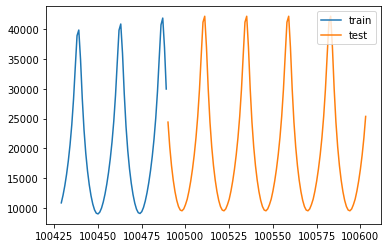

ID: 101
BEST: 5.165571324376392
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



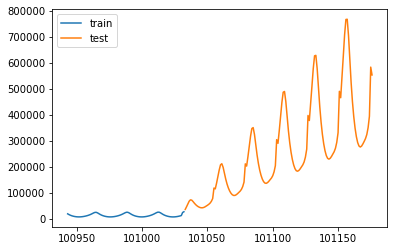

ID: 102
BEST: 0.23525587912414359
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



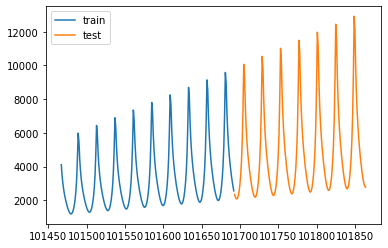

ID: 103
BEST: 7.655141761805681
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



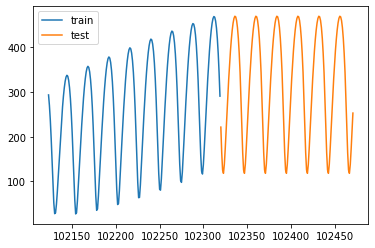

ID: 104
BEST: 11.48609229092803
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



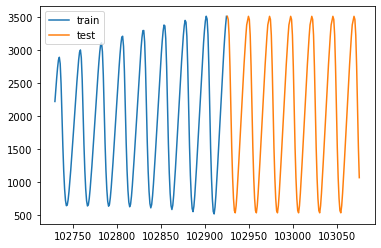

ID: 105
BEST: 3.158189336327978
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



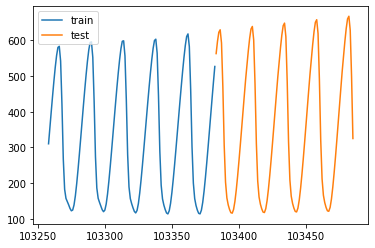

ID: 106
BEST: 7.129084824634896
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



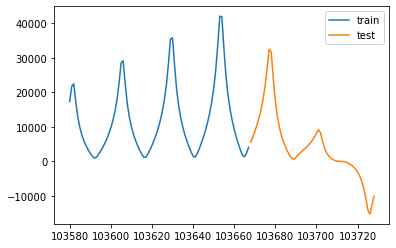

ID: 107
BEST: 7.548554298936095
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



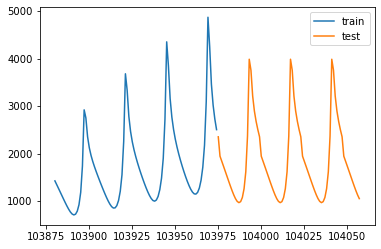

ID: 108
BEST: 0.4740909258148911
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



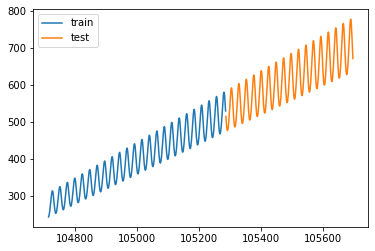

ID: 109
BEST: 10.688235278381274
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



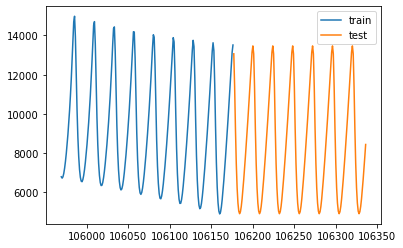

ID: 110
BEST: 10.845749523283196
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



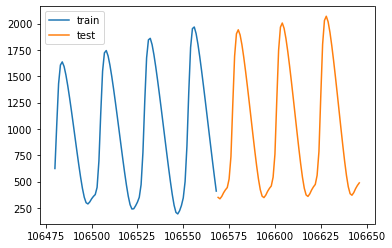

ID: 111
BEST: 3.0563894362122075
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



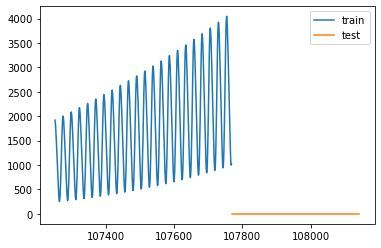

ID: 112
BEST: 0.13522842746153324
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



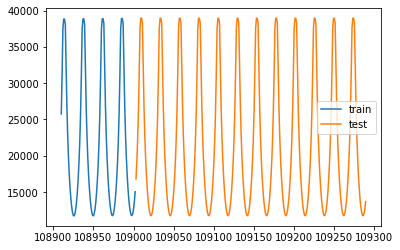

ID: 113
BEST: 1.9835874346308056
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



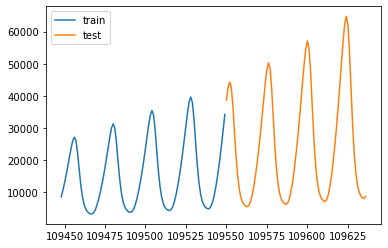

ID: 114
BEST: 0.788037884775621
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



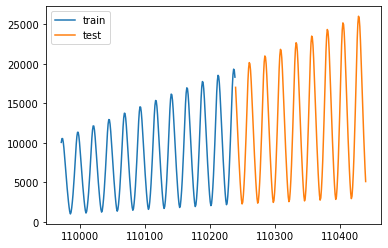

ID: 115
BEST: 5.638220428666408
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



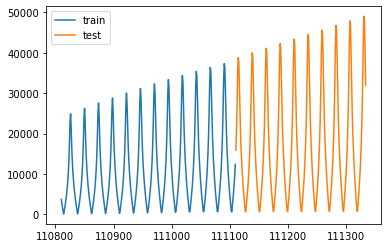

ID: 116
BEST: 10.036334905013298
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



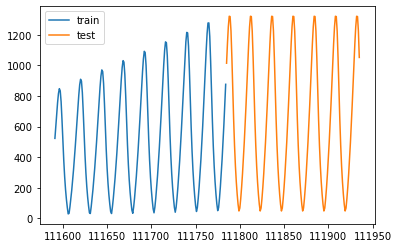

ID: 117
BEST: 3.773400170655334
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



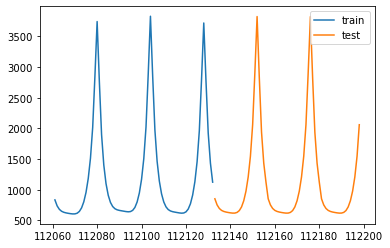

ID: 118
BEST: 0.7484136936546228
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



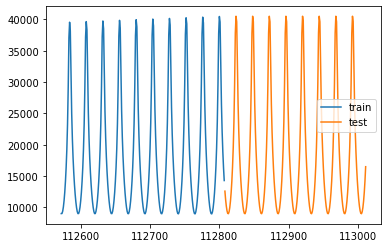

ID: 119
BEST: 1.5265292624323734
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



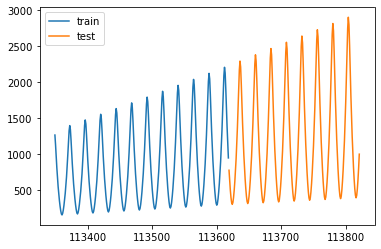

ID: 120
BEST: 51.463785212915965
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



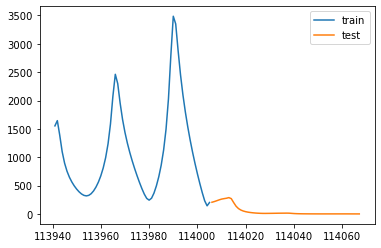

ID: 121
BEST: 0.6340866433658695
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



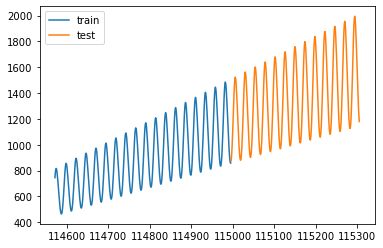

ID: 122
BEST: 1.2044066355087348
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



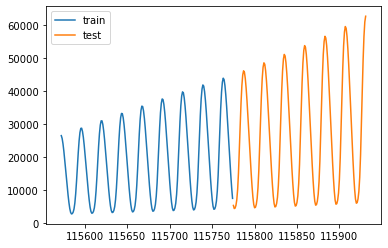

ID: 123
BEST: 0.01357469276943136
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



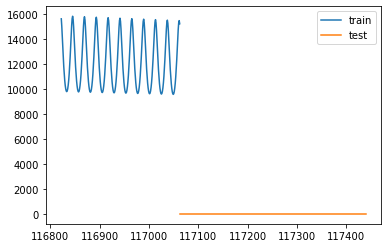

ID: 124
BEST: 0.041410401691653644
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'add'}



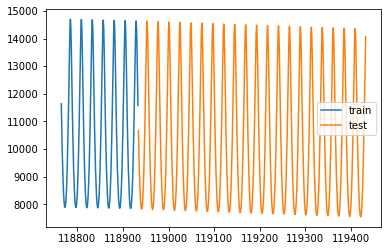

ID: 125
BEST: 0.8585842574543916
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



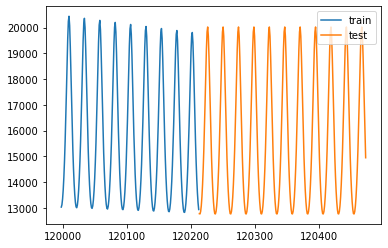

ID: 126
BEST: 0.4996208361702318
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



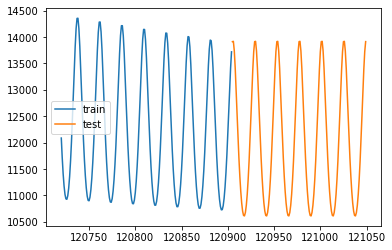

ID: 127
BEST: 4.3954664701355375
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



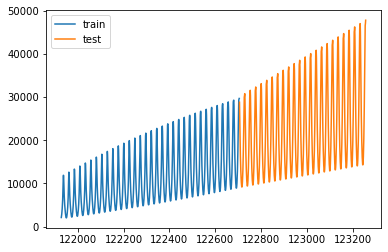

ID: 128
BEST: 15.390106801610676
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



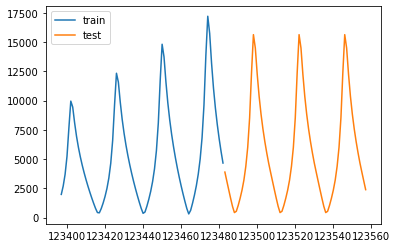

ID: 129
BEST: 7.433468607657083
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



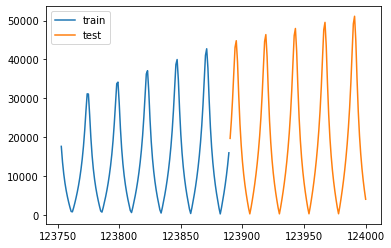

ID: 130
BEST: 4.002573504367764
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



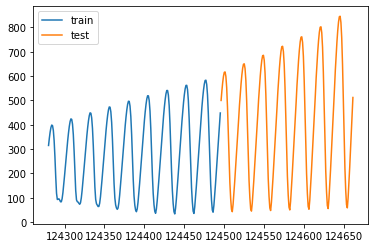

ID: 131
BEST: 21.27267756853093
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



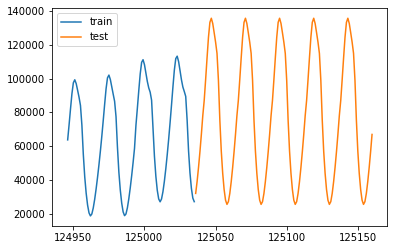

ID: 132
BEST: 1.8501460344287595
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



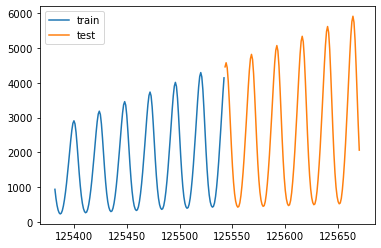

ID: 133
BEST: 0.03744207591258382
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



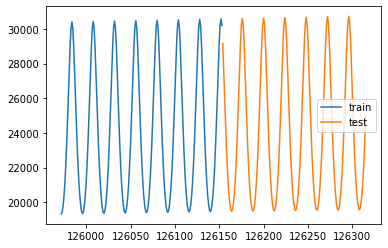

ID: 134
BEST: 1.0565644494034048
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



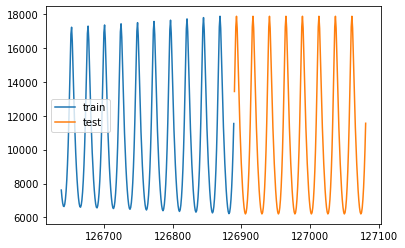

ID: 135
BEST: 0.2766040030975144
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



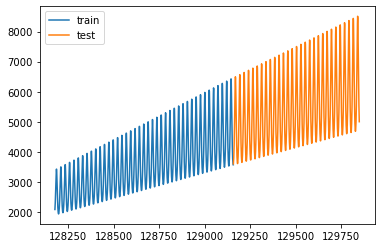

ID: 136
BEST: 0.17985938997408688
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



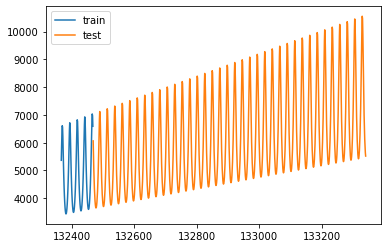

ID: 137
BEST: 3.1447890238193277
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



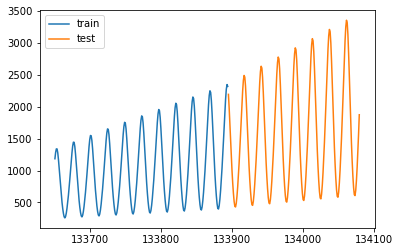

ID: 138
BEST: 0.9950913940074493
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



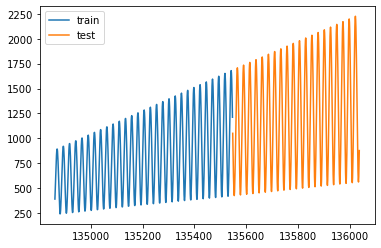

ID: 139
BEST: 1.3773754155751878
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



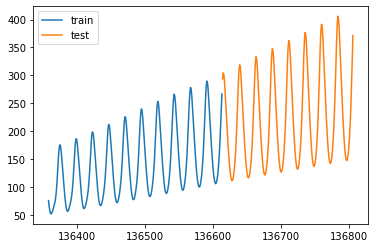

ID: 140
BEST: 15.374528523336304
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



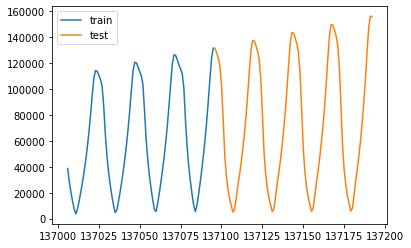

ID: 141
BEST: 30.220960632818556
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



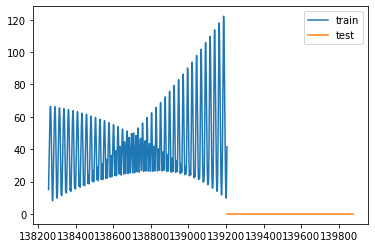

ID: 142
BEST: 1.7285551202900822
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



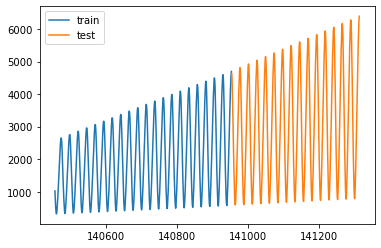

ID: 143
BEST: 5.01457376515854
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



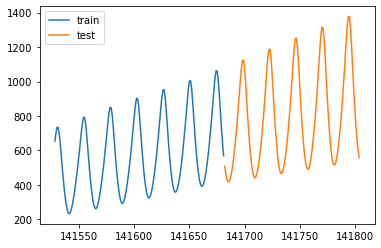

ID: 144
BEST: 44.490563135838386
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



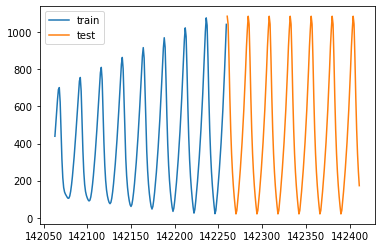

ID: 145
BEST: 0.5594397112331246
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



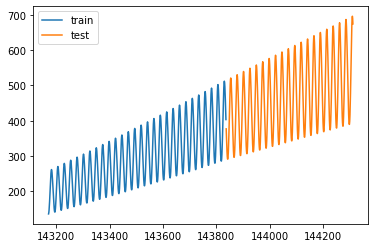

ID: 146
BEST: 1.7236269558124198
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



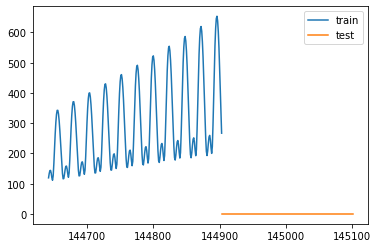

ID: 147
BEST: 4.8821487057154656
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'add'}



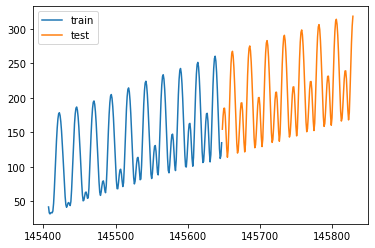

ID: 148
BEST: 1.4663283825728626
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



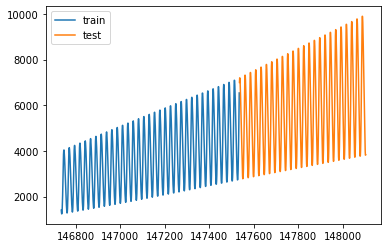

ID: 149
BEST: 6.205153398403429
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



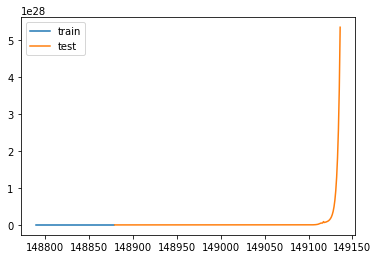

ID: 150
BEST: 4.265616026842436
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'add'}



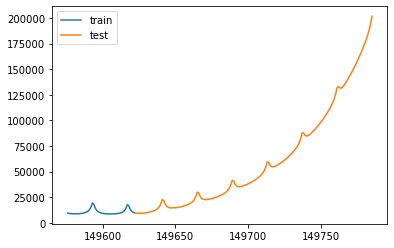

ID: 151
BEST: 0.1621397850066219
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



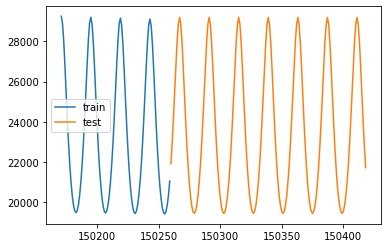

ID: 152
BEST: 3.7319927751026563
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



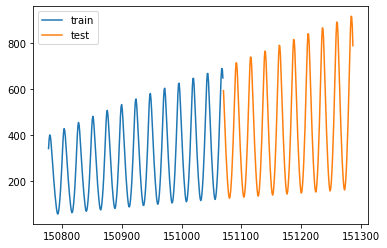

ID: 153
BEST: 12.21779108364156
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



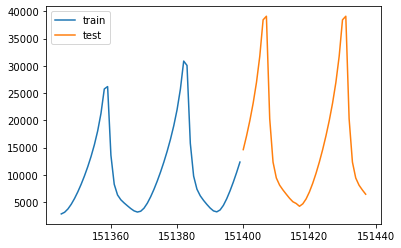

ID: 154
BEST: 200.0
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



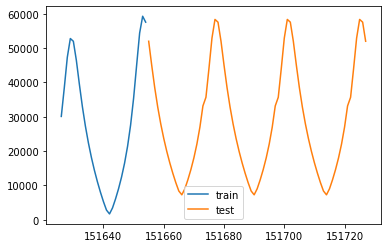

ID: 155
BEST: 4.280768972203678
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



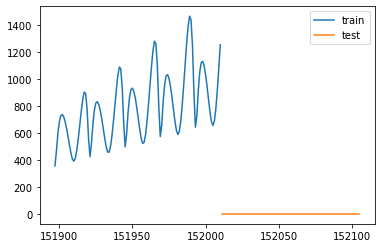

ID: 156
BEST: 0.6176858266471864
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



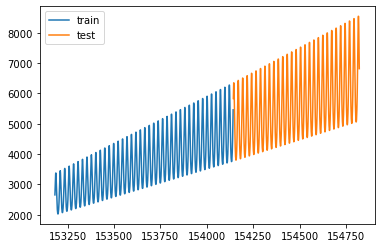

ID: 157
BEST: 4.701010228462615
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



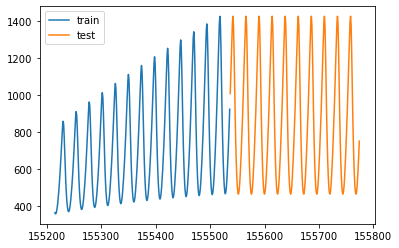

ID: 158
BEST: 37.57851487551007
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



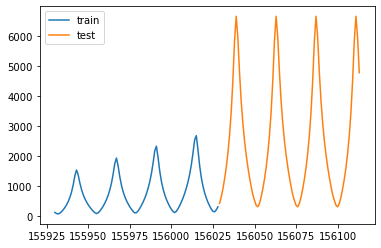

ID: 159
BEST: 1.7158369436413297
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



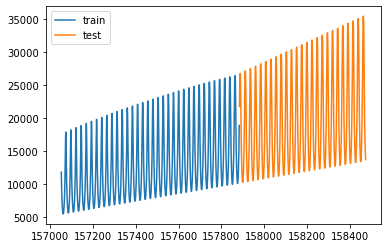

ID: 160
BEST: 0.8334606917275525
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



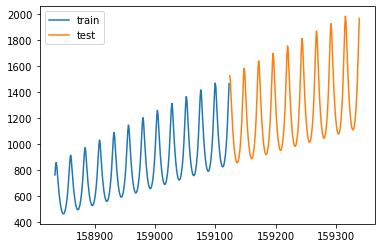

ID: 161
BEST: 25.033146478539642
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



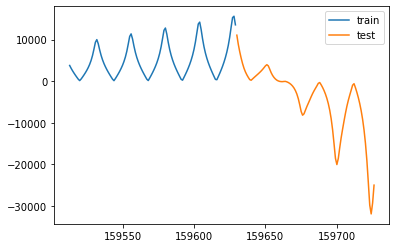

ID: 162
BEST: 7.219660162918838
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



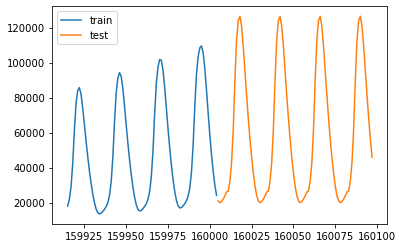

ID: 163
BEST: 17.27336350066698
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



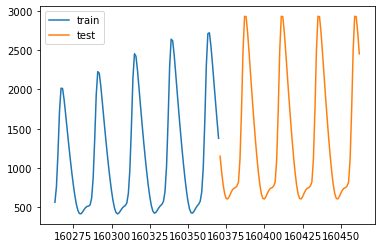

ID: 164
BEST: 3.9452623537322236
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



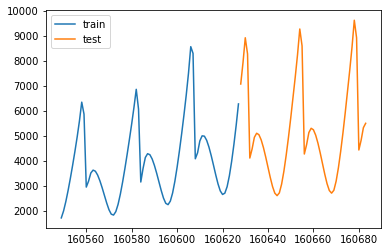

ID: 165
BEST: 15.784806680677951
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



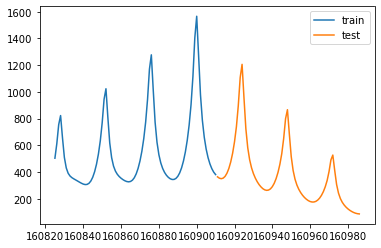

ID: 166
BEST: 0.3623753441689441
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



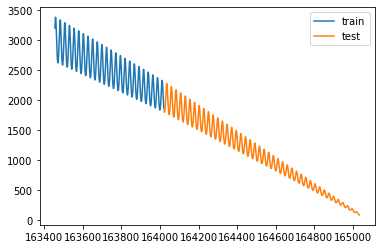

ID: 167
BEST: 0.801173568317131
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



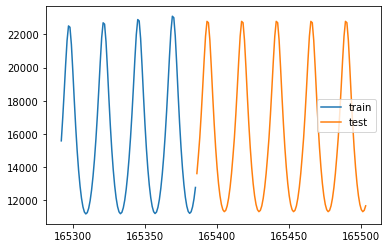

ID: 168
BEST: 1.4240006968982708
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



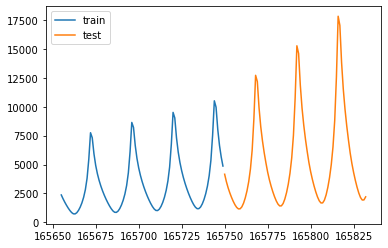

ID: 169
BEST: 14.151098511937843
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



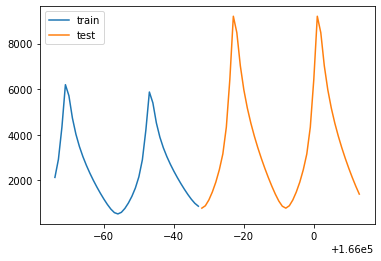

ID: 170
BEST: 3.130232509367733
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



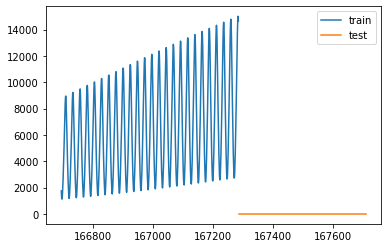

ID: 171
BEST: 3.4676467554005788
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



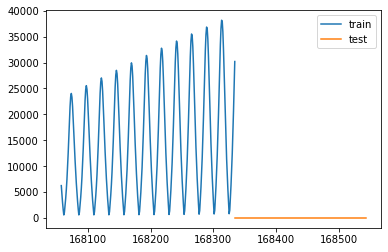

ID: 172
BEST: 14.150618425366154
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



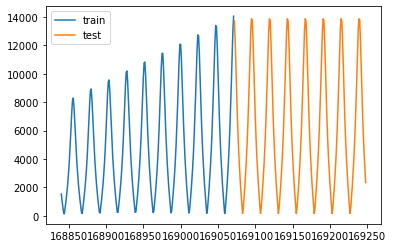

ID: 173
BEST: 2.1502687094010122
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



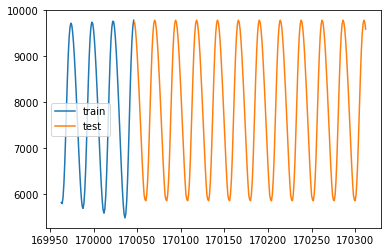

ID: 174
BEST: 200.0
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



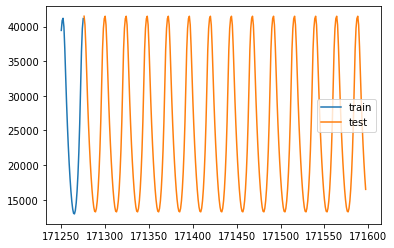

ID: 175
BEST: 56.38332645630083
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'add'}



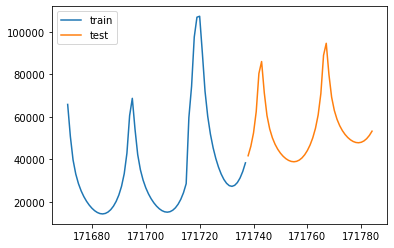

ID: 176
BEST: 0.27955455622903125
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



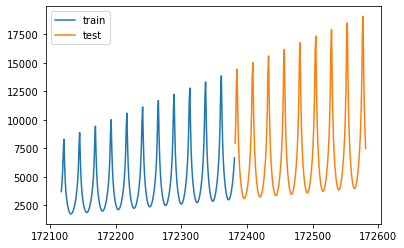

ID: 177
BEST: 60.76311535213256
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



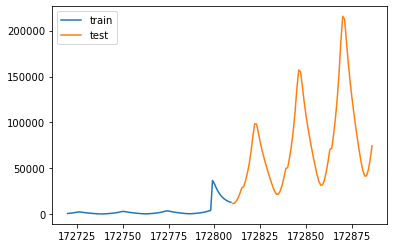

ID: 178
BEST: 8.71239507140734
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



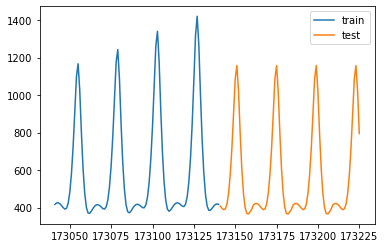

ID: 179
BEST: 15.880534261729954
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



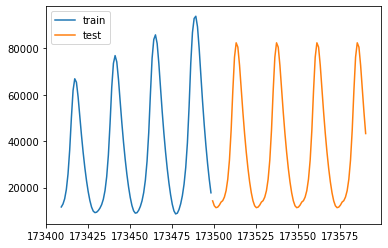

ID: 180
BEST: 8.482012895428559
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



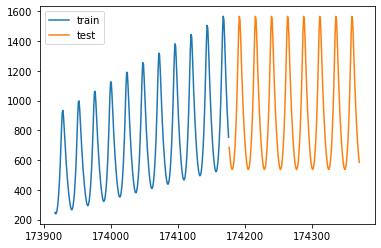

ID: 181
BEST: 9.977617399859877
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



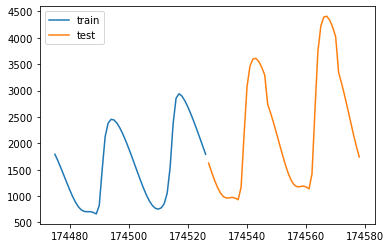

ID: 182
BEST: 10.425449890561271
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



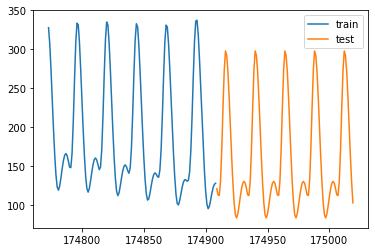

ID: 183
BEST: 0.928392365138243
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



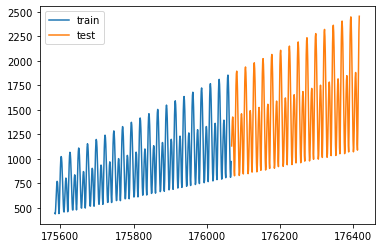

ID: 184
BEST: 39.76018040125338
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



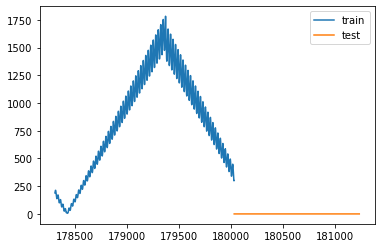

ID: 185
BEST: 10.262957832967077
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



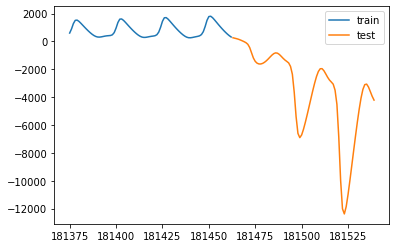

ID: 186
BEST: 0.006662227185090062
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



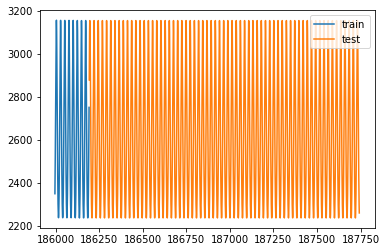

ID: 187
BEST: 0.5376178297078246
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



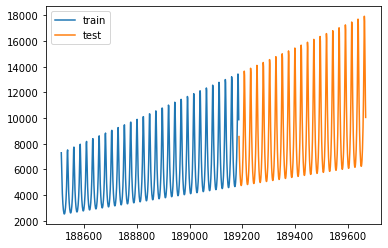

ID: 188
BEST: 0.25232013529490627
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



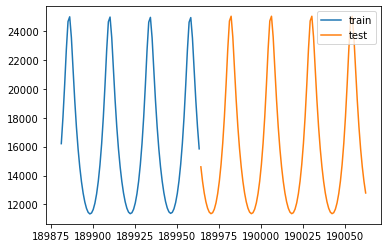

ID: 189
BEST: 15.366436793326688
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



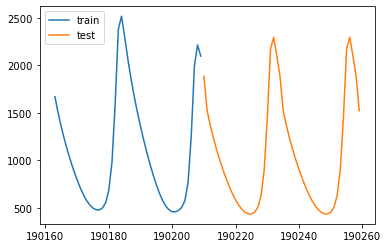

ID: 190
BEST: 0.1645273010693476
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



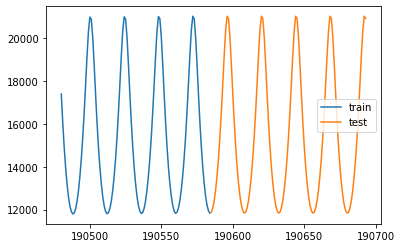

ID: 191
BEST: 0.4653898269702041
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



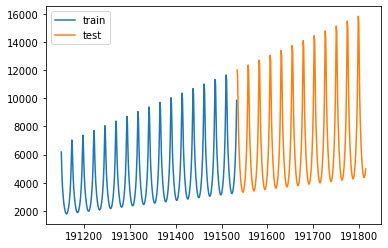

ID: 192
BEST: 8.738184577673463
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



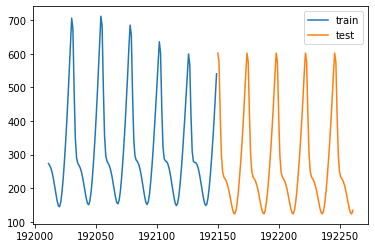

ID: 193
BEST: 0.3426022448901805
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



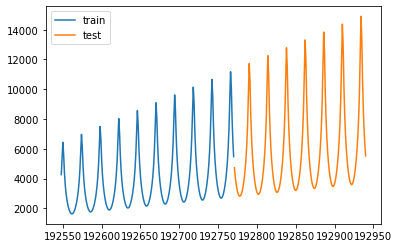

ID: 194
BEST: 49.62391327081633
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



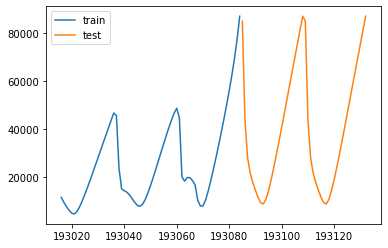

ID: 195
BEST: 22.03477460015815
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



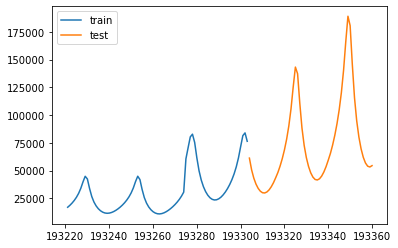

ID: 196
BEST: 2.951139128073786
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



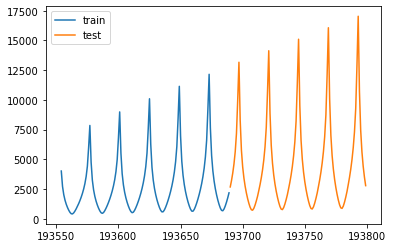

ID: 197
BEST: 6.510178100491109
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



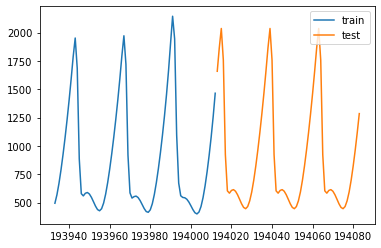

ID: 198
BEST: 4.784315216767238
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'add'}



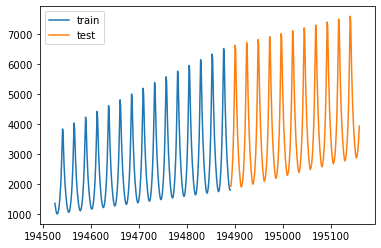

ID: 199
BEST: 10.252801522509465
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



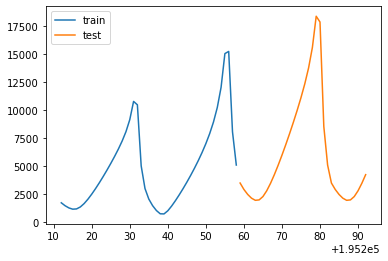

ID: 200
BEST: 8.977387233699938
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



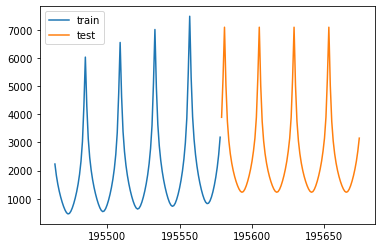

ID: 201
BEST: 2.040853635530444
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



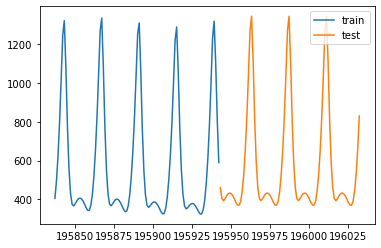

ID: 202
BEST: 13.523294110055629
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



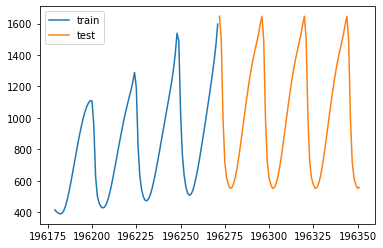

ID: 203
BEST: 1.9825185761182509
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



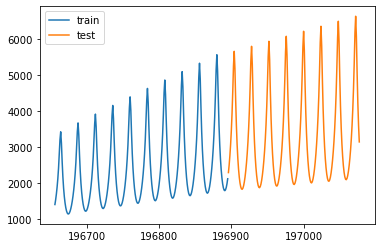

ID: 204
BEST: 2.6459923044724394
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



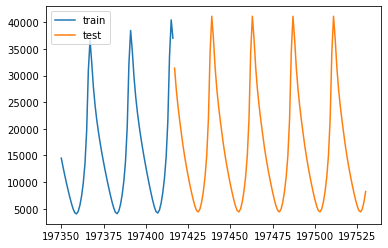

ID: 205
BEST: 3.00471526504852
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



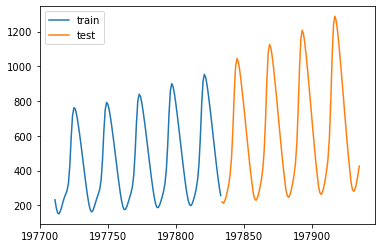

ID: 206
BEST: 14.497316256962463
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



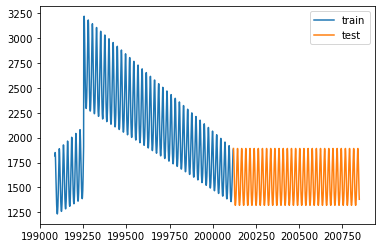

ID: 207
BEST: 0.12117710274535752
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



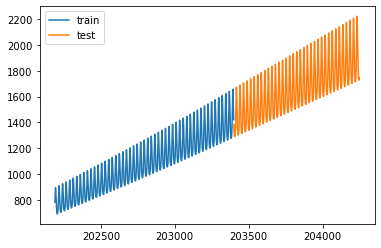

ID: 208
BEST: 1.561215006786008
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



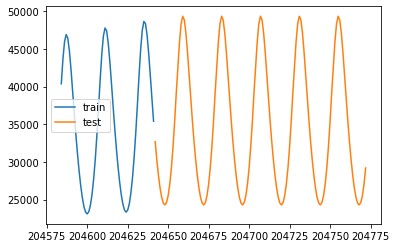

ID: 209
BEST: 0.5776340029716971
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



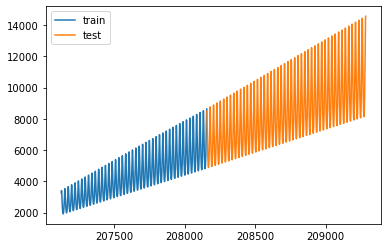

ID: 210
BEST: 3.592134670765134
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'add'}



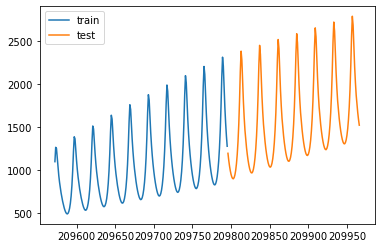

ID: 211
BEST: 0.670581566366227
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



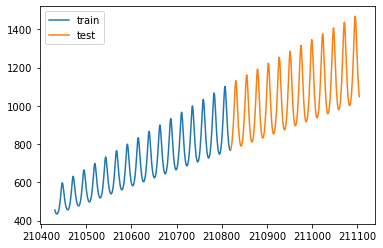

ID: 212
BEST: 0.5654204649764022
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



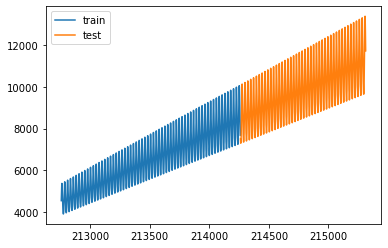

ID: 213
BEST: 0.08759152637600026
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



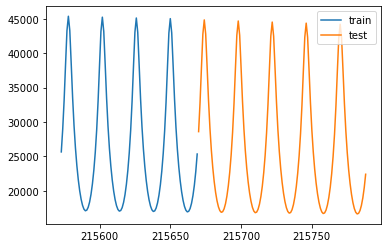

ID: 214
BEST: 2.861078602028985
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



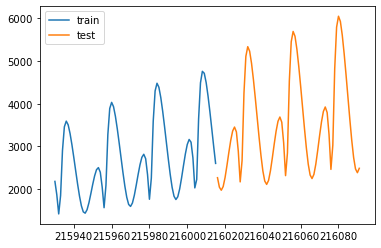

ID: 215
BEST: 0.7022172449010169
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



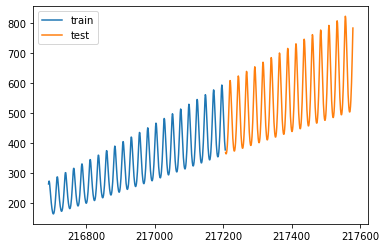

ID: 216
BEST: 7.412860068729758
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'add'}



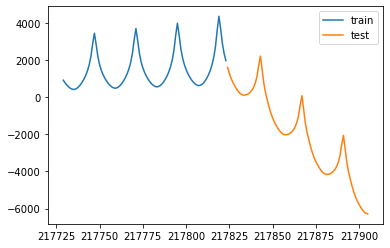

ID: 217
BEST: 0.2267476849330753
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



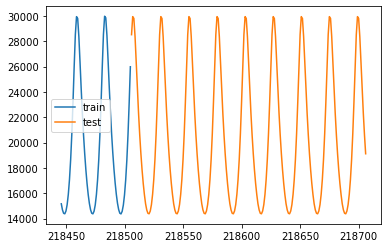

ID: 218
BEST: 0.33948058148104465
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



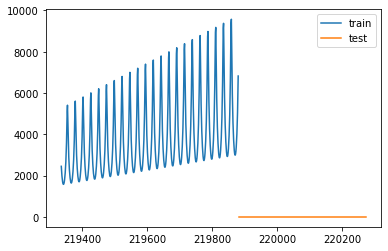

ID: 219
BEST: 4.010245493236297
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



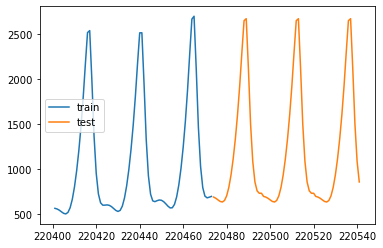

ID: 220
BEST: 1.7623704403859335
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



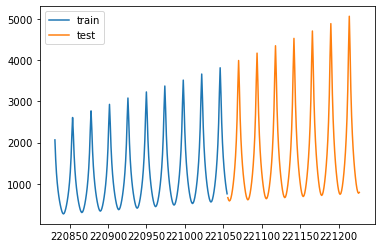

ID: 221
BEST: 4.347367805583169
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



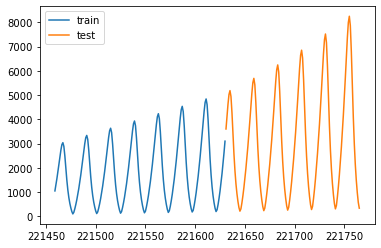

ID: 222
BEST: 17.002711214855935
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



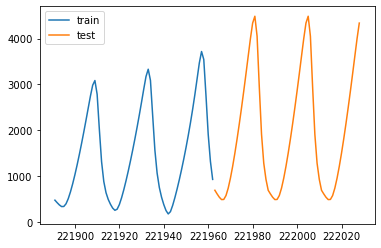

ID: 223
BEST: 0.6932711514323495
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



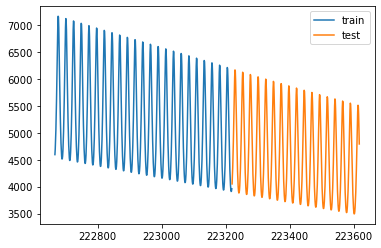

ID: 224
BEST: 15.28853819006068
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



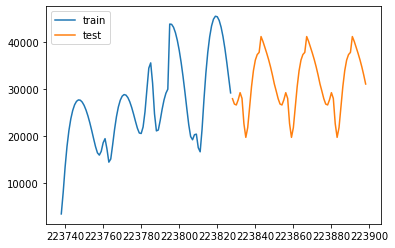

ID: 225
BEST: 4.002932437367103
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



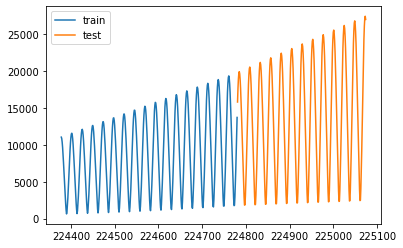

ID: 226
BEST: 0.5088684457881956
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



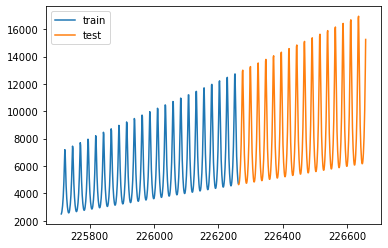

ID: 227
BEST: 3.4575545622415063
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



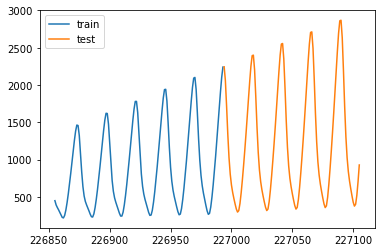

ID: 228
BEST: 200.0
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



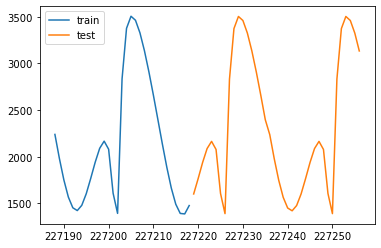

ID: 229
BEST: 8.325112245389267
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



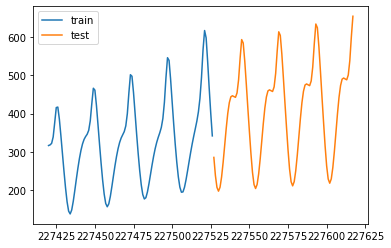

ID: 230
BEST: 0.21578384773456893
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



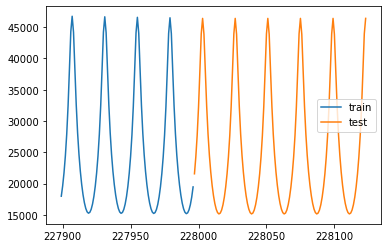

ID: 231
BEST: 0.9568166177188611
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



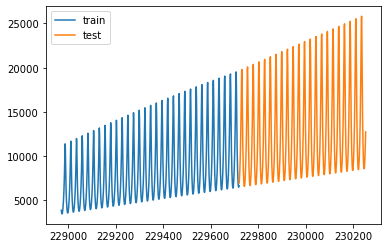

ID: 232
BEST: 0.3157381858411743
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



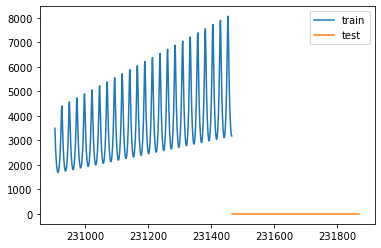

ID: 233
BEST: 5.466229190689202
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



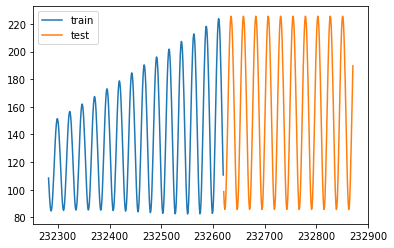

ID: 234
BEST: 0.32230886221620103
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



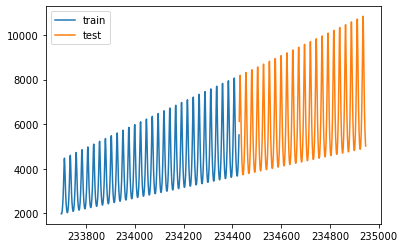

ID: 235
BEST: 4.449905459594632
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



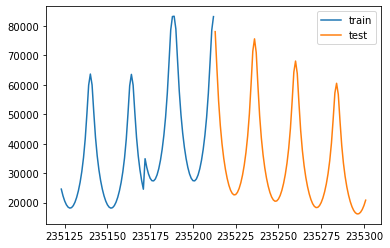

ID: 236
BEST: 2.0674234320846576
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



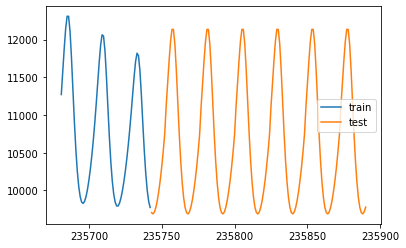

ID: 237
BEST: 0.34398452781243194
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



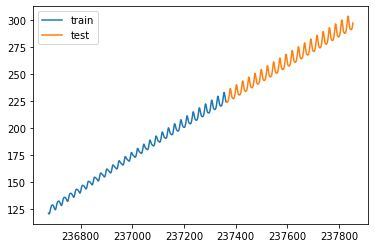

ID: 238
BEST: 10.15298307901801
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



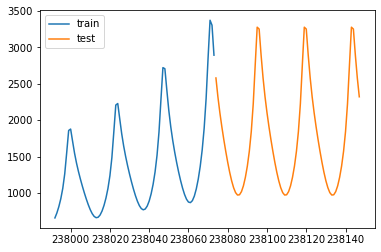

ID: 239
BEST: 0.4335582778052275
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



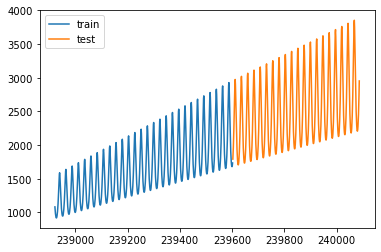

ID: 240
BEST: 3.5546535609169068
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



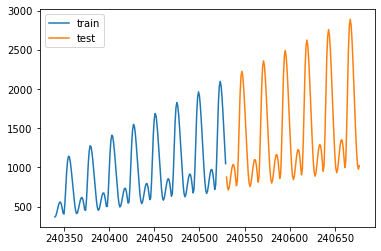

ID: 241
BEST: 0.470139658372305
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



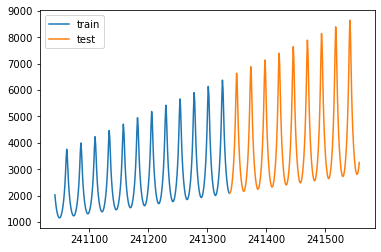

ID: 242
BEST: 0.3440415863067137
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



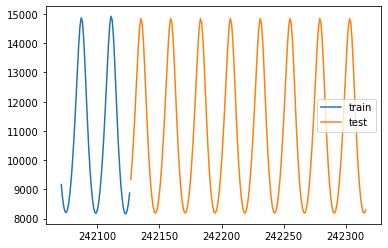

ID: 243
BEST: 0.025203931628128475
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



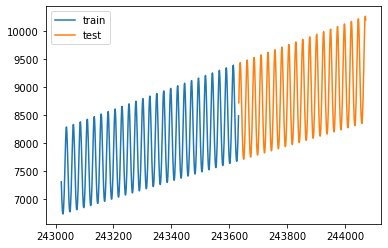

ID: 244
BEST: 31.2294546157024
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'add'}



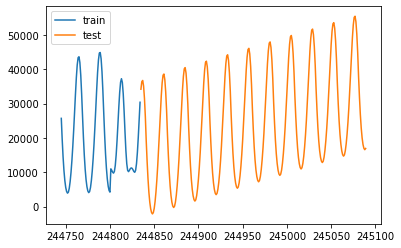

ID: 245
BEST: 10.398822969520758
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



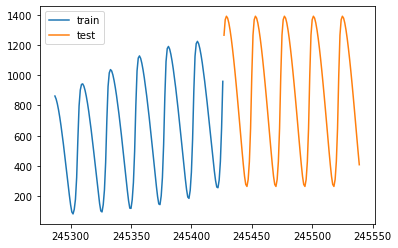

ID: 246
BEST: 4.800783258744598
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



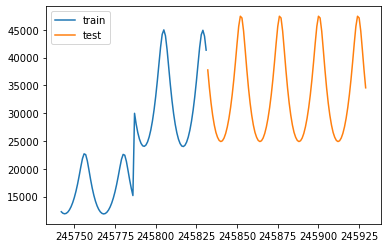

ID: 247
BEST: 0.02566664720008073
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



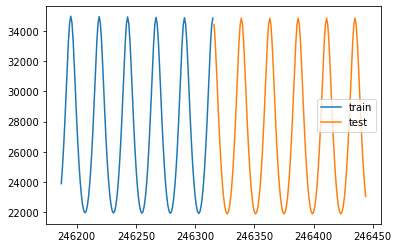

ID: 248
BEST: 5.389276091678408
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



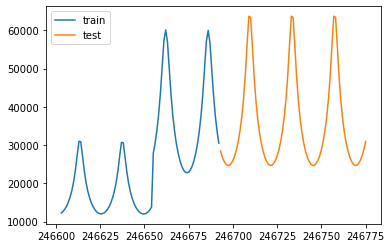

ID: 249
BEST: 39.67559637867718
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



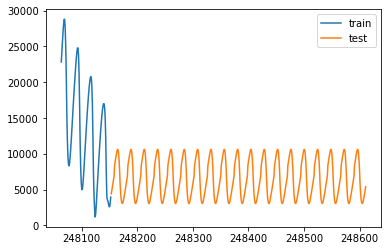

ID: 250
BEST: 0.4227883698261364
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



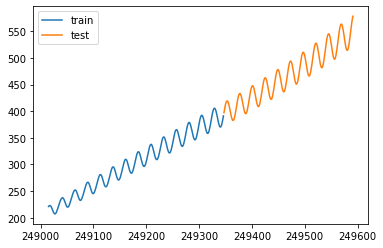

ID: 251
BEST: 24.310162261132717
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



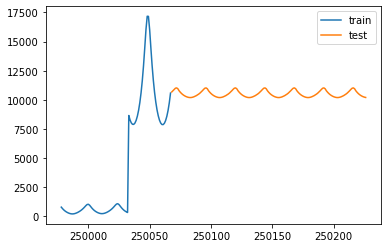

ID: 252
BEST: 200.0
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



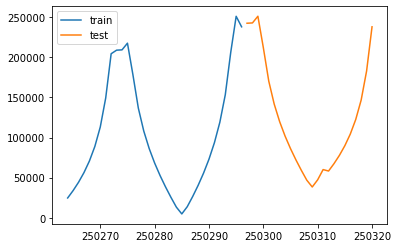

ID: 253
BEST: 2.696295480869957
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'add'}



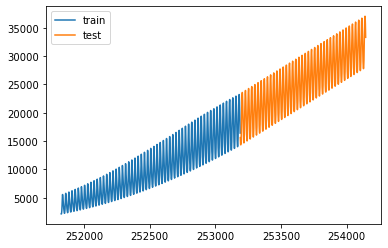

ID: 254
BEST: 9.066451399799377
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



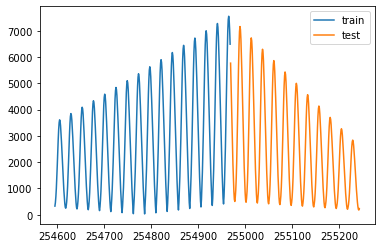

ID: 255
BEST: 7.578582087148549
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



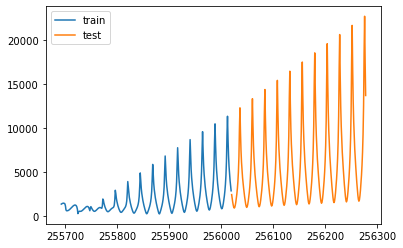

ID: 256
BEST: 0.299702680230693
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



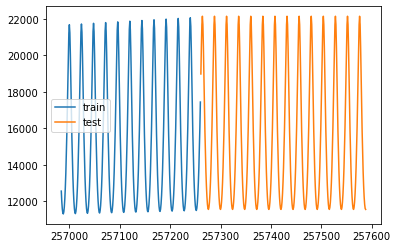

ID: 257
BEST: 0.01805012173207189
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



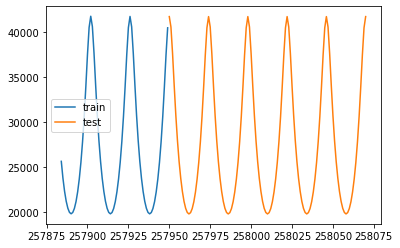

ID: 258
BEST: 200.0
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



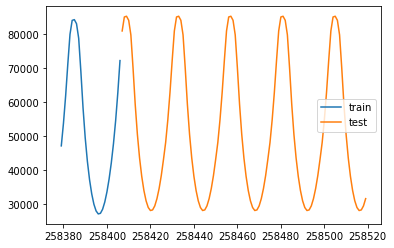

ID: 259
BEST: 200.0
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



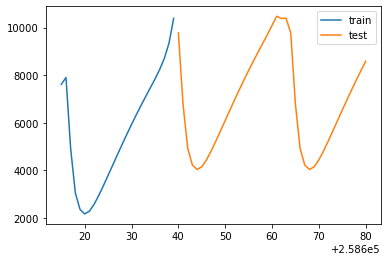

ID: 260
BEST: 14.232582380696321
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



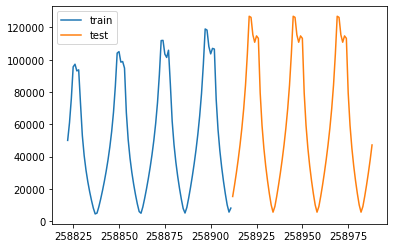

ID: 261
BEST: 10.121916401604794
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



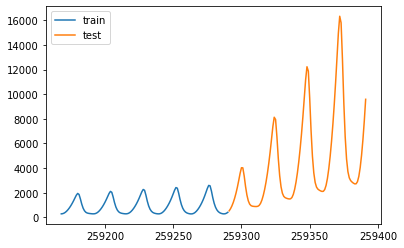

ID: 262
BEST: 0.8598688069537109
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



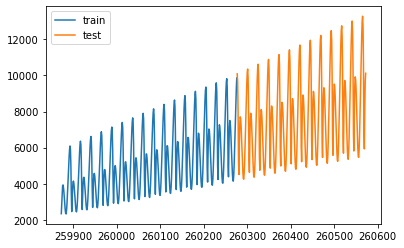

ID: 263
BEST: 0.8527683023821696
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



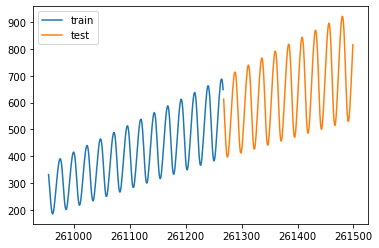

ID: 264
BEST: 45.002427637335344
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



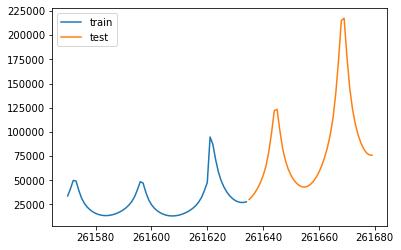

ID: 265
BEST: 4.7531640137914
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



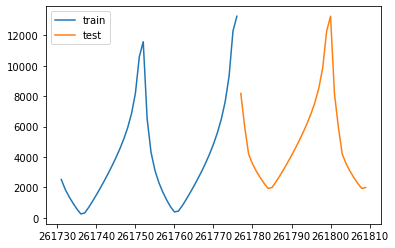

ID: 266
BEST: 13.037771940247431
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



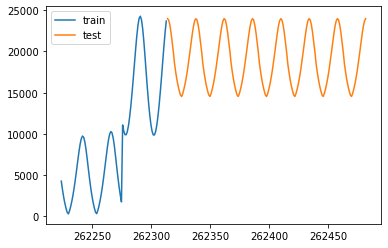

ID: 267
BEST: 11.327788236313406
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



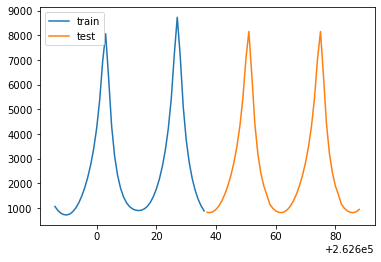

ID: 268
BEST: 6.338524293440429
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



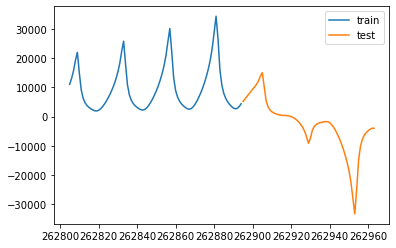

ID: 269
BEST: 8.066595489795466
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



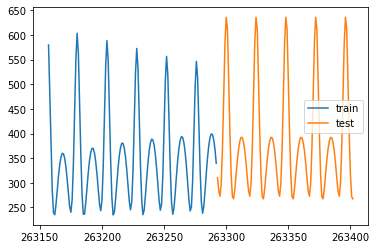

ID: 270
BEST: 24.50958822908155
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



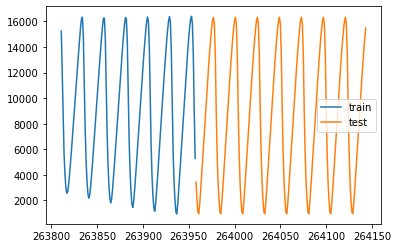

ID: 271
BEST: 25.432163364663456
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



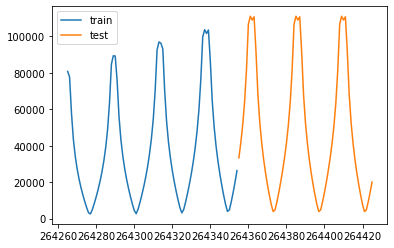

ID: 272
BEST: 9.652396737968626
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



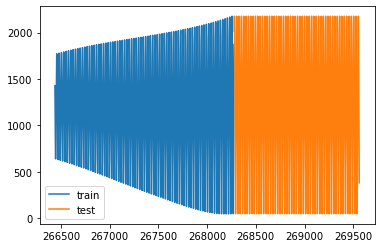

ID: 273
BEST: 1.2729477322262985
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



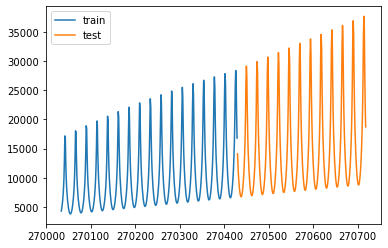

ID: 274
BEST: 0.03133854666029517
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



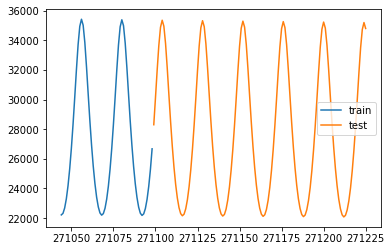

ID: 275
BEST: 17.251626765852997
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



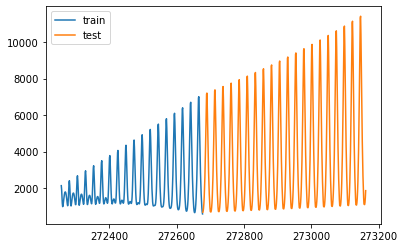

ID: 276
BEST: 0.21116216060285123
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



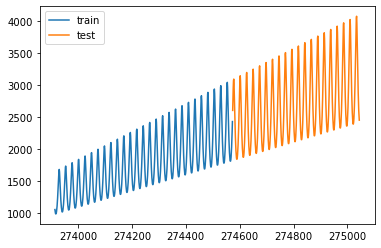

ID: 277
BEST: 12.116286846739378
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



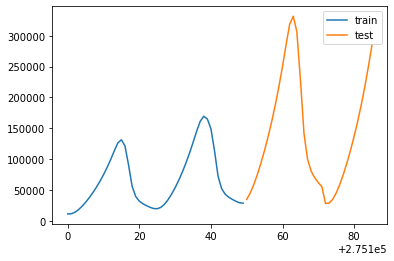

ID: 278
BEST: 0.07349248174585228
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



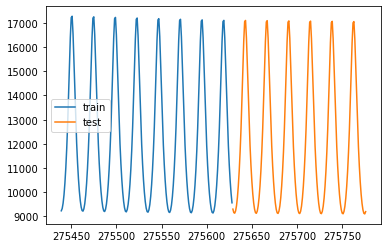

ID: 279
BEST: 14.03755719335383
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



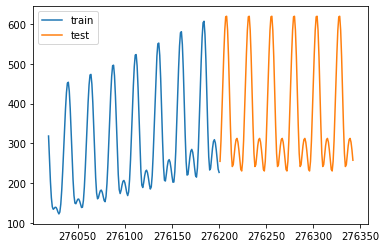

ID: 280
BEST: 1.4437863385492382
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



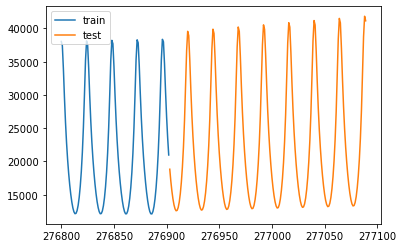

ID: 281
BEST: 7.932812887261023
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



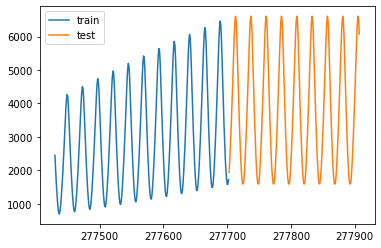

ID: 282
BEST: 0.11847878779910623
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'add'}



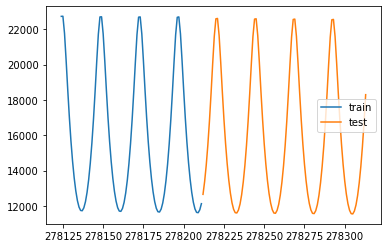

ID: 283
BEST: 0.03747391226195217
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



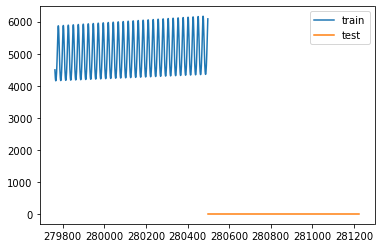

ID: 284
BEST: 0.1129288739269174
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



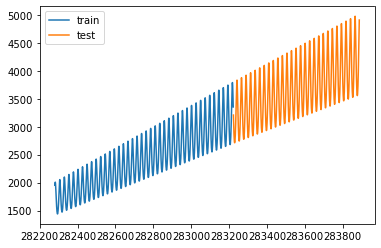

ID: 285
BEST: 0.9530693194783147
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



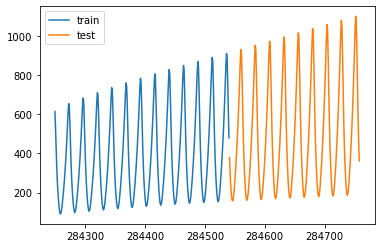

ID: 286
BEST: 11.802968795779234
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



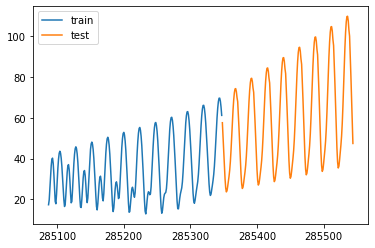

ID: 287
BEST: 0.769080327661919
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



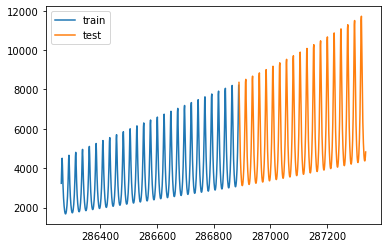

ID: 288
BEST: 7.620120236842568
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



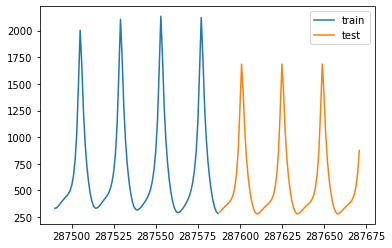

ID: 289
BEST: 4.518411330479209
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'add'}



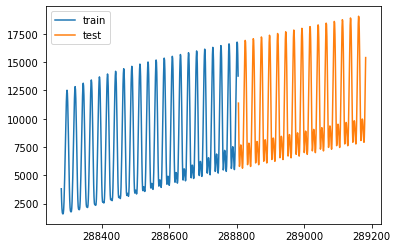

ID: 290
BEST: 2.825713349777496
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



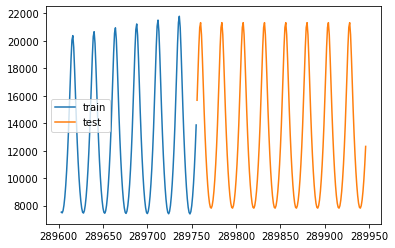

ID: 291
BEST: 0.8768099945252619
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



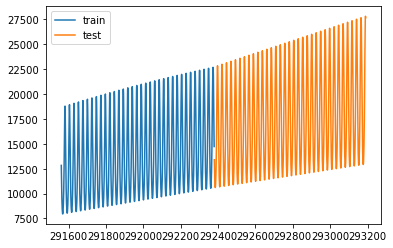

ID: 292
BEST: 9.089361356711697
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



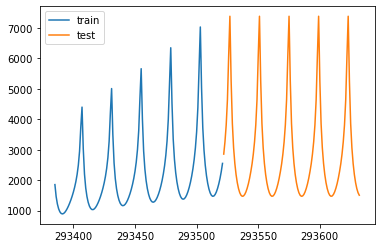

ID: 293
BEST: 11.629936708864893
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



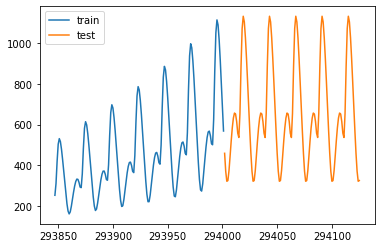

ID: 294
BEST: 0.504161048658107
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



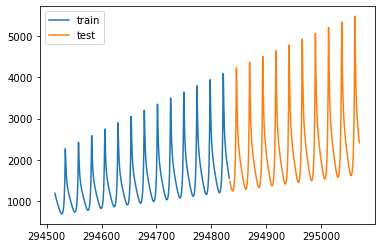

ID: 295
BEST: 0.16382079082441764
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



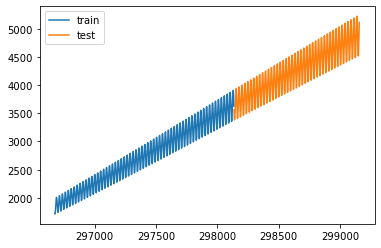

ID: 296
BEST: 0.29640509132443843
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



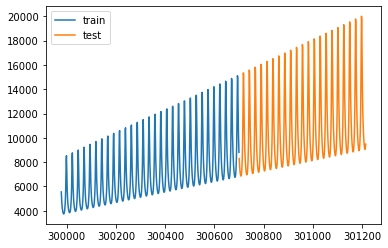

ID: 297
BEST: 0.3171277269897046
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



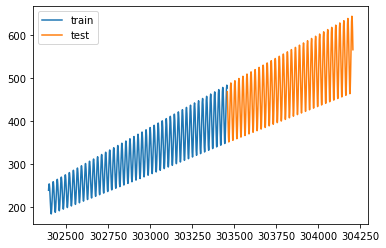

ID: 298
BEST: 17.363491801464527
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



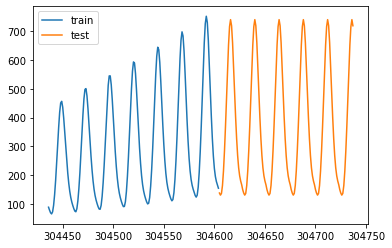

ID: 299
BEST: 0.11037361596868685
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



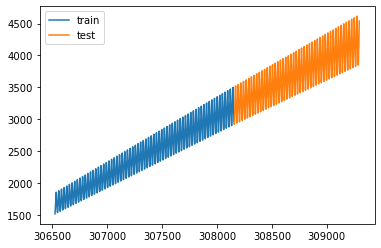

ID: 300
BEST: 1.4761930390904299
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



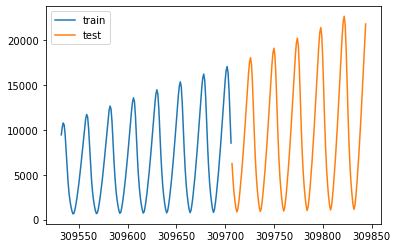

ID: 301
BEST: 200.0
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



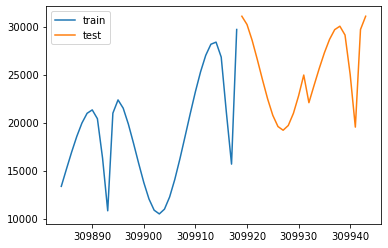

ID: 302
BEST: 0.8354896644573151
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



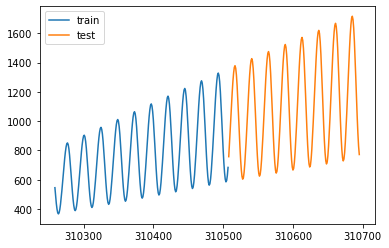

ID: 303
BEST: 6.765709242397631
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



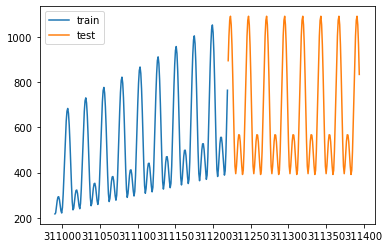

ID: 304
BEST: 3.1484426171657254
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



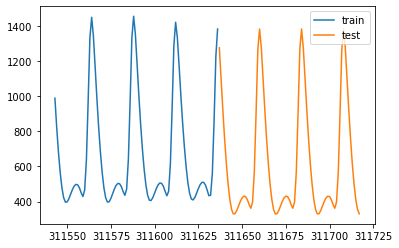

ID: 305
BEST: 17.514128330709635
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



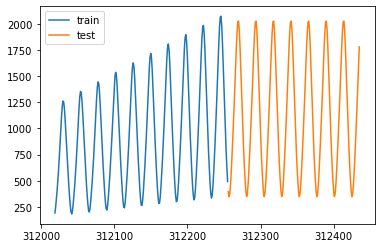

ID: 306
BEST: 1.7317234671881663
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



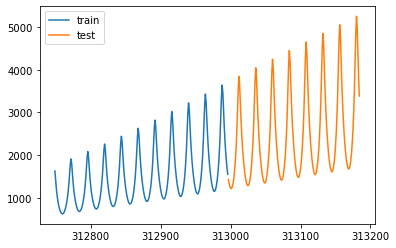

ID: 307
BEST: 0.6210978553743831
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'add'}



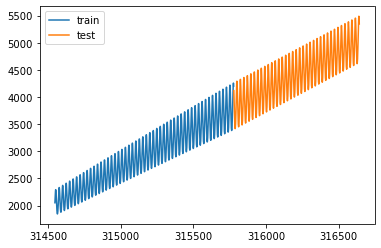

ID: 308
BEST: 3.2853897722413747
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



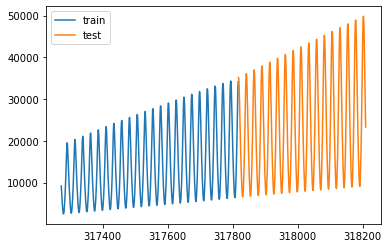

ID: 309
BEST: 3.554229886961887
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



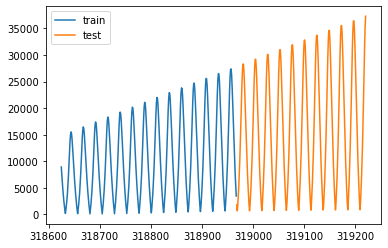

ID: 310
BEST: 4.345012702976185
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



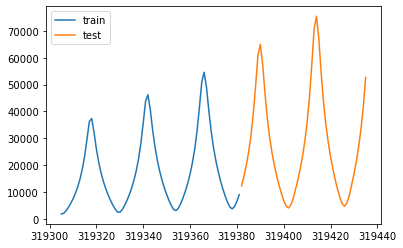

ID: 311
BEST: 0.8128506125099658
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



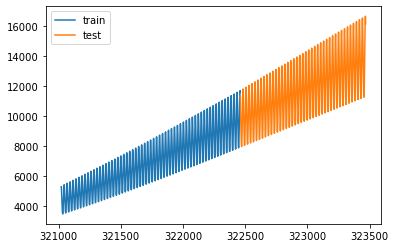

ID: 312
BEST: 0.5550921305530853
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



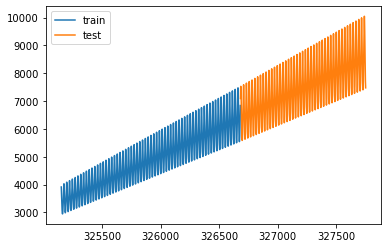

ID: 313
BEST: 1.4813470693419624
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



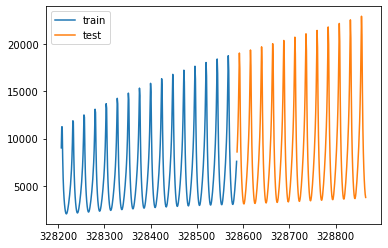

ID: 314
BEST: 12.376895646892537
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



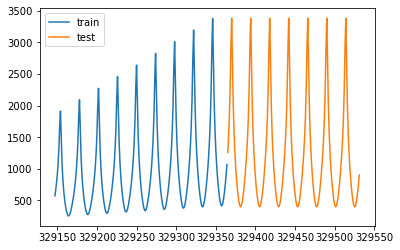

ID: 315
BEST: 17.547337727044475
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



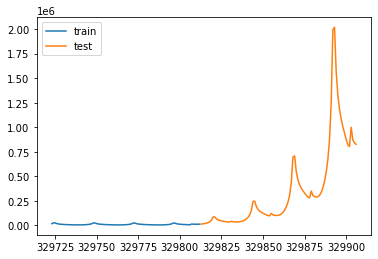

ID: 316
BEST: 2.404373842940157
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



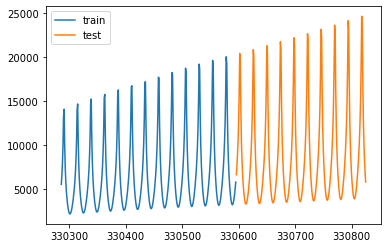

ID: 317
BEST: 10.742686163605446
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



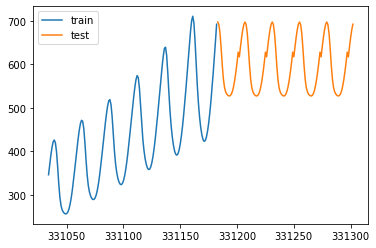

ID: 318
BEST: 200.0
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



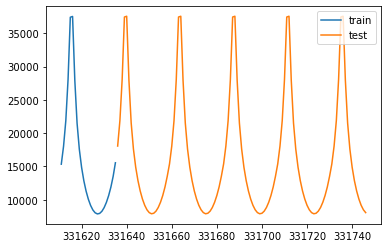

ID: 319
BEST: 12.774683467134995
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



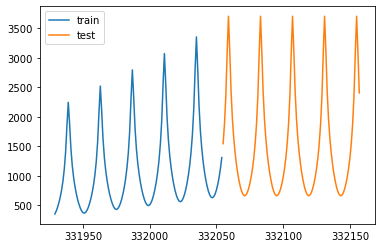

ID: 320
BEST: 200.0
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



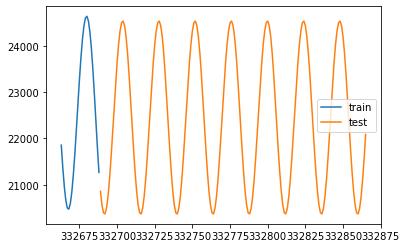

ID: 321
BEST: 0.9223116076884406
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



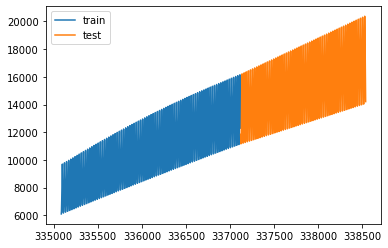

ID: 322
BEST: 8.794174633476393
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



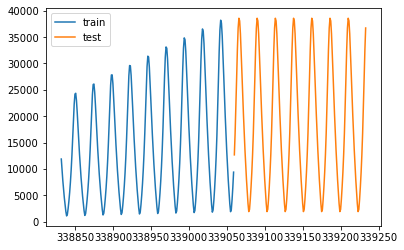

ID: 323
BEST: 0.29347864027399834
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



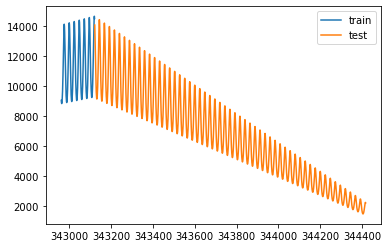

ID: 324
BEST: 12.995814593195337
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



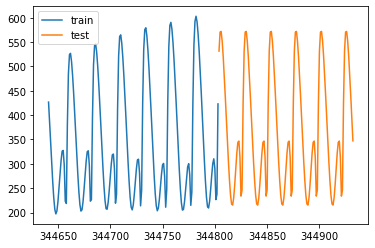

ID: 325
BEST: 4.849884997509735
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



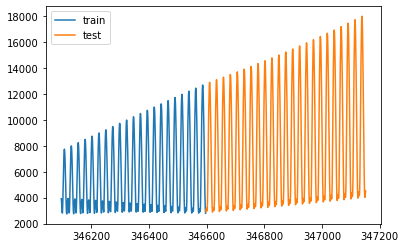

ID: 326
BEST: 13.538294669566566
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



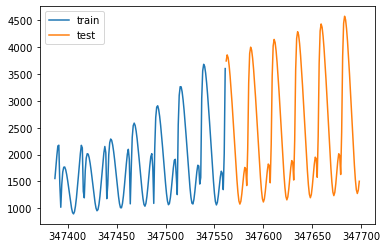

ID: 327
BEST: 2.758011504884338
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



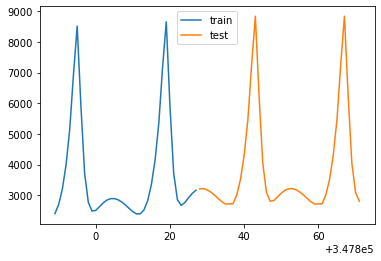

ID: 328
BEST: 2.2013647024288034
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



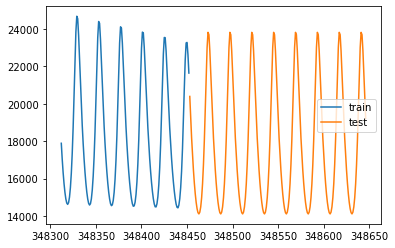

ID: 329
BEST: 0.06866925841929632
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'add'}



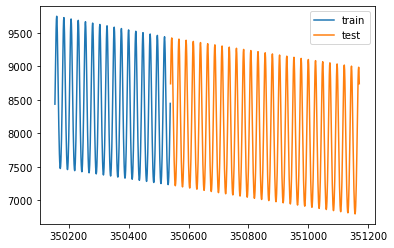

ID: 330
BEST: 4.602401359626564
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



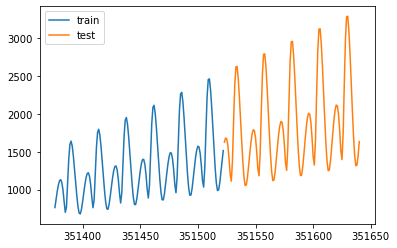

ID: 331
BEST: 0.1741342739007029
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



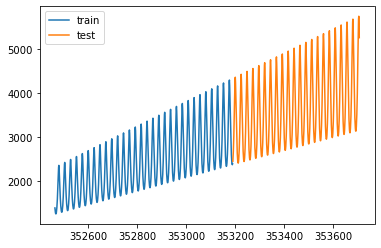

ID: 332
BEST: 15.406746226520058
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



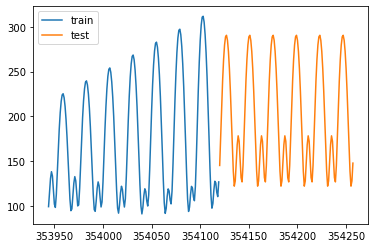

ID: 333
BEST: 0.6636057303041218
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



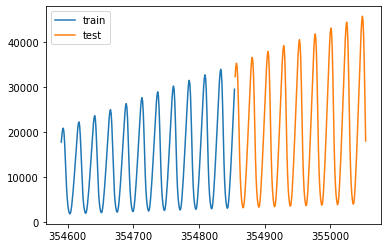

ID: 334
BEST: 0.28847275096527125
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



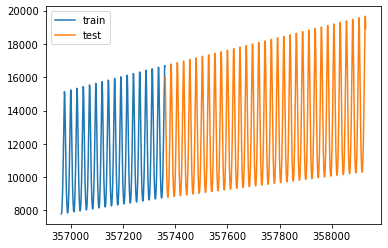

ID: 335
BEST: 0.6100035131865333
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



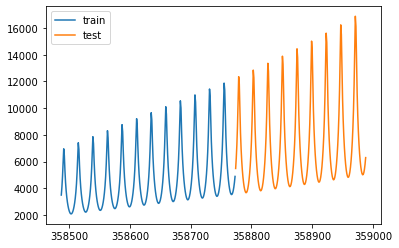

ID: 336
BEST: 15.736673547771595
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'add'}



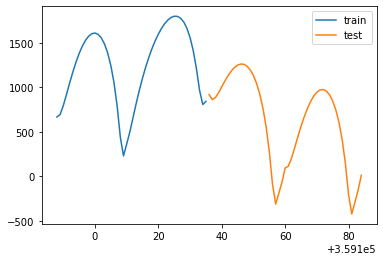

ID: 337
BEST: 1.1155185614025225
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'add'}



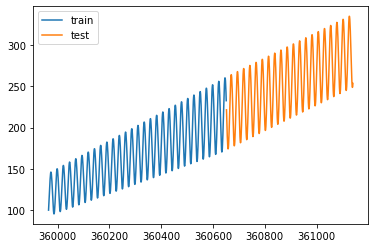

ID: 338
BEST: 7.120066417456615
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



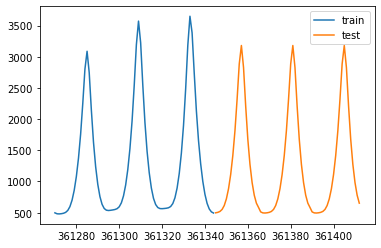

ID: 339
BEST: 10.480298029599448
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



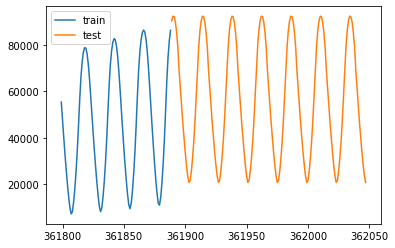

ID: 340
BEST: 2.5950137727378166
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



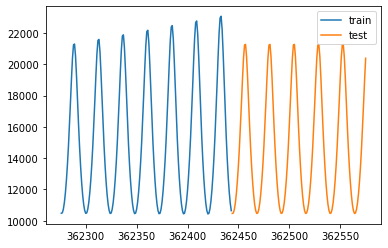

ID: 341
BEST: 10.81630817851034
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



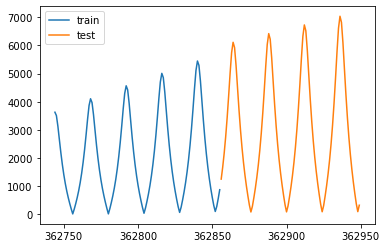

ID: 342
BEST: 0.18327107935745293
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'add'}



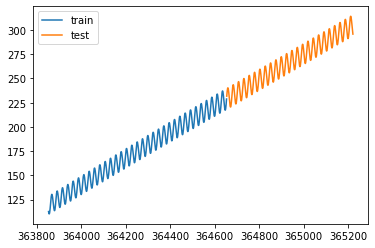

ID: 343
BEST: 12.202704091596098
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



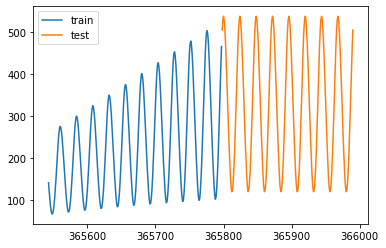

ID: 344
BEST: 0.7485409597131821
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



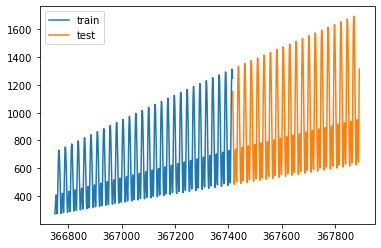

ID: 345
BEST: 15.417452785910804
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



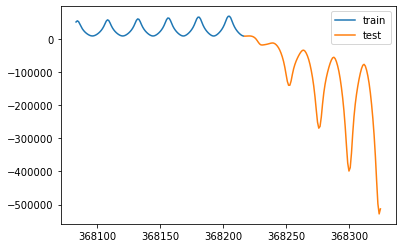

ID: 346
BEST: 8.294605290328324
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



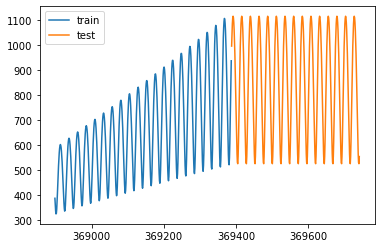

ID: 347
BEST: 17.023840086963414
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



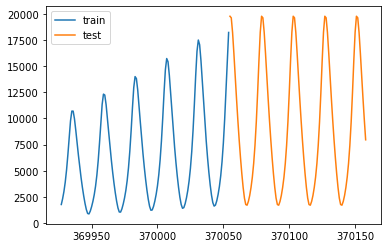

ID: 348
BEST: 0.019182369143842904
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



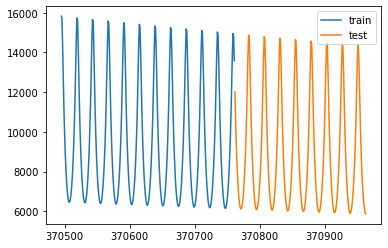

ID: 349
BEST: 28.20025876344899
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



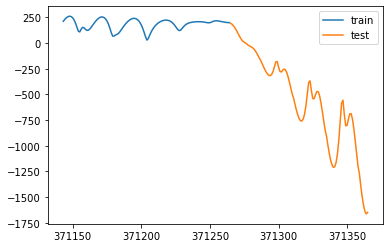

ID: 350
BEST: 1.1328616422658644
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



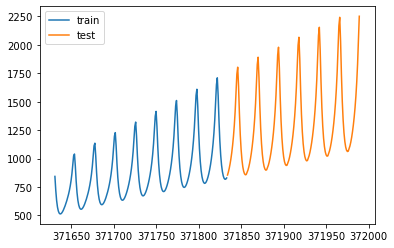

ID: 351
BEST: 52.25983207997369
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



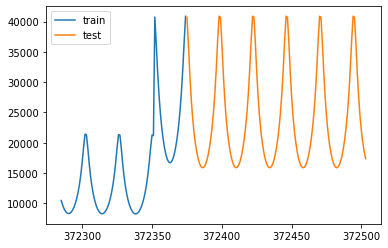

ID: 352
BEST: 3.6968298238714032
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



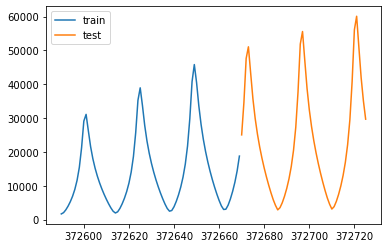

ID: 353
BEST: 3.0551241378466267
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



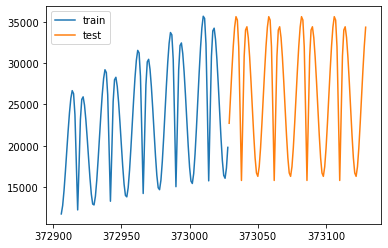

ID: 354
BEST: 21.35599799749079
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



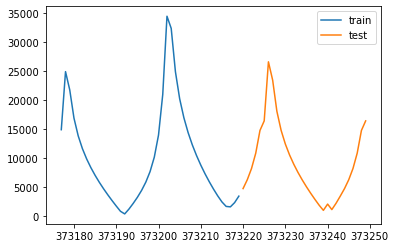

ID: 355
BEST: 0.7958475282230929
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



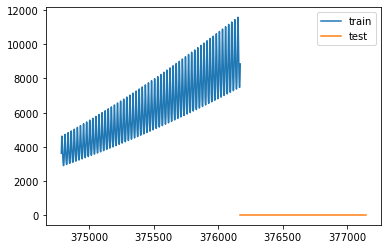

ID: 356
BEST: 1.1874617347727483
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



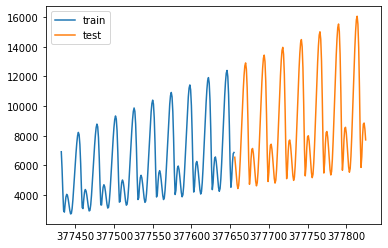

ID: 357
BEST: 9.364745144118611
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'add'}



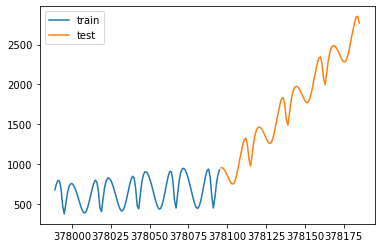

ID: 358
BEST: 0.2252420141601123
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



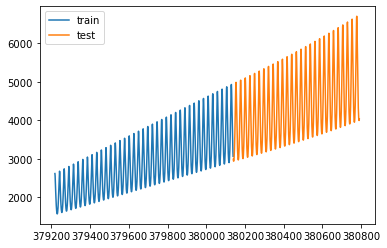

ID: 359
BEST: 6.941176074889713
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



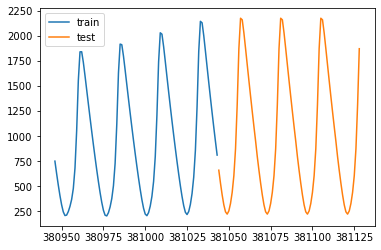

ID: 360
BEST: 0.243458477328844
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



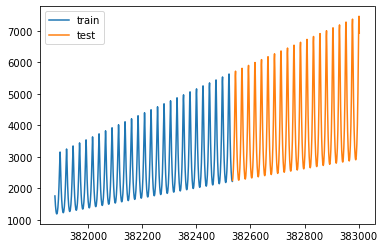

ID: 361
BEST: 11.195179402091368
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



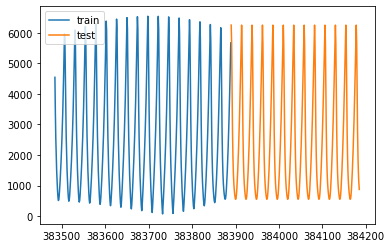

ID: 362
BEST: 21.41238195984911
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



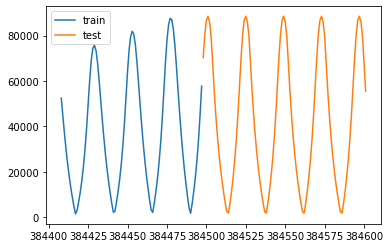

ID: 363
BEST: 0.2690741940877469
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



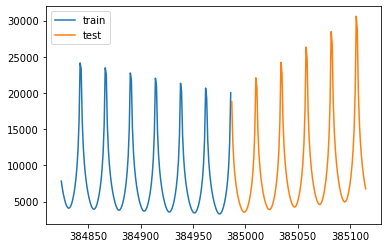

ID: 364
BEST: 0.014088131469623653
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



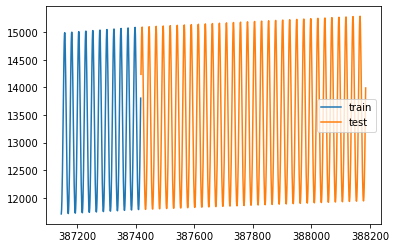

ID: 365
BEST: 17.833849928141124
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'add'}



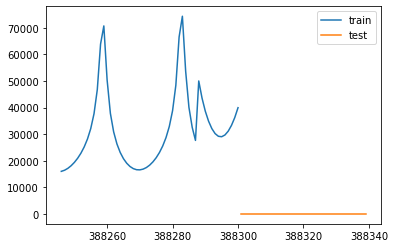

ID: 366
BEST: 1.2808372032067423
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



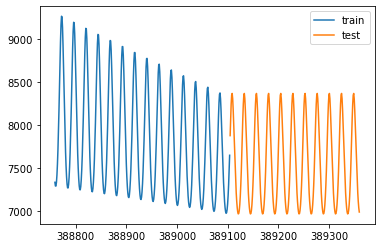

ID: 367
BEST: 7.47864844307375
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



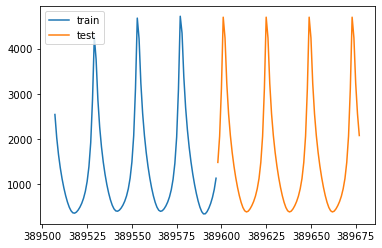

ID: 368
BEST: 37.968378607107944
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



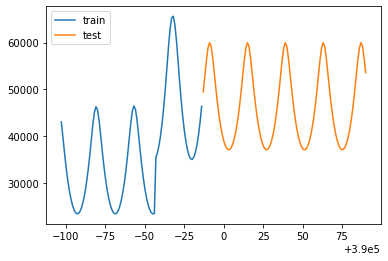

ID: 369
BEST: 0.416598343045207
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



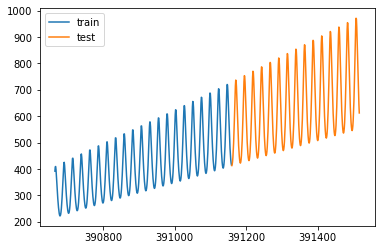

ID: 370
BEST: 3.129657382063991
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



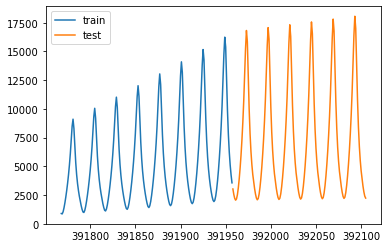

ID: 371
BEST: 0.05292299753172975
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



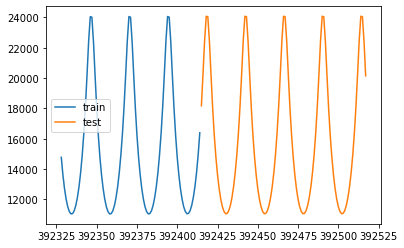

ID: 372
BEST: 2.602681771815685
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



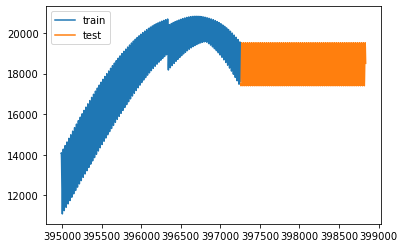

ID: 373
BEST: 1.5910504073286102
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



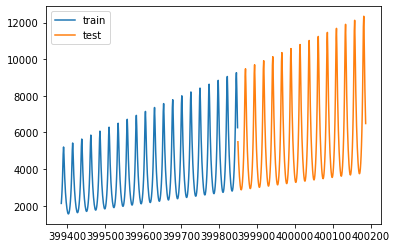

ID: 374
BEST: 0.12989461184451612
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



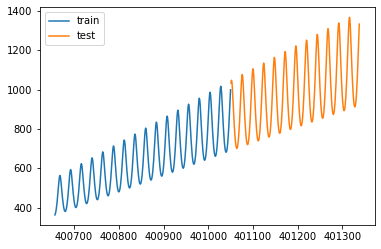

ID: 375
BEST: 8.627853956281154
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



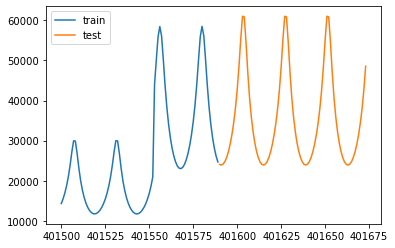

ID: 376
BEST: 0.5972528019714338
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



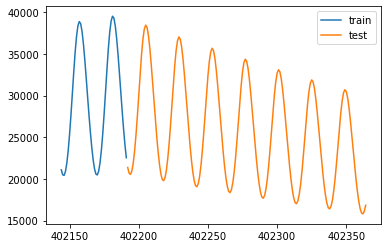

ID: 377
BEST: 9.464288713619004
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



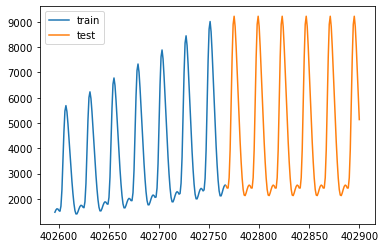

ID: 378
BEST: 11.897407301017614
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



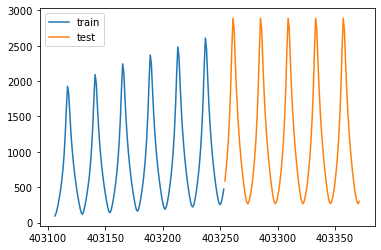

ID: 379
BEST: 0.24429615563816154
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



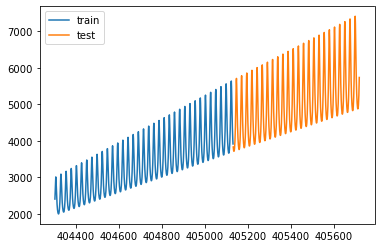

ID: 380
BEST: 14.582365596295249
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



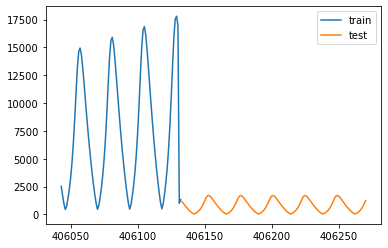

ID: 381
BEST: 0.03201306509295681
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



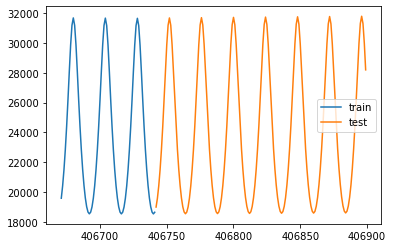

ID: 382
BEST: 50.52643053036928
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



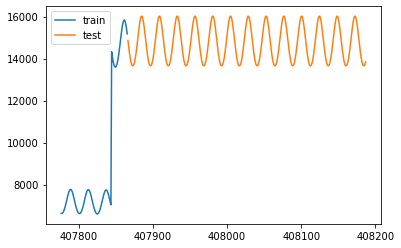

ID: 383
BEST: 0.3487116247473779
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



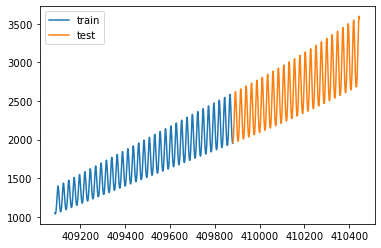

ID: 384
BEST: 4.722388066257926
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



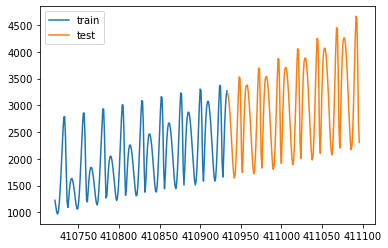

ID: 385
BEST: 0.49281911742223405
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



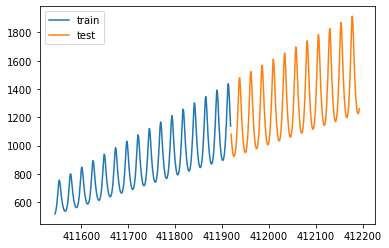

ID: 386
BEST: 0.34146413844931184
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



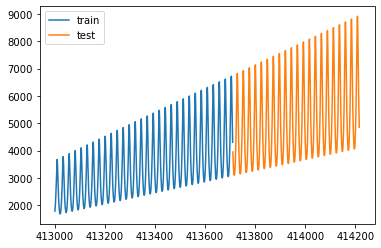

ID: 387
BEST: 0.28240792966319195
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



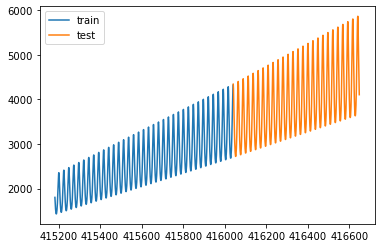

ID: 388
BEST: 7.6187011439403545
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



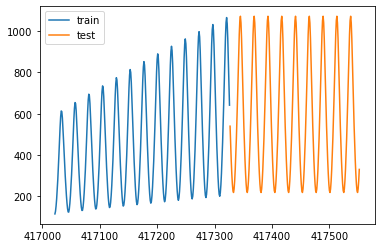

ID: 389
BEST: 11.309009885196106
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



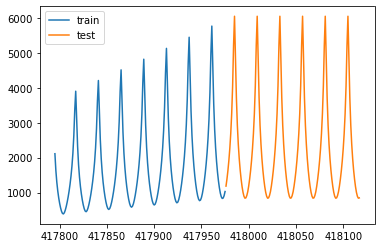

ID: 390
BEST: 2.9447572453619912
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



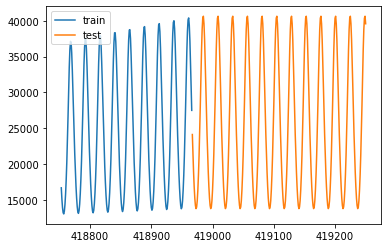

ID: 391
BEST: 21.492431353161294
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'add'}



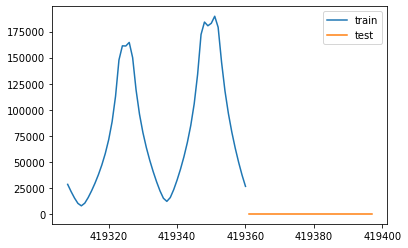

ID: 392
BEST: 0.4654044260519034
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



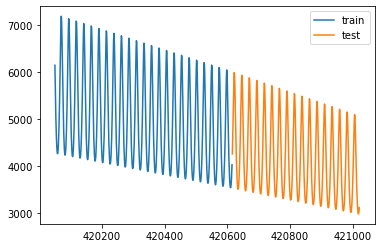

ID: 393
BEST: 1.0738012877950214
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



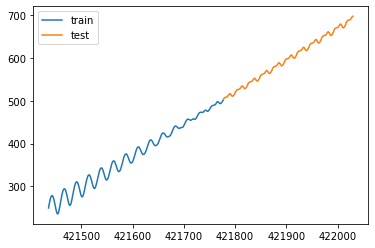

ID: 394
BEST: 0.4370259678018667
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



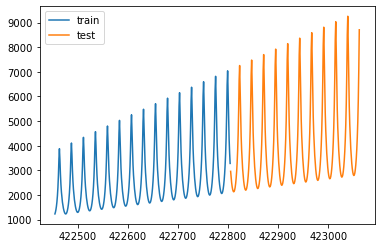

ID: 395
BEST: 13.037124868020566
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



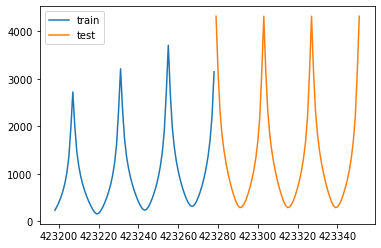

ID: 396
BEST: 14.268778552654645
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



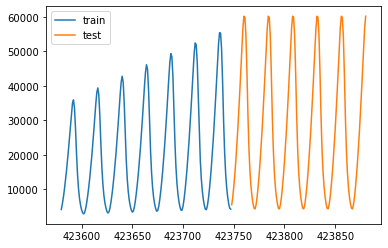

ID: 397
BEST: 10.559513684644536
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



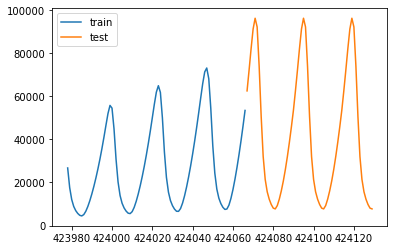

ID: 398
BEST: 6.608477318470822
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



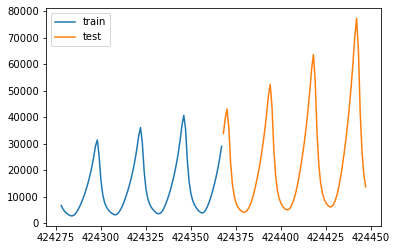

ID: 399
BEST: 17.94233862627177
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



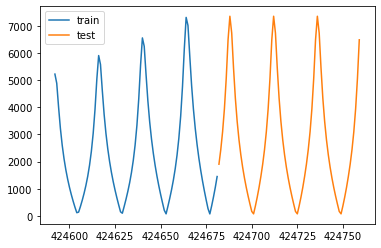

ID: 400
BEST: 11.532707489834667
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



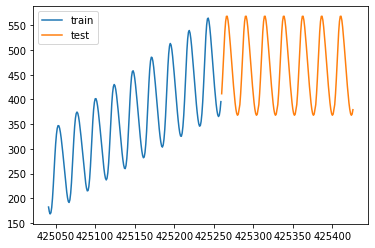

ID: 401
BEST: 8.2375878290342
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



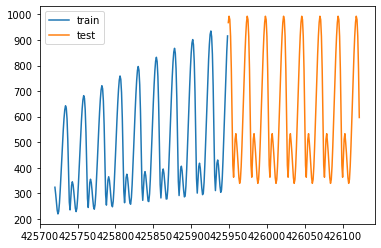

ID: 402
BEST: 52.70462697074918
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'add'}



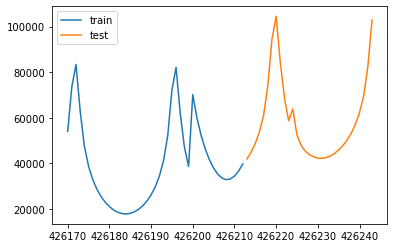

ID: 403
BEST: 0.78890550938771
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



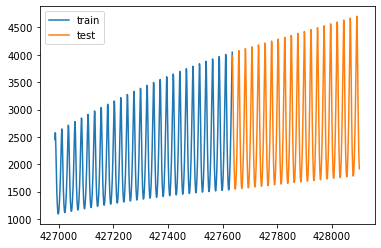

ID: 404
BEST: 3.96259000311349
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



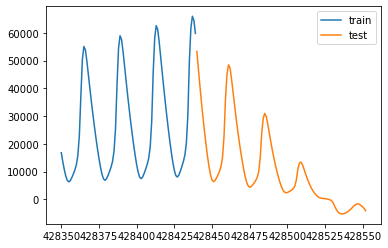

ID: 405
BEST: 5.773446264697977
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



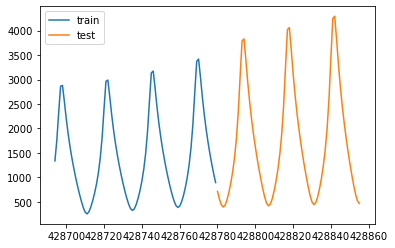

ID: 406
BEST: 0.07576854787007693
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



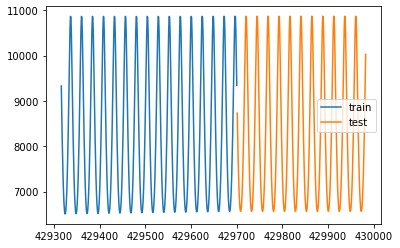

ID: 407
BEST: 0.024894862111012404
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



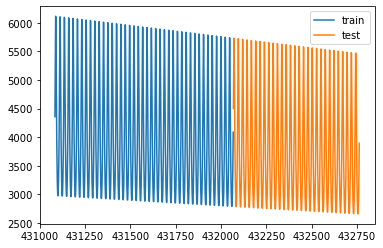

ID: 408
BEST: 8.937438533813397
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



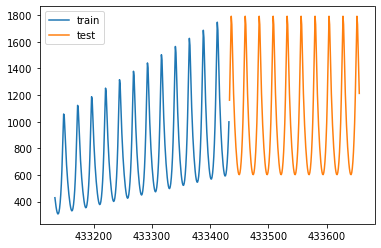

ID: 409
BEST: 0.838736315376456
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



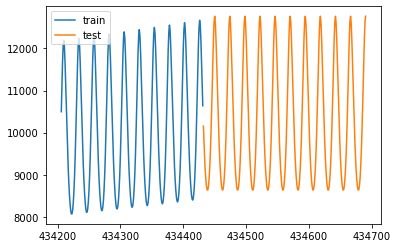

ID: 410
BEST: 3.5090541362811654
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



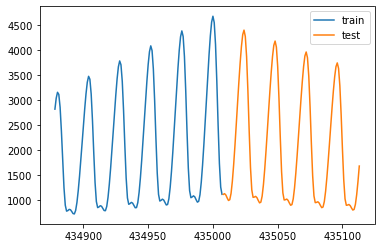

ID: 411
BEST: 8.946054879854179
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



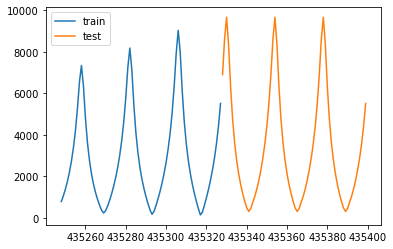

ID: 412
BEST: 0.007596256913648747
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



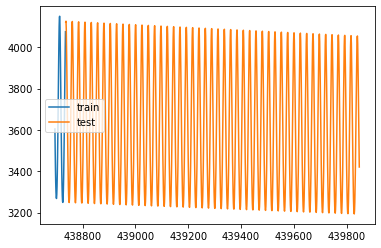

ID: 413
BEST: 10.028542196315888
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



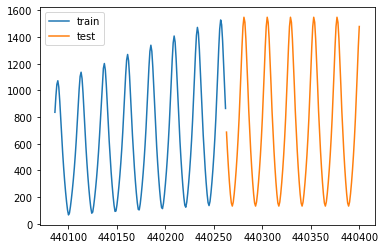

ID: 414
BEST: 6.206198913907894
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



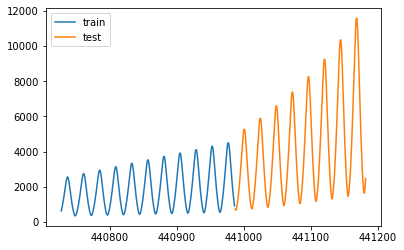

ID: 415
BEST: 0.6339799303198222
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



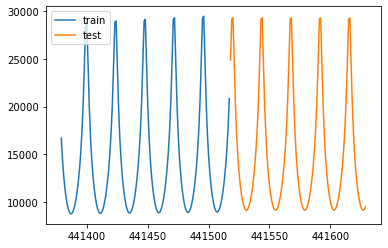

ID: 416
BEST: 0.11466949322355227
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



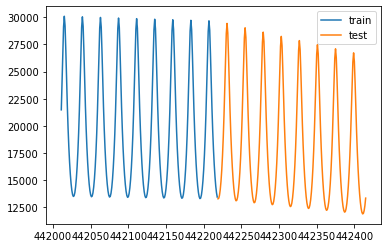

ID: 417
BEST: 7.180332652270975
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



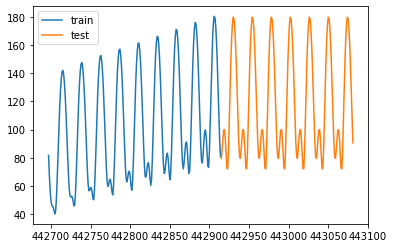

ID: 418
BEST: 17.752859149104914
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



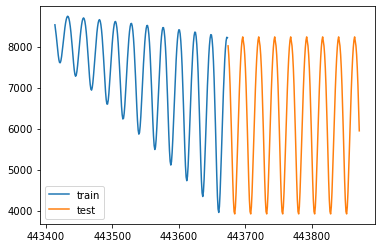

ID: 419
BEST: 5.491933494203627
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



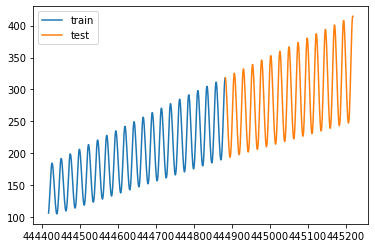

ID: 420
BEST: 65.3767141855544
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



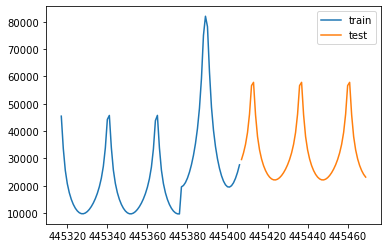

ID: 421
BEST: 200.0
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



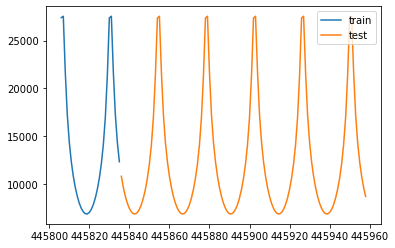

ID: 422
BEST: 0.09583037425266135
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



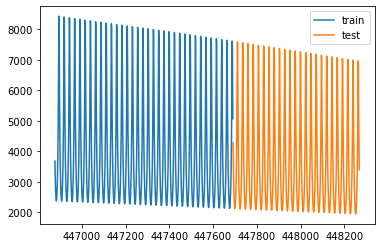

ID: 423
BEST: 0.07155977995970876
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



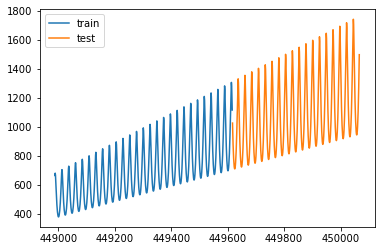

ID: 424
BEST: 15.504767205051776
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



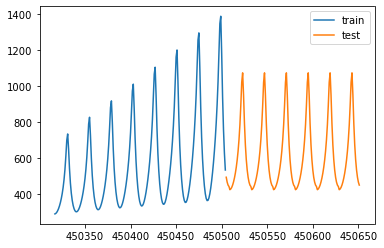

ID: 425
BEST: 4.582560379812961
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



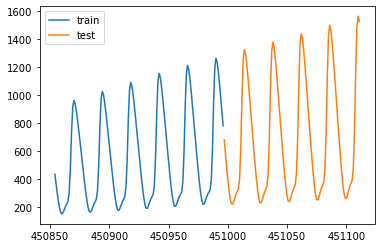

ID: 426
BEST: 10.871082578870517
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



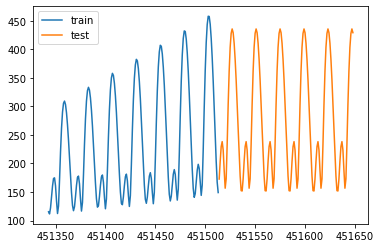

ID: 427
BEST: 0.6711216161302807
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



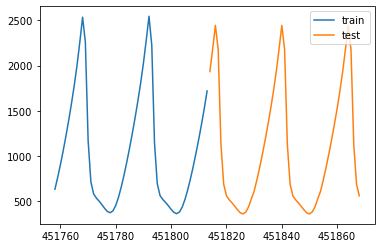

ID: 428
BEST: 5.839775557113952
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



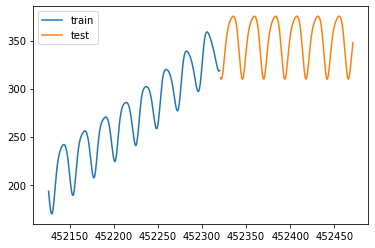

ID: 429
BEST: 1.135171114475389
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'add'}



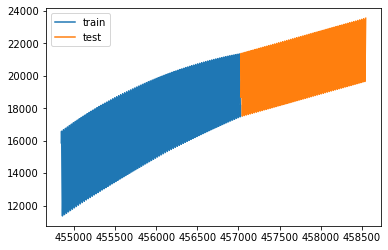

ID: 430
BEST: 3.9853634503208544
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



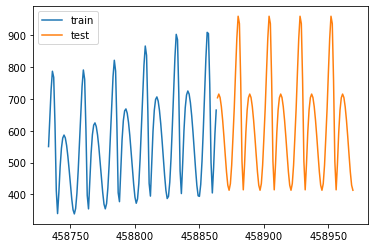

ID: 431
BEST: 2.846969314805014
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



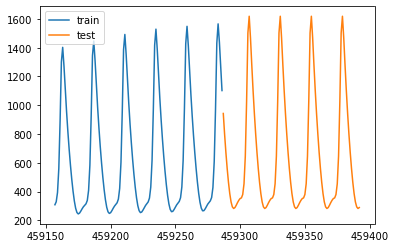

ID: 432
BEST: 8.3075657744567
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



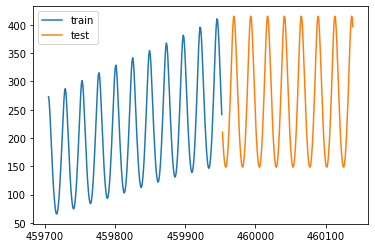

ID: 433
BEST: 1.3309512830138548
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



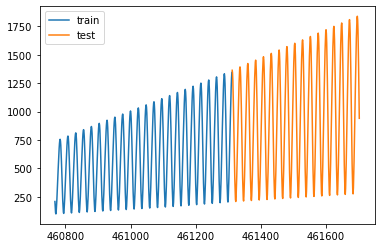

ID: 434
BEST: 6.552207025452188
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



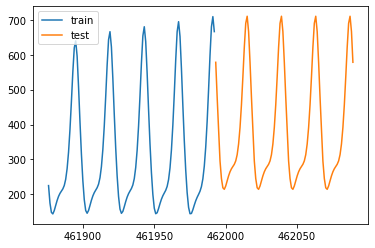

ID: 435
BEST: 9.450285696777511
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



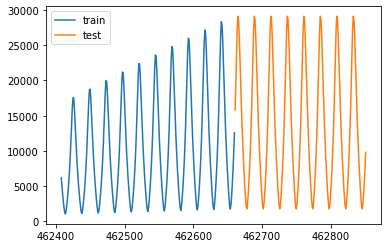

ID: 436
BEST: 0.14329792031457342
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



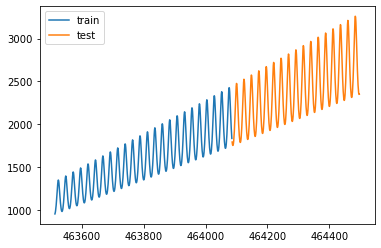

ID: 437
BEST: 0.14193984768270376
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



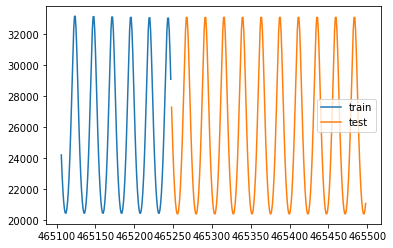

ID: 438
BEST: 28.24257730593922
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



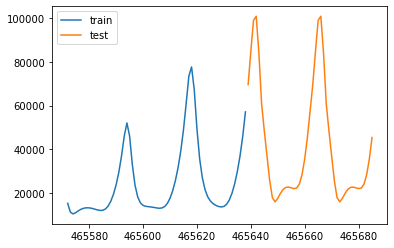

ID: 439
BEST: 2.9409742184390684
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



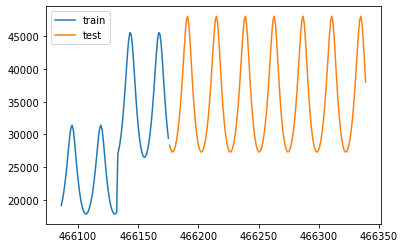

ID: 440
BEST: 0.09679867442155277
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



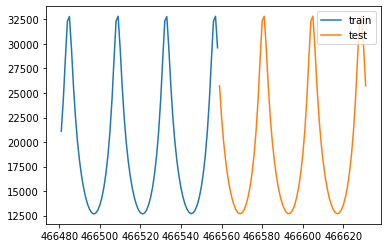

ID: 441
BEST: 26.71186077038689
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



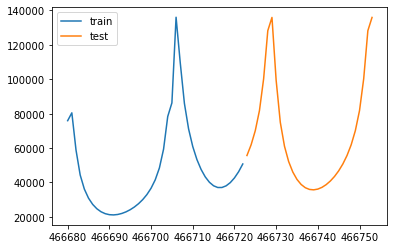

ID: 442
BEST: 2.2695773368799825
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



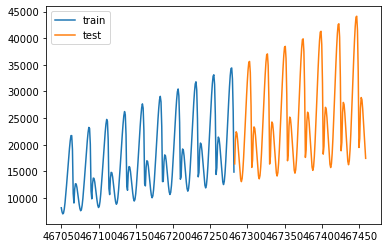

ID: 443
BEST: 15.077621418877113
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



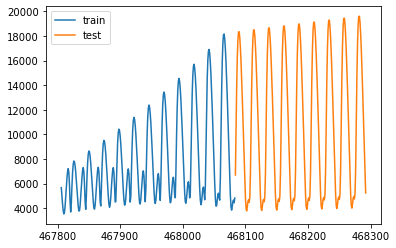

ID: 444
BEST: 1.2269400560062342
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'add'}



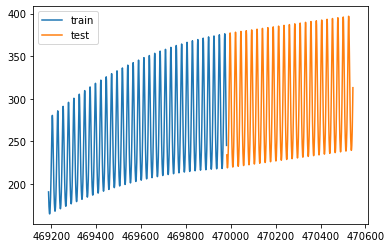

ID: 445
BEST: 9.98429781667411
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



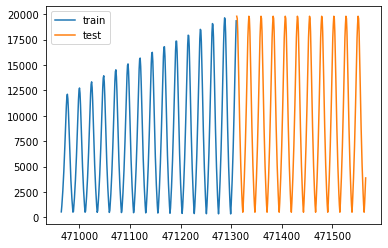

ID: 446
BEST: 8.049459121214955
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



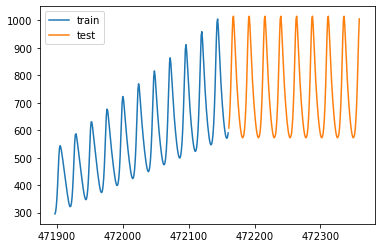

ID: 447
BEST: 4.136197674685171
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



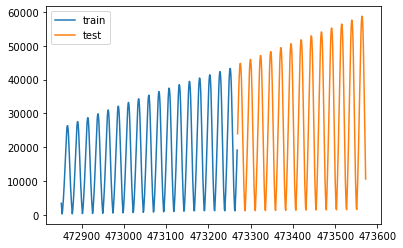

ID: 448
BEST: 5.491607370559829
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



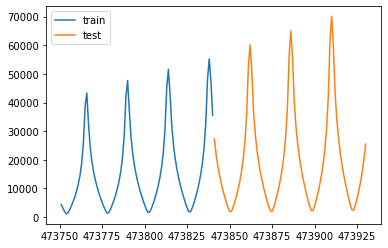

ID: 449
BEST: 8.945021619917634
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'add'}



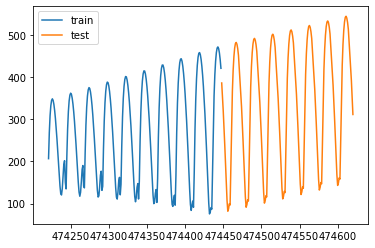

ID: 450
BEST: 0.08061941797131912
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'add'}



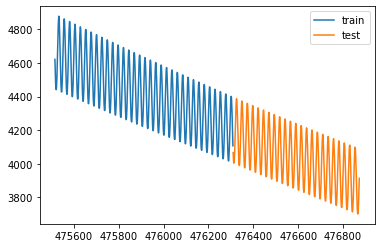

ID: 451
BEST: 0.18765731888061127
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



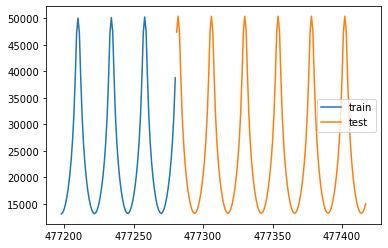

ID: 452
BEST: 10.156584296487368
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



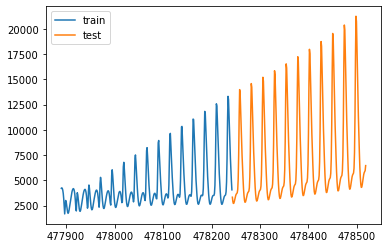

ID: 453
BEST: 13.252170786604713
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



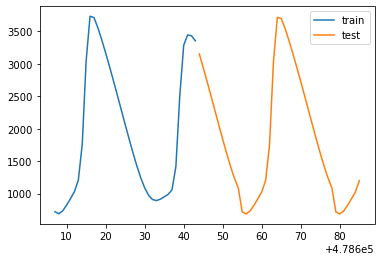

ID: 454
BEST: 23.775048156472025
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



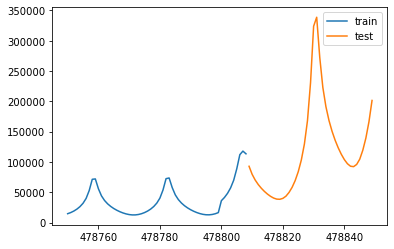

ID: 455
BEST: 1.8574420037436663
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



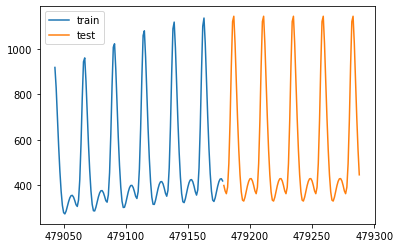

ID: 456
BEST: 0.8362894107739556
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



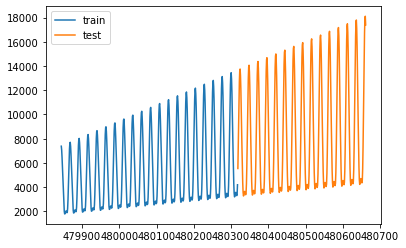

ID: 457
BEST: 11.664751035257554
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



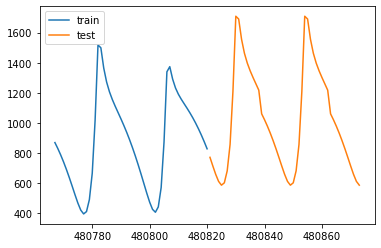

ID: 458
BEST: 0.8949087237740985
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



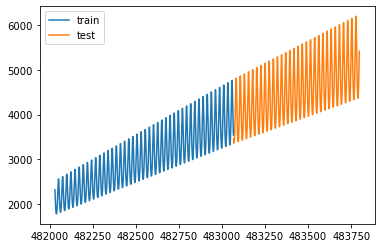

ID: 459
BEST: 5.924950716119476
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



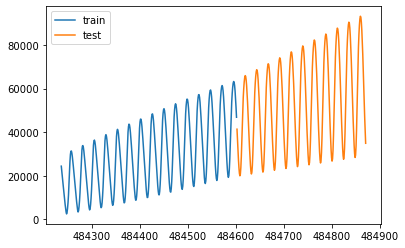

ID: 460
BEST: 3.162057039502196
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'add'}



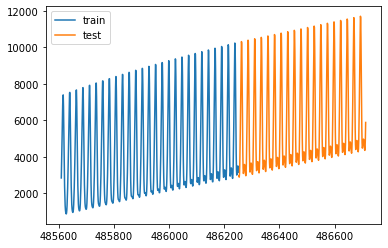

ID: 461
BEST: 52.04529813302624
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'add'}



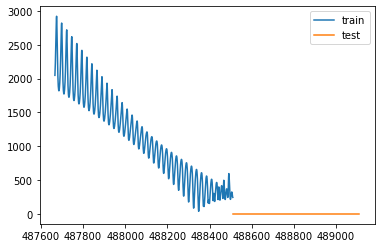

ID: 462
BEST: 0.1399090723233906
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



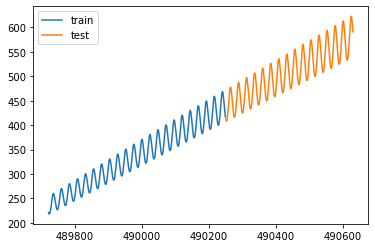

ID: 463
BEST: 4.290080396483037
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



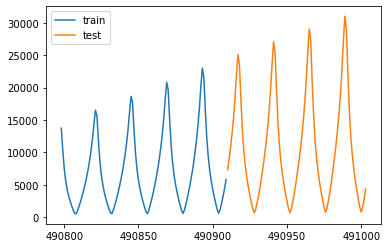

ID: 464
BEST: 14.794288377078518
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'add'}



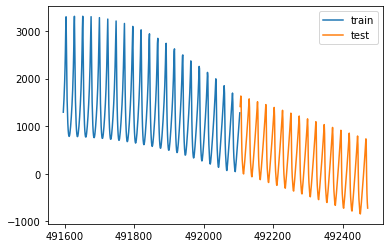

ID: 465
BEST: 0.3609132392195044
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



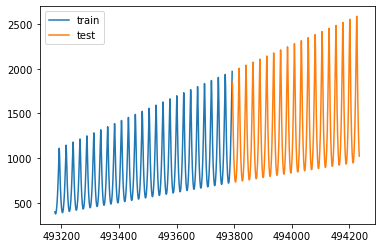

ID: 466
BEST: 18.56018130744089
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



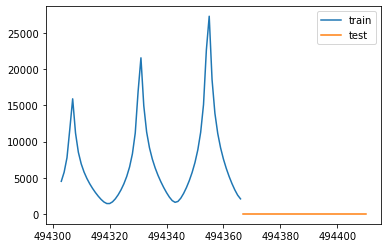

ID: 467
BEST: 4.524565081170455
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



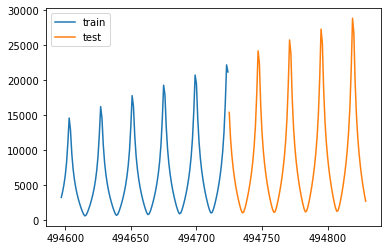

ID: 468
BEST: 0.028872928139817625
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



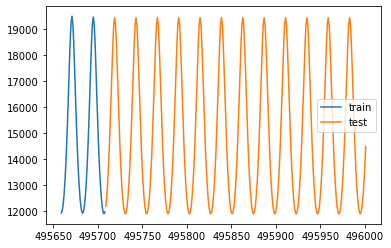

ID: 469
BEST: 10.534945800833372
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



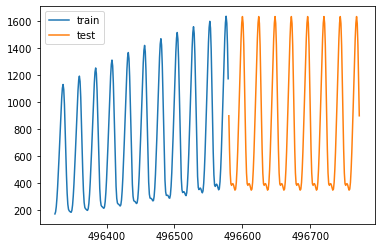

ID: 470
BEST: 35.63654258945013
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



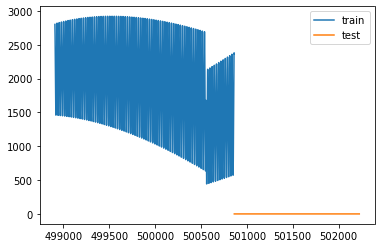

ID: 471
BEST: 19.387238085489187
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



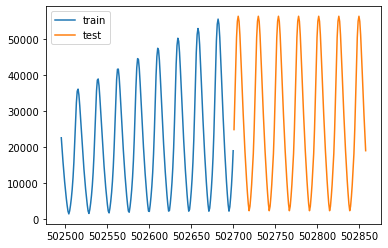

ID: 472
BEST: 72.1618986224845
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



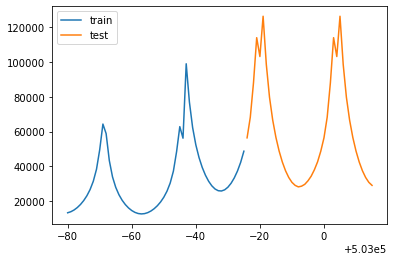

ID: 473
BEST: 2.400339985982392
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'add'}



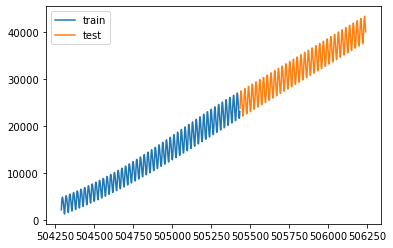

ID: 474
BEST: 1.0808541062224788
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



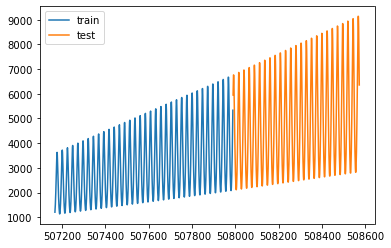

ID: 475
BEST: 10.127125227721946
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



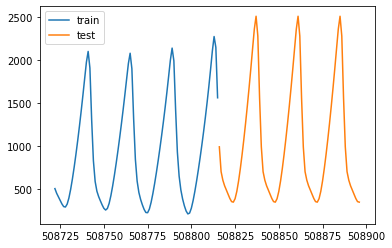

ID: 476
BEST: 0.06526480318683214
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'add'}



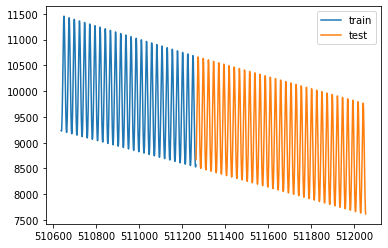

ID: 477
BEST: 6.652995948197303
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'add'}



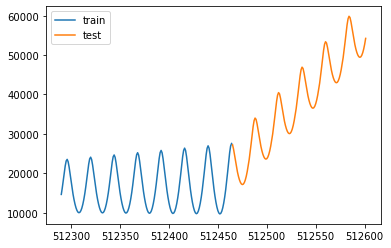

ID: 478
BEST: 52.12033235348878
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



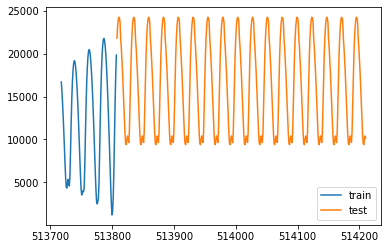

ID: 479
BEST: 0.09702613366161003
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



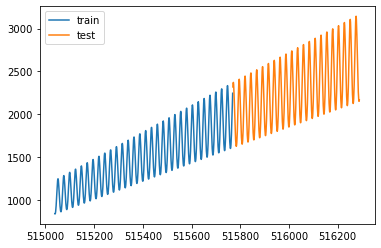

ID: 480
BEST: 0.07265427830624997
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



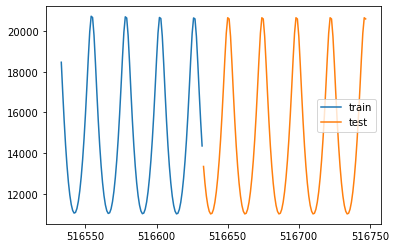

ID: 481
BEST: 0.8298445884417928
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



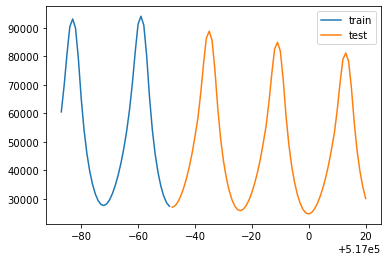

ID: 482
BEST: 65.07459083386526
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



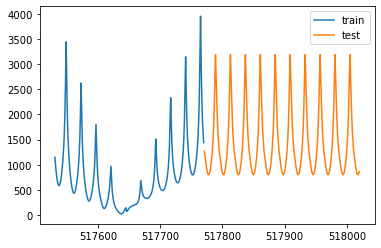

ID: 483
BEST: 118.22172187662132
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'add'}



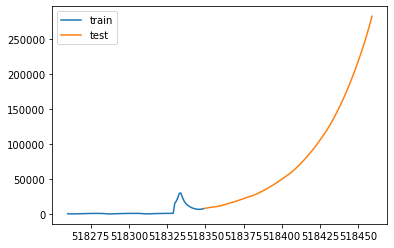

ID: 484
BEST: 6.608033922069698
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



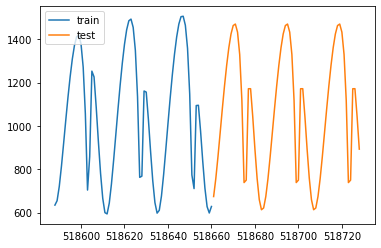

ID: 485
BEST: 12.971747986008689
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



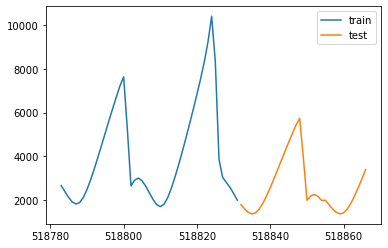

ID: 486
BEST: 21.160168845560545
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



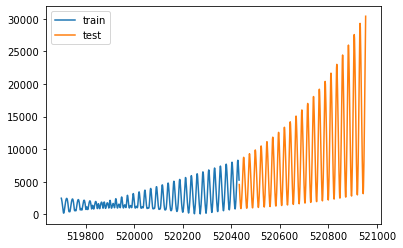

ID: 487
BEST: 25.131321230725074
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



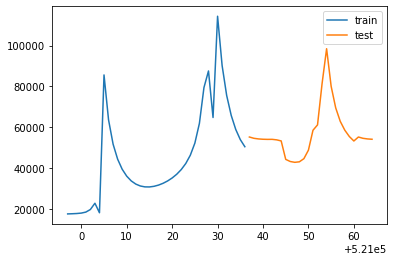

ID: 488
BEST: 1.3171402052631604
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



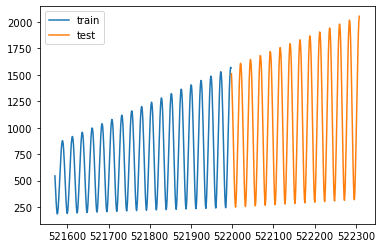

ID: 489
BEST: 0.14212232007537948
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



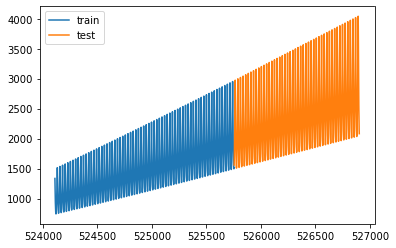

ID: 490
BEST: 3.5119093391759657
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'add'}



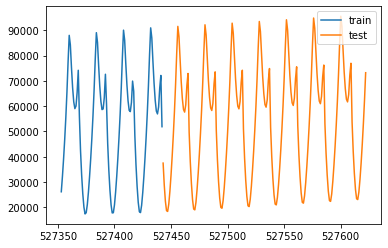

ID: 491
BEST: 2.9540608582313896
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



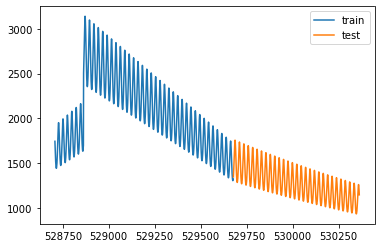

ID: 492
BEST: 4.9972804507379305
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'add'}



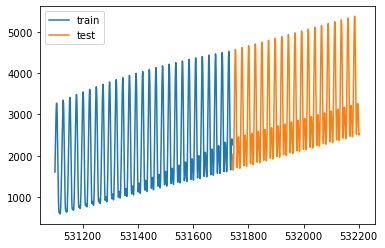

ID: 493
BEST: 1.0338995369482502
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



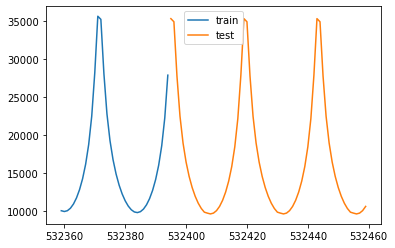

ID: 494
BEST: 0.31135656160407044
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



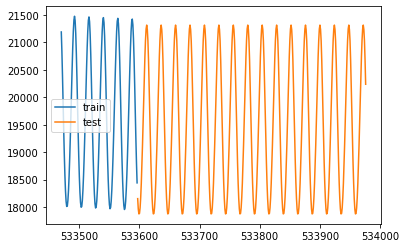

ID: 495
BEST: 0.05652865575932433
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



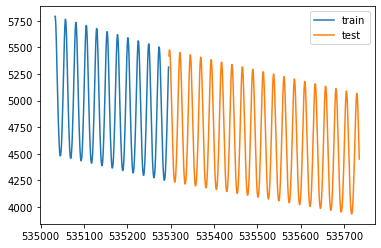

ID: 496
BEST: 8.096926057233155
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



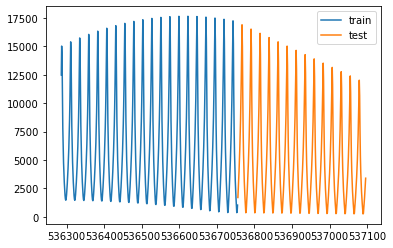

ID: 497
BEST: 33.08694834391563
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



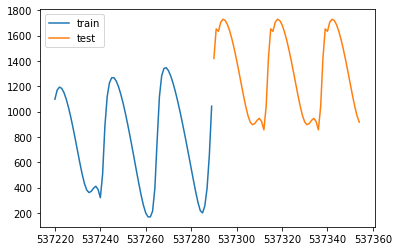

ID: 498
BEST: 25.561691281234054
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



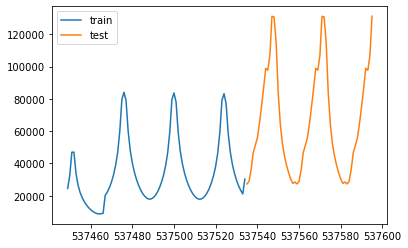

ID: 499
BEST: 1.108361938908586
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



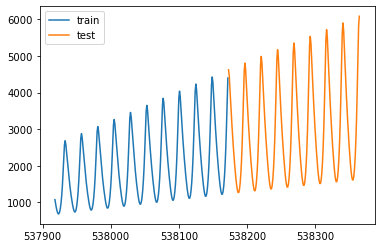

ID: 500
BEST: 3.9240345077083143
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



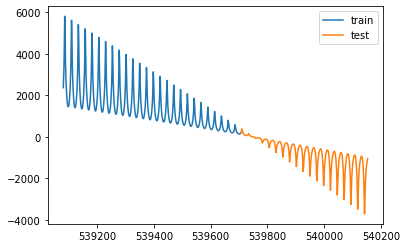

ID: 501
BEST: 48.451349256770634
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



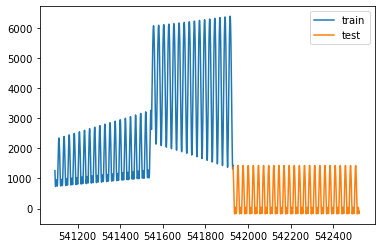

ID: 502
BEST: 200.0
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



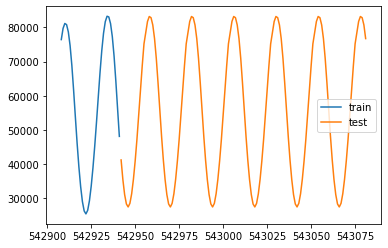

ID: 503
BEST: 6.467182049179073
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



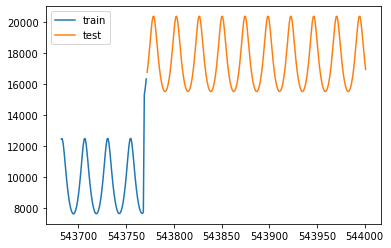

ID: 504
BEST: 16.853392027212827
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



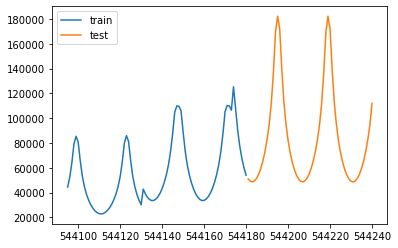

ID: 505
BEST: 1.276688685531577
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



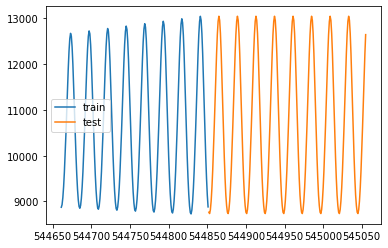

ID: 506
BEST: 19.781738728234384
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



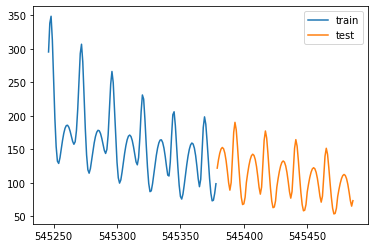

ID: 507
BEST: 200.0
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



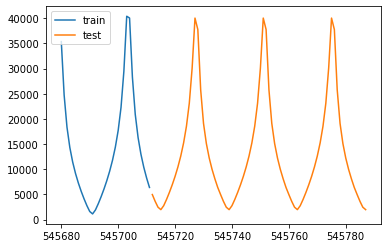

ID: 508
BEST: 1.5439862320681472
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



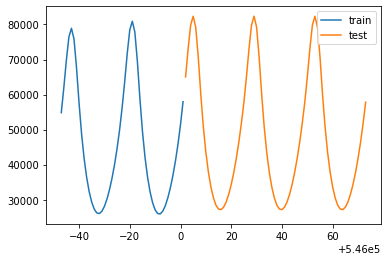

ID: 509
BEST: 0.6754186226863415
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



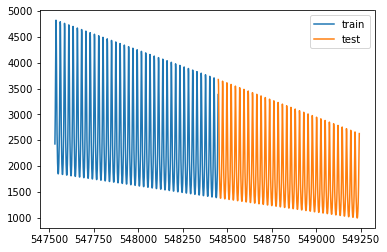

ID: 510
BEST: 8.135601706139735
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



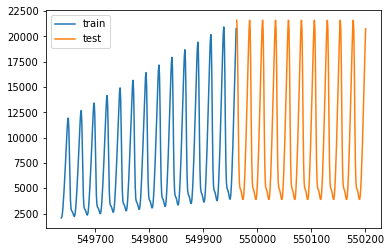

ID: 511
BEST: 2.478722706412835
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



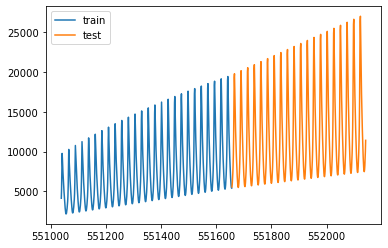

ID: 512
BEST: 8.323876518310254
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



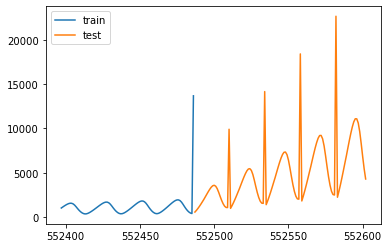

ID: 513
BEST: 30.10033479852562
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



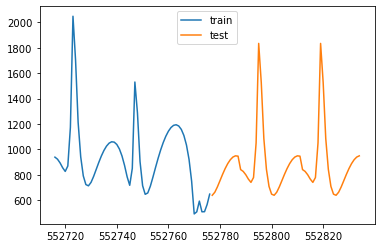

ID: 514
BEST: 2.3065692447849386
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



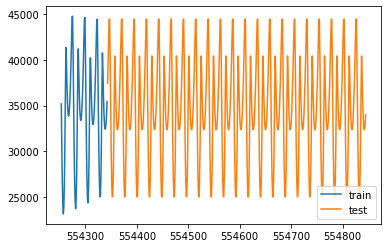

ID: 515
BEST: 11.770865796465554
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'add'}



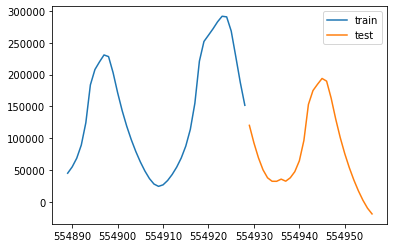

ID: 516
BEST: 1.6266332328403714
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



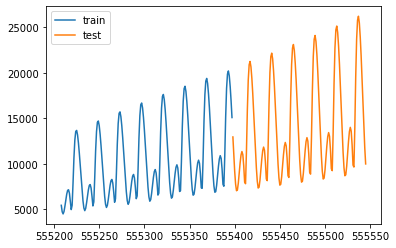

ID: 517
BEST: 2.3673668980833207
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



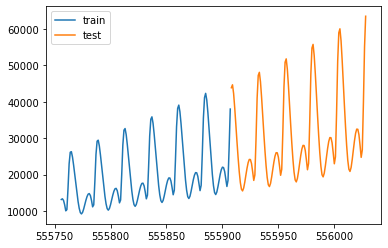

ID: 518
BEST: 24.076755850280733
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



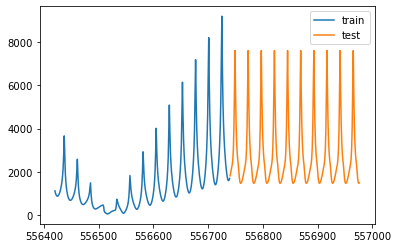

ID: 519
BEST: 4.954253787823594
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



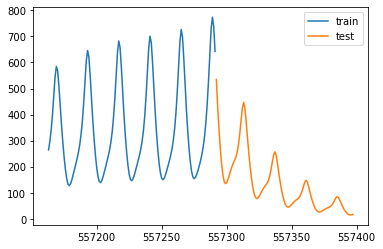

ID: 520
BEST: 5.846126276229012
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



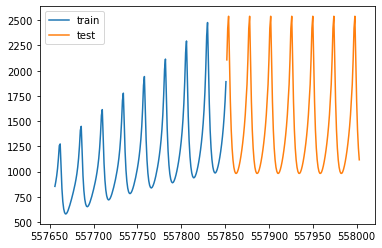

ID: 521
BEST: 0.14397706068453175
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



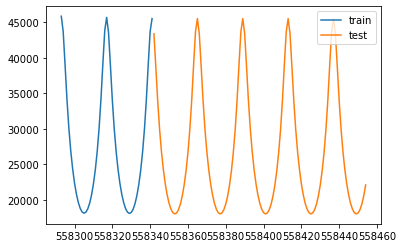

ID: 522
BEST: 0.6584349430011874
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



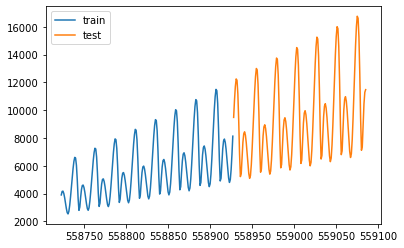

ID: 523
BEST: 10.046318343191157
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



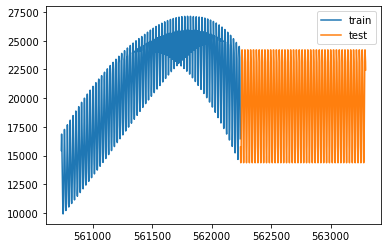

ID: 524
BEST: 18.163420562612107
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



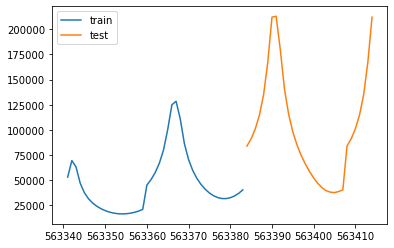

ID: 525
BEST: 8.058118339782268
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



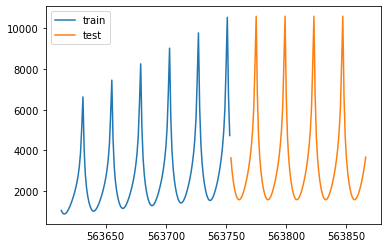

ID: 526
BEST: 0.24581866460531532
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



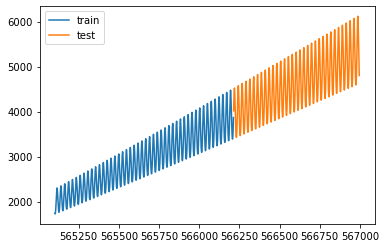

ID: 527
BEST: 200.0
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



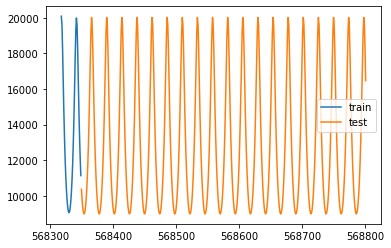

ID: 528
BEST: 10.684291352974135
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



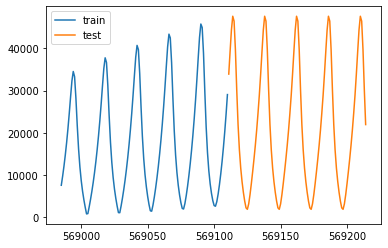

ID: 529
BEST: 0.1046578613246941
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'add'}



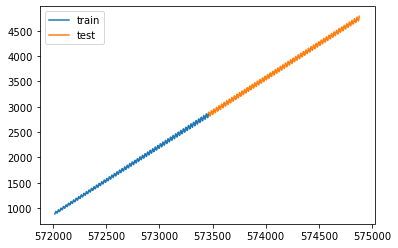

ID: 530
BEST: 1.841566372258107
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



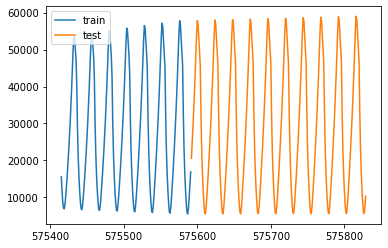

ID: 531
BEST: 0.027066230640876106
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



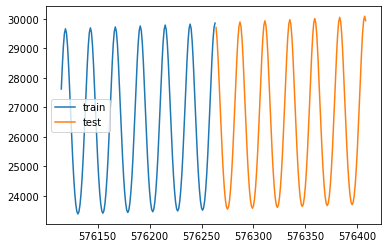

ID: 532
BEST: 9.972035388637417
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



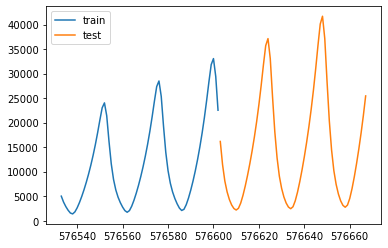

ID: 533
BEST: 0.04773541302738278
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



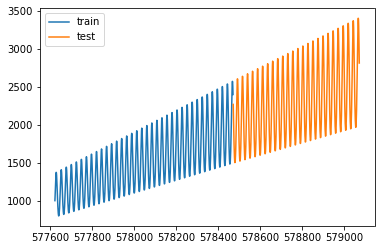

ID: 534
BEST: 2.5117015631112927
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



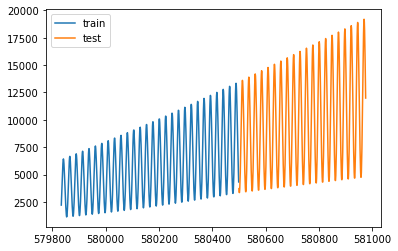

ID: 535
BEST: 0.05479811316683385
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



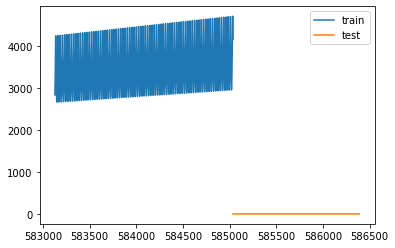

ID: 536
BEST: 0.34903133753690485
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



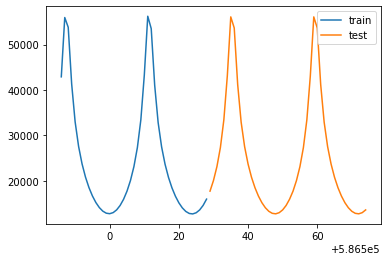

ID: 537
BEST: 4.925544045493614
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



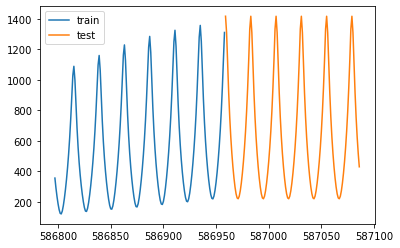

ID: 538
BEST: 4.624544598329743
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



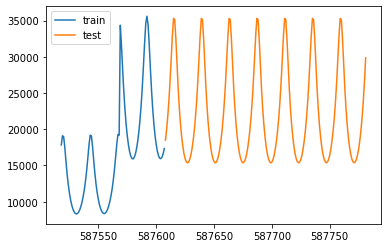

ID: 539
BEST: 0.1731924049197566
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



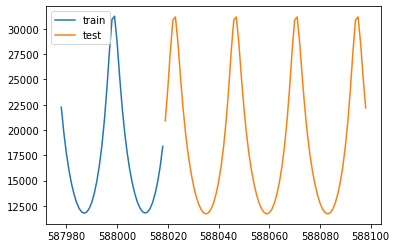

ID: 540
BEST: 1.013693580889397
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



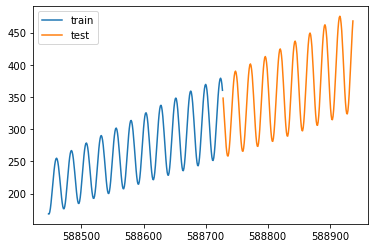

ID: 541
BEST: 7.443913484738338
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



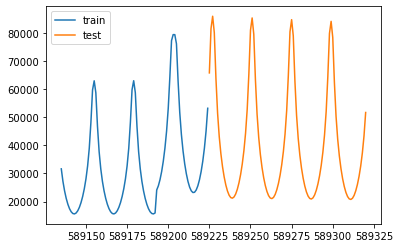

ID: 542
BEST: 36.91886926214206
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



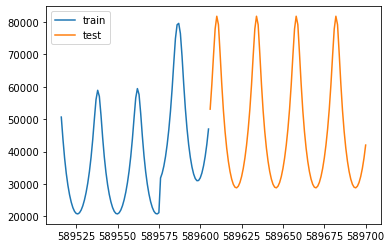

ID: 543
BEST: 22.35701187537331
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



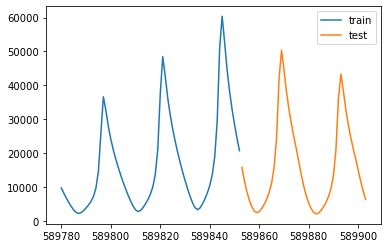

ID: 544
BEST: 10.215626666618896
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



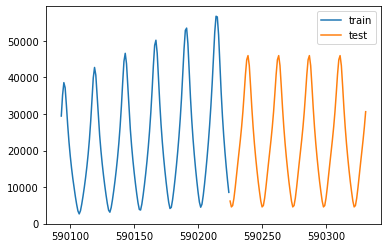

ID: 545
BEST: 11.768467343360921
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



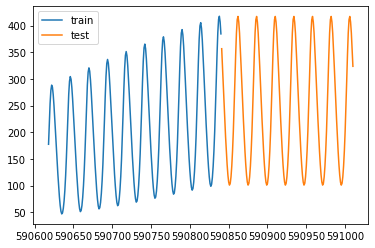

ID: 546
BEST: 0.6956140657522756
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



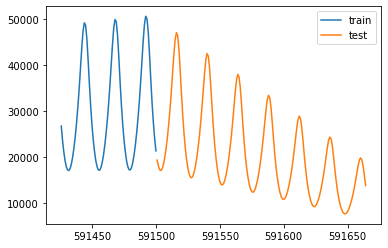

ID: 547
BEST: 7.631750380017499
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



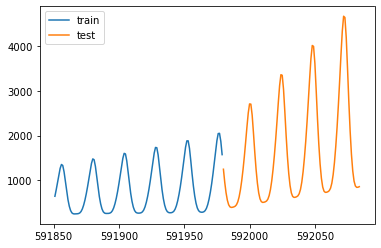

ID: 548
BEST: 200.0
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



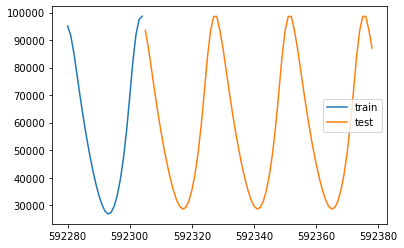

ID: 549
BEST: 11.911861327168825
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



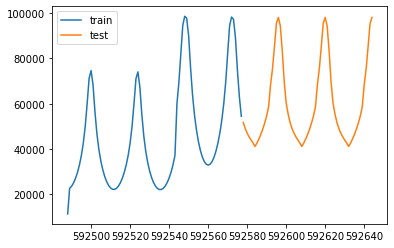

ID: 550
BEST: 4.290084717620464
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



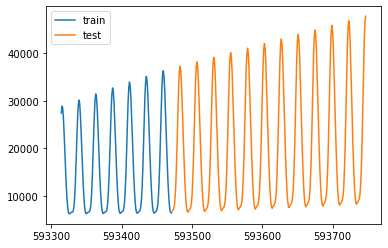

ID: 551
BEST: 8.684588813132239
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



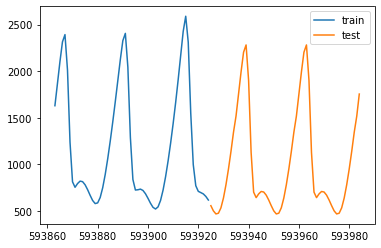

ID: 552
BEST: 5.643188084686845
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



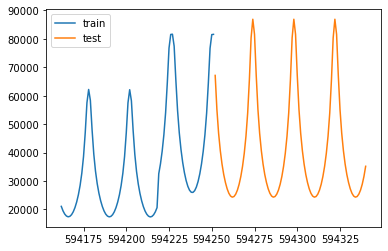

ID: 553
BEST: 0.2761485198343711
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



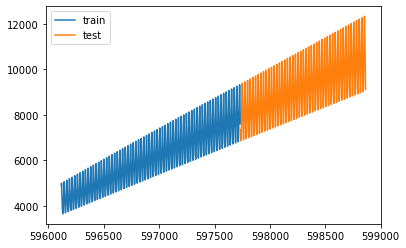

ID: 554
BEST: 26.826790164803505
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



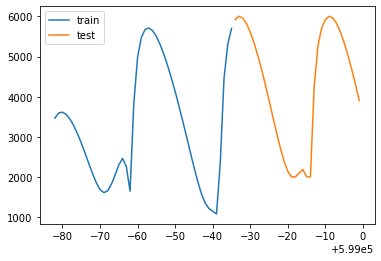

ID: 555
BEST: 0.4795631644642433
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



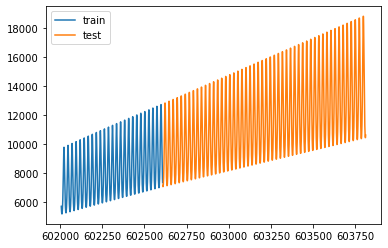

ID: 556
BEST: 12.901797453951819
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



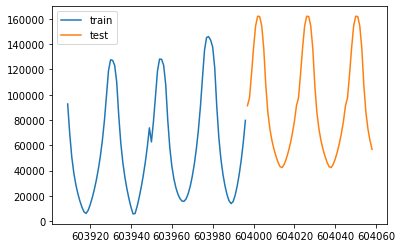

ID: 557
BEST: 0.21625764341642517
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



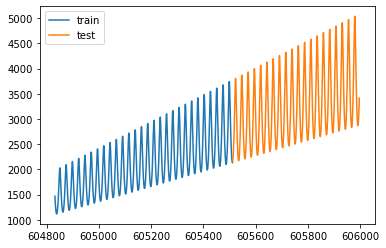

ID: 558
BEST: 0.04458776160125775
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



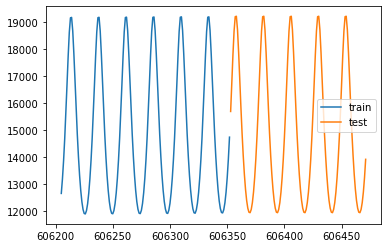

ID: 559
BEST: 7.679436304399963
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



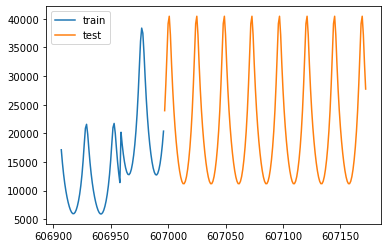

ID: 560
BEST: 0.4921357062731983
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



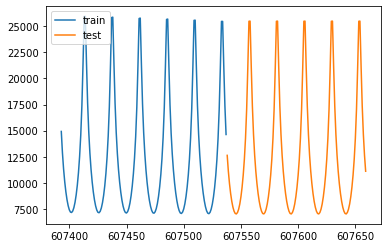

ID: 561
BEST: 4.795949419988131
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



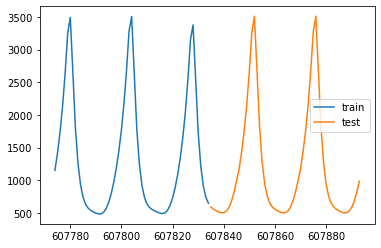

ID: 562
BEST: 0.35955532318698114
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



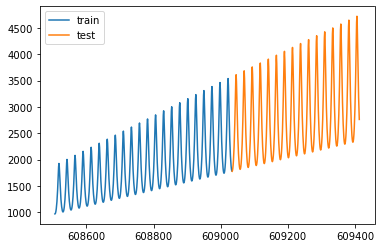

ID: 563
BEST: 200.0
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



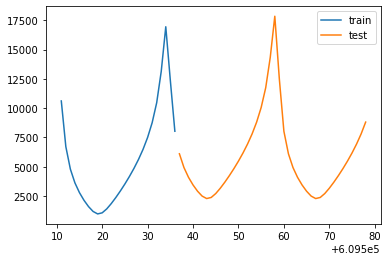

ID: 564
BEST: 8.32783012466631
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



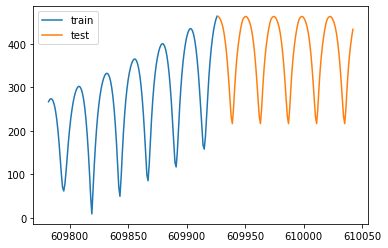

ID: 565
BEST: 0.1997212687046876
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



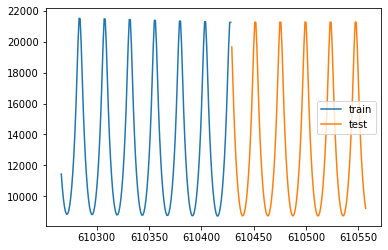

ID: 566
BEST: 2.5886902443717745
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



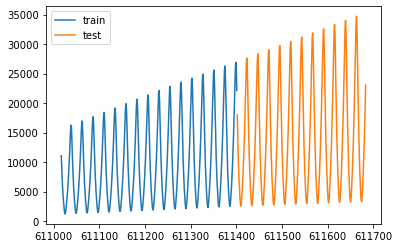

ID: 567
BEST: 3.5349643161203335
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



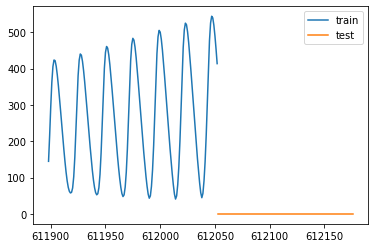

ID: 568
BEST: 0.1761619376095
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



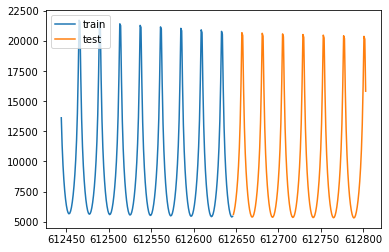

ID: 569
BEST: 0.14370893343182656
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



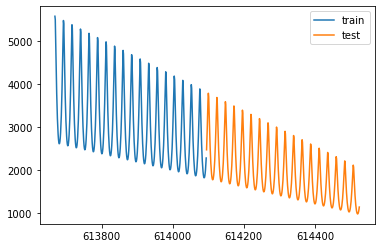

ID: 570
BEST: 3.2005777853763138
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



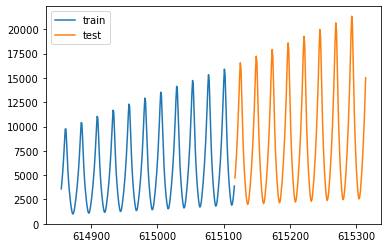

ID: 571
BEST: 0.3969781395177661
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



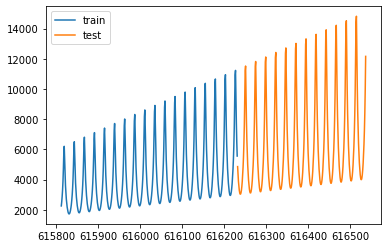

ID: 572
BEST: 5.675184077937918
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



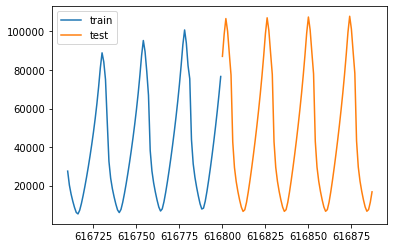

ID: 573
BEST: 13.262576266713058
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



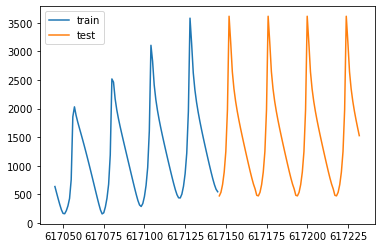

ID: 574
BEST: 1.4705364003363197
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



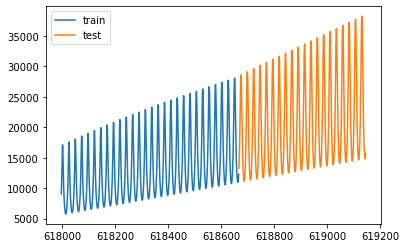

ID: 575
BEST: 200.0
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



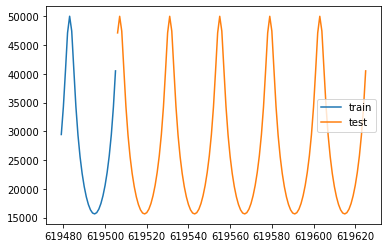

ID: 576
BEST: 177.01083429862646
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'add'}



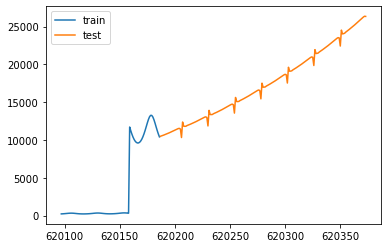

ID: 577
BEST: 0.19480122012153384
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'add'}



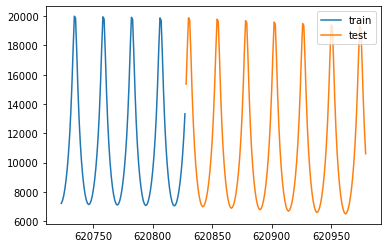

ID: 578
BEST: 5.213658860570627
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



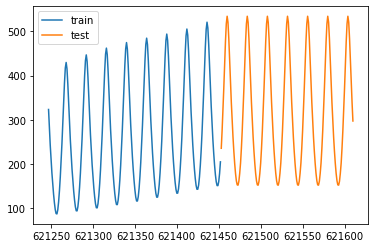

ID: 579
BEST: 2.608412183412523
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'add'}



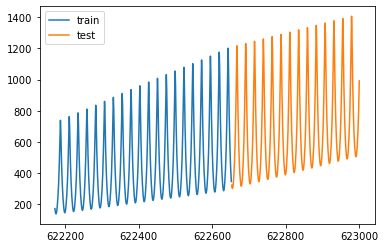

ID: 580
BEST: 40.41959578213735
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



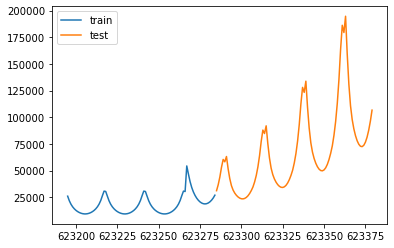

ID: 581
BEST: 0.31393720986803897
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'add'}



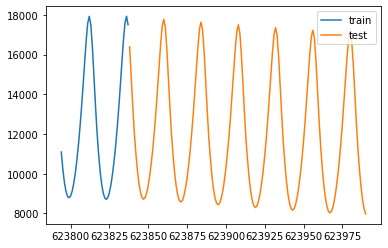

ID: 582
BEST: 1.8807240679657617
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'add'}



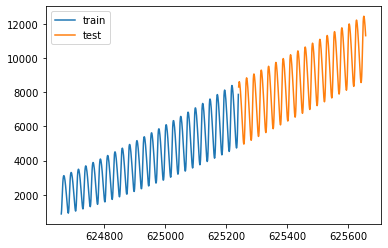

ID: 583
BEST: 0.3935454959261237
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



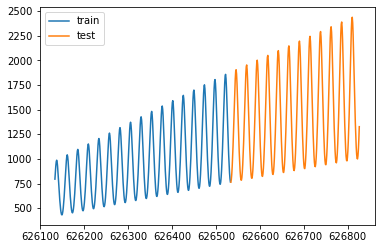

ID: 584
BEST: 11.14524566031396
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



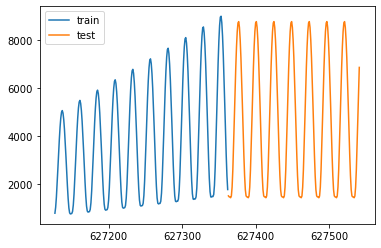

ID: 585
BEST: 49.430459506561014
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



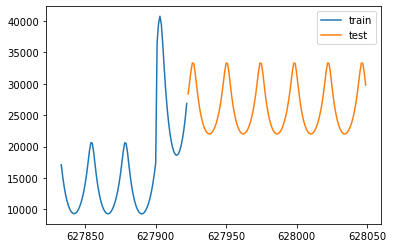

ID: 586
BEST: 3.989028095592525
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



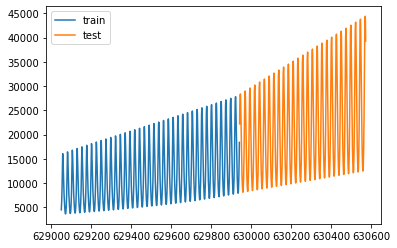

ID: 587
BEST: 3.36170464005285
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



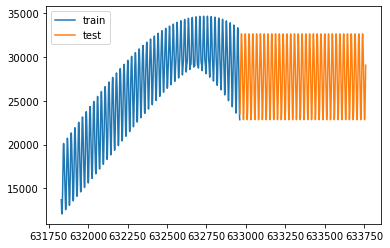

ID: 588
BEST: 0.7222882149812223
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'add'}



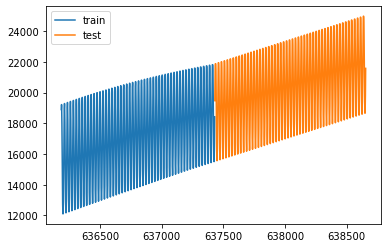

ID: 589
BEST: 4.710258610733248
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



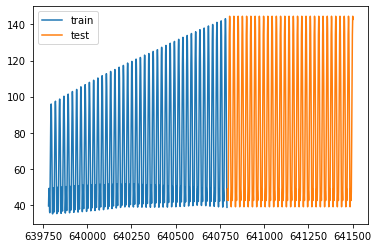

ID: 590
BEST: 1.81104887345396
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



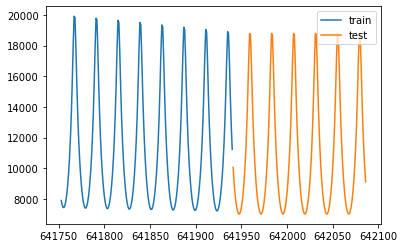

ID: 591
BEST: 7.560271043637186
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



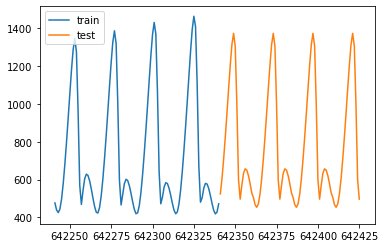

ID: 592
BEST: 2.1282372830997804
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



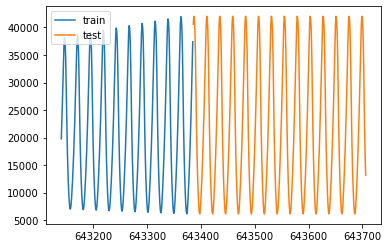

ID: 593
BEST: 0.32118088895440106
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



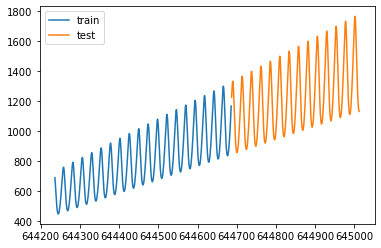

ID: 594
BEST: 1.4338576264599907
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'add', 'seasonal': 'mul'}



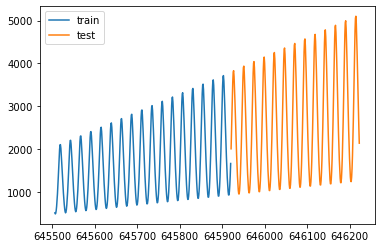

ID: 595
BEST: 1.1249112056425254
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



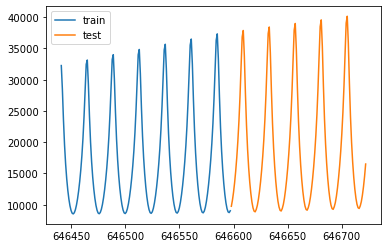

ID: 596
BEST: 148.4440527922247
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



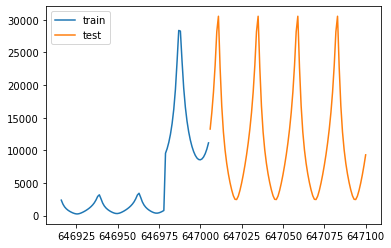

ID: 597
BEST: 200.0
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'add'}



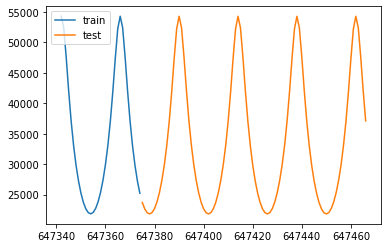

ID: 598
BEST: 1.0529210266384716
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': None, 'seasonal': 'mul'}



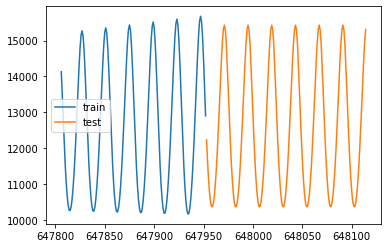

ID: 599
BEST: 0.5733397007199209
{'modelType': 'exp3', 'seasonal_periods': 24, 'trend': 'mul', 'seasonal': 'mul'}



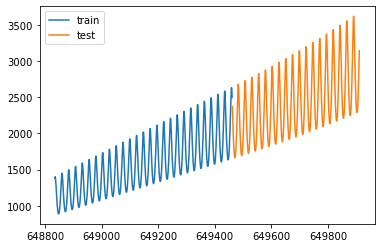


MEAN SCORE: 14.49271524786184


In [36]:
ans_df, models = make_models_search(df_train[df_train.epoch > datetime(2014, 1, 13)], df_test, all_parameters, plotPredict=True, plotData=False)
assert ans_df['error'].dropna().shape == ans_df['error'].shape

In [37]:
# for sat_id in range(600):
#     get_k(df_train[df_train.sat_id == sat_id], plot=True)

##### Корректируем
Скорректируем плохие модели

In [38]:
# model_params = {
#     'modelType': 'exp3',
#     'trend': None,
#     'seasonal': 'mul',
# }
# new_preds = predict_plot(585, df_train[df_train.epoch > datetime(2014, 1, 18)], df_test, **model_params)

In [39]:
# ans_df[ans_df.sat_id == 15].error = new_preds

In [40]:
# ans_df = pd.DataFrame(columns=['id', 'sat_id', 'epoch', 'x', 'y', 'z', 'x_sim', 'y_sim', 'z_sim', 'error'])

In [41]:
# for sat_id in models:
#     df_train_sat_id = df_train[(df_train.epoch > datetime(2014, 1, 18)) & (df_train.sat_id == sat_id)]
#     df_test_sat_id = df_test[df_test.sat_id == sat_id]
    
#     best_model = MyModel(**models[sat_id])
#     best_model.fit(df_train_sat_id.error, df_train_sat_id.epoch)
#     preds = best_model.predict(df_test_sat_id.epoch)

#     plt.plot(df_train_sat_id.epoch, df_train_sat_id.error, label='train')
#     plt.plot(df_test_sat_id.epoch, preds, label='test')
#     plt.legend()
#     plt.title(f'ID {sat_id}')
#     plt.show()

#     df_preds = pd.DataFrame({
#         'id': df_test_sat_id['id'],
#         'sat_id': df_test_sat_id.sat_id,
#         'epoch': df_test_sat_id.epoch,
#         'error': preds
#     })

#     ans_df = pd.concat([ans_df, df_preds])

##### Предсказание

In [42]:
make_precision(ans_df)

1608313919.3380034_predict.csv
